<a href="https://colab.research.google.com/github/YYC-CHUAN/dip-CTuse/blob/main/Restoration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Code for the figures, where an image is restored from a fraction of pixels (fig. 7 bottom, fig. 14 of supmat).


In [ ]:
"""
*Uncomment if running on colab*
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab
"""
!git clone https://github.com/YYC-CHUAN/dip-CTuse.git
!mv dip-CTuse/* ./

Cloning into 'dip-CTuse'...
remote: Enumerating objects: 378, done.
remote: Counting objects: 100% (247/247), done.
remote: Compressing objects: 100% (178/178), done.
remote: Total 378 (delta 101), reused 191 (delta 66), pack-reused 131 (from 1)
Receiving objects: 100% (378/378), 7.61 MiB | 14.71 MiB/s, done.
Resolving deltas: 100% (129/129), done.


# Import libs

In [ ]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import skimage
print(skimage.__version__)

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models.resnet import ResNet
from models.unet import UNet
from models.skip import skip
from models import get_net
import torch
import torch.optim
# from skimage.measure import compare_psnr
from skimage.metrics import peak_signal_noise_ratio

from utils.inpainting_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

PLOT = True
imsize=-1
dim_div_by = 64
dtype = torch.cuda.FloatTensor

0.24.0


# Choose figure

数组的大小是: (1, 514, 514) (1, 514, 514)


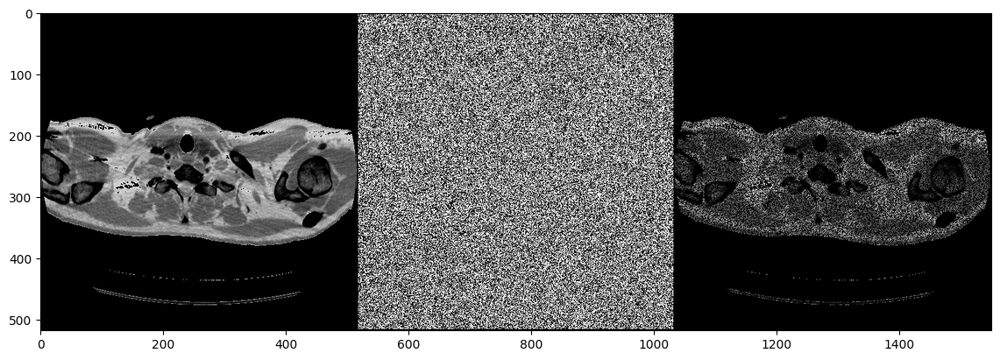

In [ ]:
# fig. 7 (bottom)
f = './data-new/Restoration/1-0002.gif'

# fig. 14 of supmat
# f = './data/restoration/kate.png'


img_pil, img_np = get_image(f, imsize)

if '1-0002' in f:
    img_np = nn.ReflectionPad2d(1)(np_to_torch(img_np))[0].numpy()
    img_pil = np_to_pil(img_np)

    img_mask = get_bernoulli_mask(img_pil, 0.50)
    img_mask_np = pil_to_np(img_mask)


elif 'kate' in f:
    img_mask = get_bernoulli_mask(img_pil, 0.98)

    img_mask_np = pil_to_np(img_mask)
    img_mask_np[1] = img_mask_np[0]
    img_mask_np[2] = img_mask_np[0]
else:
    assert False


img_masked = img_np * img_mask_np

mask_var = np_to_torch(img_mask_np).type(dtype)

plot_image_grid([img_np, img_mask_np, img_mask_np * img_np], 3,11);

# Set up everything

In [ ]:

show_every=100
figsize=5
pad = 'reflection' # 'zero'
INPUT = 'noise'
input_depth = 32
OPTIMIZER = 'adam'
OPT_OVER =  'net'
if '1-0002' in f:
    OPTIMIZER = 'adam'

    LR = 0.001
    num_iter = 11000
    reg_noise_std = 0.03

    NET_TYPE = 'skip'
    net = get_net(input_depth, 'skip', pad, n_channels=1,
                  skip_n33d=128,
                  skip_n33u=128,
                  skip_n11=4,
                  num_scales=5,
                  upsample_mode='bilinear').type(dtype)
elif 'kate' in f:
    OPT_OVER = 'net'
    num_iter = 1000
    LR = 0.01
    reg_noise_std = 0.00

    net = skip(input_depth,
               img_np.shape[0],
               num_channels_down = [16, 32, 64, 128, 128],
               num_channels_up   = [16, 32, 64, 128, 128],
               num_channels_skip =    [0, 0, 0, 0, 0],
               filter_size_down = 3, filter_size_up = 3, filter_skip_size=1,
               upsample_mode='bilinear',
               downsample_mode='avg',
               need_sigmoid=True, need_bias=True, pad=pad).type(dtype)

# Loss
mse = torch.nn.MSELoss().type(dtype)
img_var = np_to_torch(img_np).type(dtype)

net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype).detach()


# Main loop

Starting optimization with ADAM


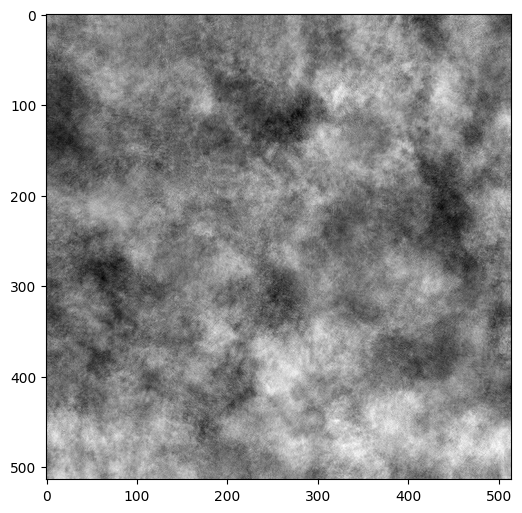

iteration:0
Iteration 0 PSNR_MASKED history: []
Iteration 0 PSNR history: []
Average psrn_masked over iterations: 0.00
Average psrn over iterations: 0.00


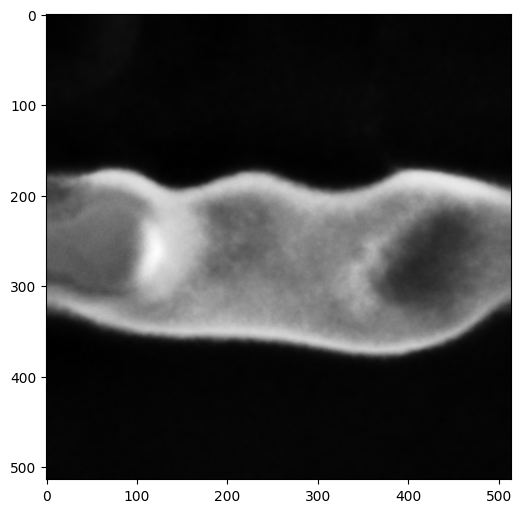

iteration:100
Iteration 100 PSNR_MASKED history: [9.723961542132592, 10.072125898301982, 10.1275569315355, 9.736368592711615, 11.35125608058306, 11.658279471751813, 12.457933695487277, 12.671347941926443, 12.990298192355763, 13.415799065703, 14.003899159634749, 14.094006027390263, 14.721181544930621, 15.110240739982695, 15.603798277003145, 15.662469060424078, 16.111604217877723, 16.31371004711428, 16.280220533511315, 16.87433931354557, 17.08465894491219, 17.372291295514916, 17.378654904925227, 17.075199200277243, 17.69314458144007, 17.954333485870993, 17.815979183397918, 18.09895142884567, 17.82291879724965, 18.43372672881188, 18.669897501883764, 18.691912594358612, 18.49441587358897, 19.073192088941227, 18.99714226174583, 18.934221827761178, 19.12287307576957, 19.107538765821765, 19.205901657292106, 19.469067700928086, 19.190707921438054, 19.47714397613173, 19.508327837810096, 19.31349604038221, 19.54742945041573, 19.796788127689698, 19.57345077542251, 19.761850520356457, 19.948228234

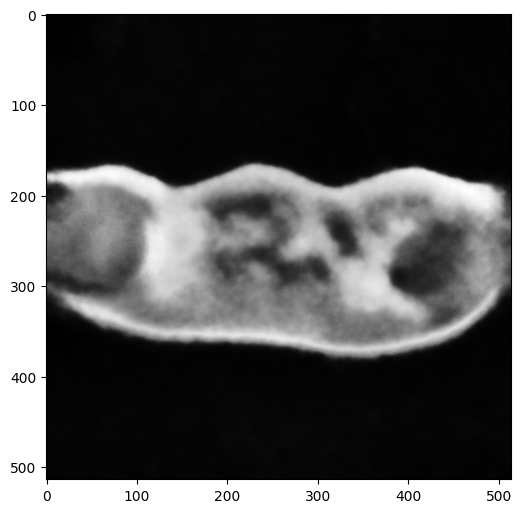

iteration:200
Iteration 200 PSNR_MASKED history: [21.437634225014236, 21.83580455293436, 21.828107459438062, 21.122811915103078, 21.720900277877938, 22.055343762745725, 21.66489476138142, 21.869697847245213, 21.870725561347527, 21.979172953095166, 21.64190364912839, 21.620953097308103, 22.00779988891384, 21.67508670910026, 21.771574776035536, 21.957397522883223, 21.972837436366206, 21.95728442802563, 21.854997136413793, 21.931762997346695, 22.11711682075186, 22.059654640678183, 22.045127153852206, 22.208382821395563, 22.387656918525202, 22.14931734726955, 22.040402816096325, 22.386803777423285, 22.438083791130722, 21.96256137142094, 22.198759157461442, 22.320192280814553, 22.50379197346147, 22.45768605786349, 22.49422362328342, 22.287978270667182, 22.500407458193166, 22.357514049798205, 22.494476656319936, 22.53569793361192, 22.510672333448372, 22.392193464521203, 22.39528769442321, 22.583629120069556, 22.693373916676734, 22.55291002043425, 22.565791368466527, 22.671114641877406, 22.46

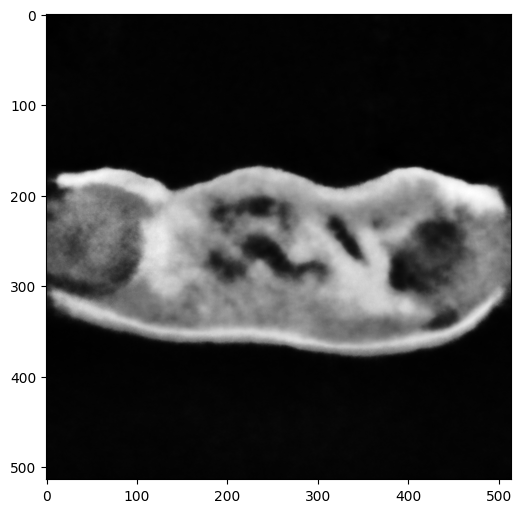

iteration:300
Iteration 300 PSNR_MASKED history: [23.015536360633927, 23.278692603636088, 22.63551690793843, 23.30989248733147, 22.989158011309577, 22.759761169647824, 23.14165257199205, 22.93103964227555, 23.22899804851015, 22.925776982890554, 23.20184518204206, 23.242538852881797, 23.25401442235336, 23.05436096123919, 23.28518340609099, 23.091372762758915, 23.090989258929152, 23.257927288958417, 23.220059254764152, 23.266986472385906, 23.23252766254273, 23.504128481586033, 23.431478980419563, 23.49981485870476, 23.487001852660235, 23.58780761176959, 23.53140209537711, 23.6424325832413, 23.332839243460064, 23.6069285837327, 23.60273719331302, 23.508742619490196, 23.60392877113872, 23.622840596463156, 23.593922371589272, 23.78141595069227, 23.64355591303477, 23.72276299440872, 23.50605546894112, 23.67578765409845, 23.680702006162775, 23.668333227140515, 23.54346523522252, 23.884379991047794, 23.623870118403367, 23.394614301525607, 23.7161953241813, 23.620661047502153, 23.73937952401348

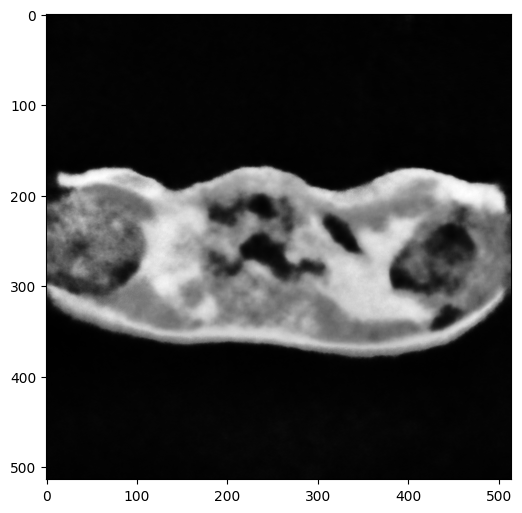

iteration:400
Iteration 400 PSNR_MASKED history: [24.068206159096142, 23.999031115779882, 24.13534071635518, 24.169442989526683, 24.107952863699083, 24.25796469134033, 24.110790337535448, 24.16625072321322, 24.27680283039892, 24.1345503930426, 24.100744373975665, 24.200638185382005, 24.171427815459367, 24.18538855878133, 23.9879100411168, 24.264196298892653, 23.939110000451254, 24.335955331837063, 24.17643146664612, 24.22166868866485, 24.173999993131673, 24.186565065181547, 24.25866707798065, 24.133451821631887, 24.12806214864615, 24.038054316879514, 24.193742140483497, 23.950635814067084, 24.2970503543458, 24.095729189993484, 24.27206969151042, 24.324415959653948, 24.39823326080834, 24.088987080164888, 24.101071302218635, 24.23718860479426, 24.170834604118753, 24.104254326796216, 24.29206025799589, 24.23972170454026, 24.114455863826674, 24.506971167525975, 24.23944484676793, 24.392040849746216, 24.321663225854827, 24.293829127893503, 24.223858754380284, 24.098833621437326, 24.41076299

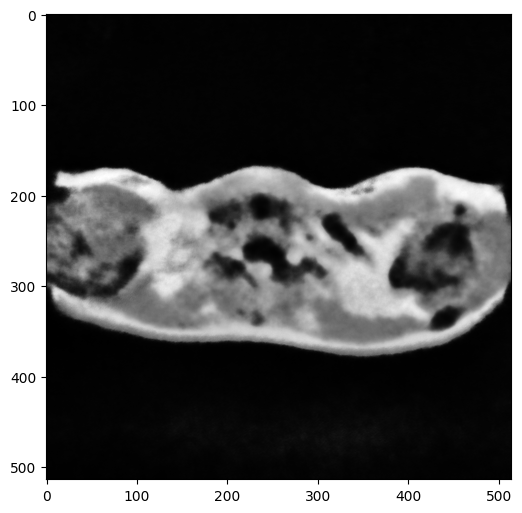

iteration:500
Iteration 500 PSNR_MASKED history: [24.701168225951406, 24.322441393171893, 24.425849003608175, 24.589004046382502, 24.47904030329977, 24.447949826012238, 24.586271481071684, 24.436280617414713, 24.68993570463561, 24.66244837690972, 24.579431997466017, 24.75730779610177, 24.628536300511108, 24.719856832329565, 24.687477012073433, 24.672504924239558, 24.71984565147129, 24.754204861622824, 24.775935736915216, 24.811720979150763, 24.67460586873271, 24.728524440890286, 24.907549094458723, 24.78650411894563, 24.775912010067795, 24.89380407225298, 24.831397065039887, 24.871562459670272, 24.7030247115911, 24.807179524535954, 24.94764406644523, 24.7588253003701, 24.67628690502306, 24.980864946230028, 24.753231868793847, 24.96712884792778, 24.733915559014285, 24.866820432071517, 24.667725568602936, 24.834320928125457, 24.737705737265472, 24.707839424827583, 24.943988936891188, 24.675977750286847, 24.677267994827766, 24.651340941885405, 24.701577269783318, 24.838951853652485, 24.76

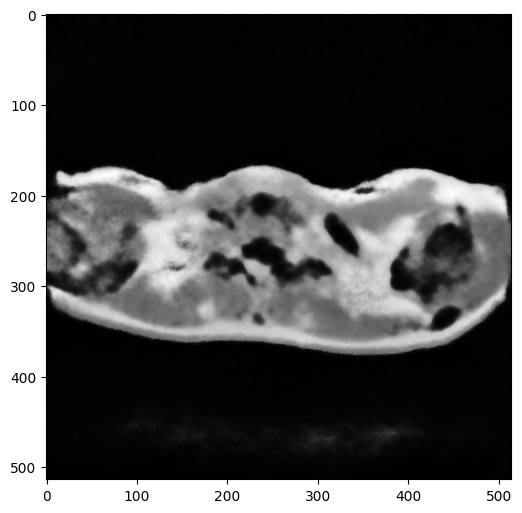

iteration:600
Iteration 600 PSNR_MASKED history: [25.22295219483048, 25.03956386023315, 25.178055800977177, 25.23447389838018, 25.20902790217918, 25.27608342353208, 24.88721239606139, 25.18688004314572, 25.257501433655452, 25.26201825930642, 25.08516894210665, 25.359836642550746, 25.217059507044173, 25.230114159145124, 25.298909254647807, 25.110388020217616, 25.11243248896389, 25.068814973775922, 25.24365910736712, 25.131854352903783, 25.326906185339798, 25.058908895039348, 25.231575784859142, 25.17125505115072, 25.195586697961787, 25.2196344309569, 25.28712939085775, 25.33279558364784, 25.24161880609811, 25.19968684653071, 25.386740188582145, 25.0851413088835, 25.31844996457096, 25.350386078609738, 25.261003429807147, 25.325200291788946, 25.12040587455138, 25.132246747563993, 25.1852889513535, 25.15908645389624, 25.2498075724245, 25.29495754787436, 25.223060011065964, 25.30620499616438, 25.333695181959712, 25.3309603852548, 25.264989490766542, 25.404679732420213, 25.26672409553727, 25

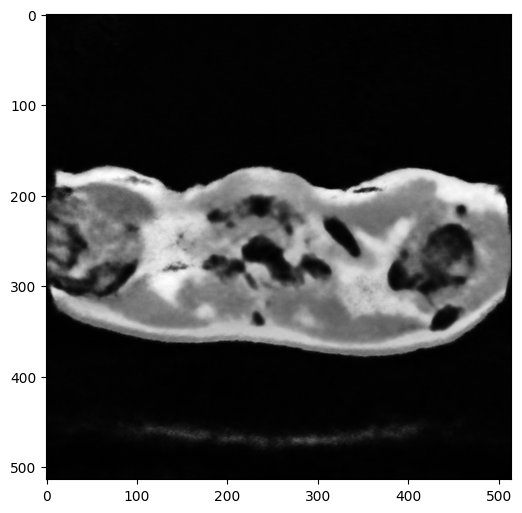

iteration:700
Iteration 700 PSNR_MASKED history: [25.489603915200295, 25.61627069622488, 25.553520114427567, 25.500006031586025, 25.561208988231346, 25.635153682863855, 25.489130977525857, 25.577679288600876, 25.461767635111343, 25.628275435291958, 25.550782128005206, 25.676384774371108, 25.447326135343296, 25.430541893509293, 25.68908228705983, 25.47021091290724, 25.57502954221715, 25.55580698551699, 25.672318377175564, 25.62674464512955, 25.623237022793607, 25.6815953959573, 25.737171744722428, 25.682500042069968, 25.669998365935882, 25.595109996659772, 25.639689674711388, 25.648040384002577, 25.61814396966205, 25.702882875488232, 25.549580294375396, 25.4791162625467, 25.335293211376403, 25.414570763245145, 25.49390249461362, 25.5622215347541, 25.52200998566142, 25.533421575150108, 25.43022810318179, 25.719417417841676, 25.641479794598542, 25.557909922893217, 25.648950518552375, 25.430733393155425, 25.579061285358783, 25.367918355018283, 25.746038147044935, 25.49183059811206, 25.7711

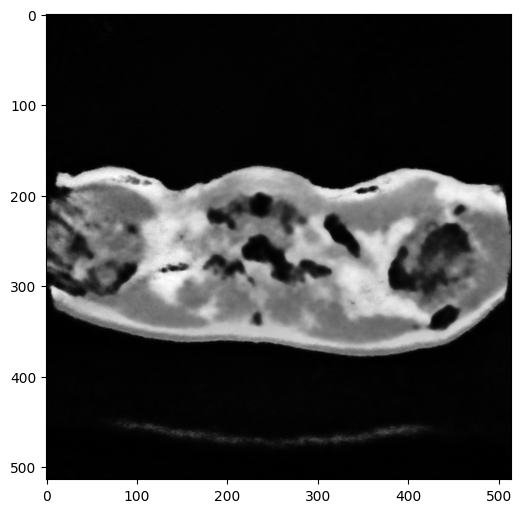

iteration:800
Iteration 800 PSNR_MASKED history: [25.91239527541031, 25.80554436642356, 25.81476059117271, 25.898714634401024, 25.878394295338836, 25.754815684467474, 25.907895905856464, 25.934916216785236, 25.70001798139988, 25.859450487779682, 25.9368540726917, 25.92980002027225, 25.88421505097476, 25.70101553777191, 25.977909335896957, 25.89930635134288, 26.083688428524102, 25.835261627757053, 25.990386754630272, 25.88022260025587, 25.74028338441051, 25.897829971218165, 25.735269046831668, 25.89039024493634, 25.78585255299287, 26.008347188231703, 25.53975080720361, 25.959388183753504, 25.852834306870058, 25.944881549319287, 25.86934075824384, 25.79766162031424, 25.93910405904886, 25.956765839247538, 25.749770353024324, 25.91191585821523, 25.628056785501304, 25.996311038386132, 25.907964648853454, 25.765422988164243, 25.841448387032525, 25.783674330212097, 25.734773830456827, 25.901019716842562, 25.880983189328308, 25.973096247621235, 25.794124429189942, 25.958749794680745, 25.905775

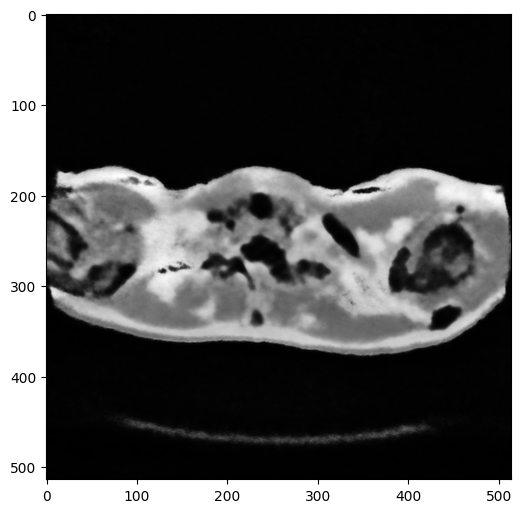

iteration:900
Iteration 900 PSNR_MASKED history: [26.234303556936965, 26.17046205682086, 26.170182876475113, 26.117532892082743, 26.202565059724687, 26.101851532109567, 26.357957721380426, 26.384950975531822, 26.316125915608385, 26.25905719899327, 26.409044722348057, 26.214486649396793, 26.292744969951535, 26.035643296471886, 26.103538892362565, 26.216798050065414, 26.153052660145804, 26.14739284012401, 26.109744462862572, 26.228322206333047, 26.20060991994285, 26.3814914979866, 26.19685533894824, 26.209535785533614, 25.82793815909483, 26.264240223958705, 25.711050527297786, 26.200554688938382, 25.89935563353359, 26.2750464718125, 25.963574244921197, 26.12688065021547, 25.94832821138511, 26.230040376162798, 25.78340902385255, 26.206997028139302, 25.62745815986777, 26.202754725001274, 25.703365131800723, 26.272249514427315, 25.8568729650747, 26.16387948696285, 26.177815467907074, 26.35864065799627, 26.25042796333726, 26.22357163746786, 26.25657673223294, 26.266156733131638, 26.216636682

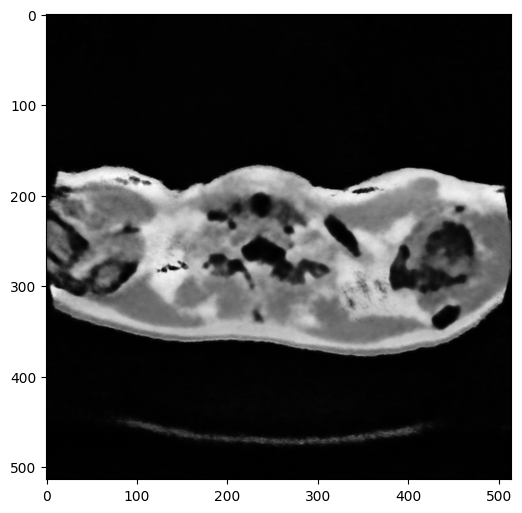

iteration:1000
Iteration 1000 PSNR_MASKED history: [26.4515024110865, 26.534440413880226, 26.62228319636132, 26.570116391787224, 26.521805094797074, 26.439086055920015, 26.527483727908063, 26.40843776238229, 26.61576802546946, 26.451590158612504, 26.585384462888612, 26.371058285430024, 26.41656711300215, 26.566855868212777, 26.484793949770122, 26.610500655236258, 26.600899127007132, 26.507409576716036, 26.507686009539118, 26.655490002271705, 26.538996125143747, 26.520247447353814, 26.61811025949673, 26.6786904123877, 26.69434193997878, 26.70848313124068, 26.64279051106869, 26.67804454414116, 26.681807741444743, 26.72732835368865, 26.62074732922692, 26.7026867702397, 26.635557100063988, 26.77087443184047, 26.529487314010915, 26.778705354700627, 26.41056303042097, 26.635584866578466, 26.50028982646478, 26.459269928165092, 26.669816583446433, 26.419443879397384, 26.626158137256937, 26.500042006170844, 26.696712739877388, 26.610896945423686, 26.71005131978938, 26.317327921928168, 26.616399

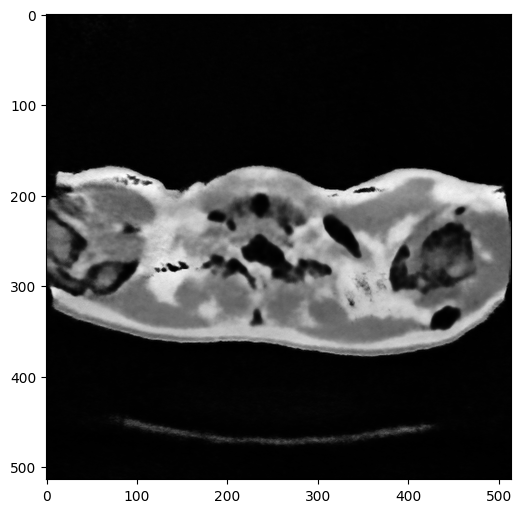

iteration:1100
Iteration 1100 PSNR_MASKED history: [26.597277600030587, 26.788892666936235, 26.77218219655071, 26.80880788978484, 26.606870387906202, 26.604175117936965, 26.7497153479472, 26.707955981674402, 26.867584503924654, 26.410739454055975, 26.87615393409883, 26.75299392583018, 26.690509183235463, 26.938804128237535, 26.660138868950988, 26.768664371527265, 26.79501508498786, 26.854869753634528, 26.675468884122672, 26.733691779706565, 26.683309023398515, 26.76246744502693, 26.798733046464108, 26.732876289618588, 26.866801090277303, 26.72963033374667, 26.751859429786528, 26.7446080935299, 26.7252293799497, 26.65940470247711, 26.772856686497292, 26.67716575518169, 26.713556678559986, 26.64279232628867, 26.753910192954557, 26.66313476079743, 26.886449748861168, 26.82481594223006, 26.7574382608818, 26.74524993818778, 26.74201271395934, 26.736859463194264, 26.624901344974987, 26.835184512347045, 26.67297626993518, 26.876743484256565, 26.387325682442295, 26.85863311174362, 26.650246964

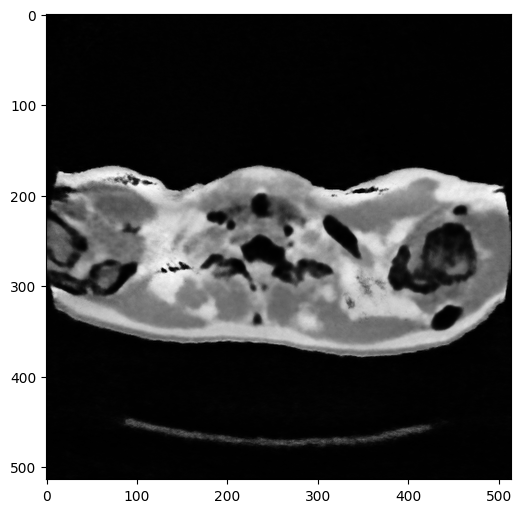

iteration:1200
Iteration 1200 PSNR_MASKED history: [27.068910719717966, 27.024093870378607, 26.9761540341667, 27.016156009056644, 27.033281081820697, 27.127766890825438, 27.060662867147695, 26.93877524845704, 27.185231166574116, 26.90015955529955, 26.98839269837255, 27.068289356577388, 27.204960791674168, 27.17047727668692, 27.05819480797643, 27.07709296617208, 27.2095768530364, 27.031859168494478, 27.059506312153417, 27.174452937480673, 27.02531414102306, 27.093322240802145, 27.089959514475446, 27.05012705747997, 27.11288872701045, 27.180953889296752, 27.203752377512714, 27.064167914249463, 27.088660678667075, 27.14210247233602, 26.926892167871284, 27.118478923789837, 27.09721214092393, 27.154368051785664, 27.073698834294724, 27.053620941783922, 26.991298824396132, 26.868323852947242, 27.268542125000188, 26.986977201081537, 26.692491539021184, 26.814317269313865, 26.642498596444078, 26.703288338276767, 26.737230563791492, 26.766379617645484, 27.137216966765134, 26.819591791463804, 27.

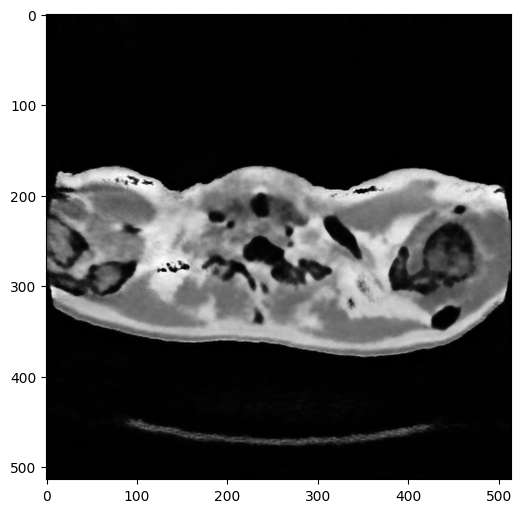

iteration:1300
Iteration 1300 PSNR_MASKED history: [27.05968101909484, 27.150411172365665, 27.239418157620555, 27.314045856313133, 27.13093165505998, 27.24016553775489, 27.13212339974946, 27.10939285020786, 27.067089884387464, 27.2209772173751, 27.100854484118244, 27.250625432767603, 27.039727818205787, 27.126505814956335, 27.227361010733176, 27.082972946996854, 27.10711779389694, 27.187435944779494, 27.066631259002616, 27.313058482244415, 27.283750720943658, 27.285534333059253, 27.293414234006605, 27.306344361127298, 27.407779519378145, 27.288806439100846, 27.288009496633748, 27.426323333803158, 27.17380279566372, 27.218355332534124, 27.20285470839122, 27.163997095839143, 27.193189651867804, 27.279557407011048, 27.476757203661123, 27.163186107085213, 27.298807923780323, 27.35175229624553, 27.107066667648667, 27.189401617856383, 27.273126125886314, 27.090629546887655, 27.352390271490457, 27.06725794280917, 27.23963667759756, 27.180184714919648, 27.204436119930335, 27.272277610376676, 2

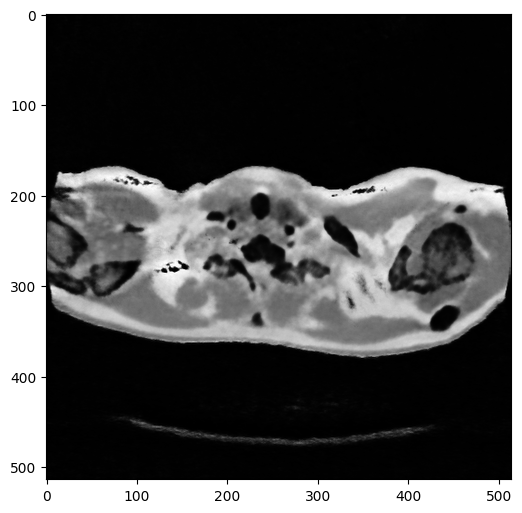

iteration:1400
Iteration 1400 PSNR_MASKED history: [27.401589511861282, 27.19159061613885, 27.449571095349302, 27.31221056310894, 27.303191715357382, 27.469618014601764, 27.55867071812249, 27.417077847779453, 27.535922517326878, 27.46281150739818, 27.49253397475567, 27.39691403207759, 27.49934975911403, 27.381394758399008, 27.57615752947767, 27.348260590829675, 27.398461304110008, 27.439583476828275, 27.569037704059767, 27.509107137567966, 27.31791785234462, 27.600299354075656, 27.354134088743134, 27.418786358433728, 27.379912467879322, 27.575211028248148, 27.428526474158403, 27.684832179484378, 27.516310509913385, 27.629526229207233, 27.428359121793857, 27.61566358027768, 27.720794611023543, 27.491923009329504, 27.545854663848395, 27.4807067497091, 27.51987107646182, 27.44643904406443, 27.552127051676468, 27.42757963832963, 27.67393280691699, 27.41946425597736, 27.720852706448817, 27.597302260596347, 27.45947221400009, 27.638728776455093, 27.295267324885316, 27.603602209456465, 27.392

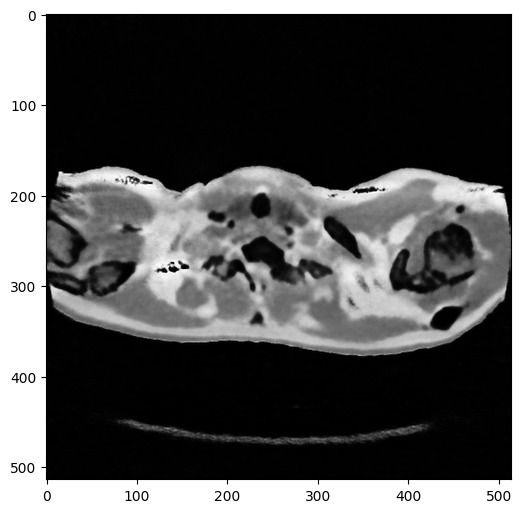

iteration:1500
Iteration 1500 PSNR_MASKED history: [27.436547109726483, 27.424492091406233, 27.635569374972114, 27.216727812799544, 27.726866938298585, 27.38584003333747, 27.656170813298246, 27.521301426905907, 27.776716177991663, 27.641854371103967, 27.683126499535398, 27.67040635598914, 27.72186215228477, 27.67309484036354, 27.67423835441881, 27.456483808288684, 27.37385499643747, 27.683936589725576, 27.739623594859623, 27.583394076597823, 27.57351062993843, 27.511784261911487, 27.884557023954216, 27.746025282289082, 27.791318154310524, 27.8161605339253, 27.761734461570438, 27.746772106580625, 27.779179011328488, 27.85199875960357, 27.823937877328298, 27.956132367100924, 27.756477388417792, 27.937567630226702, 27.750115205128782, 27.732995980482865, 27.89529326313253, 27.832373248564743, 27.87676616185092, 27.755457052594853, 27.923016328913597, 27.78195405266271, 27.87060080547864, 27.84212348274652, 27.765945566269647, 27.753757608722395, 27.893098524875846, 27.838035271381703, 27.

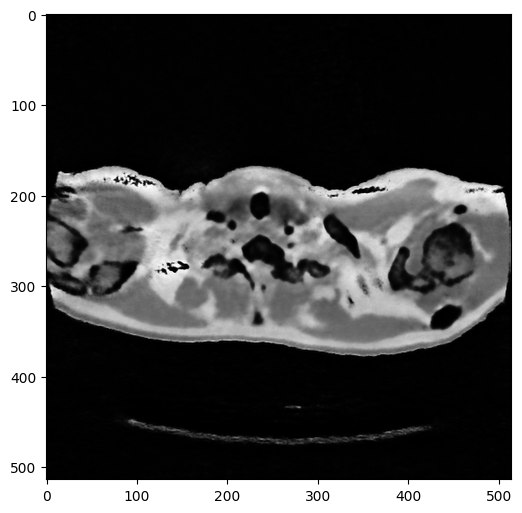

iteration:1600
Iteration 1600 PSNR_MASKED history: [27.78999946352997, 27.738109673053994, 27.788473859805865, 27.875945247164815, 27.74867770146864, 27.90023206664428, 27.843637911298554, 27.819555885250974, 27.872032500085563, 27.81770975218766, 27.817216887305065, 27.92746366738692, 27.871829323801197, 27.98797433468014, 27.94159531347894, 27.749298310515687, 27.89680479067263, 27.802392652668416, 28.137898327086788, 28.008478274287253, 27.916958445669458, 27.844333749046545, 28.00200722917007, 27.922380747737932, 27.989568100410352, 28.037280213924603, 28.051934551326084, 27.941655225686233, 27.947983015105514, 27.959752376274732, 27.978025782946865, 28.13122964030279, 27.78722808773785, 27.93886031275223, 27.90912944534871, 27.918943949014906, 27.962448882112216, 27.92003129867129, 27.97419669545592, 28.14047287480257, 27.801877093264494, 27.947491779171894, 27.8117903144572, 27.90440179098749, 27.706064904315287, 27.817645713644886, 27.57966263194206, 28.02530154964311, 27.802757

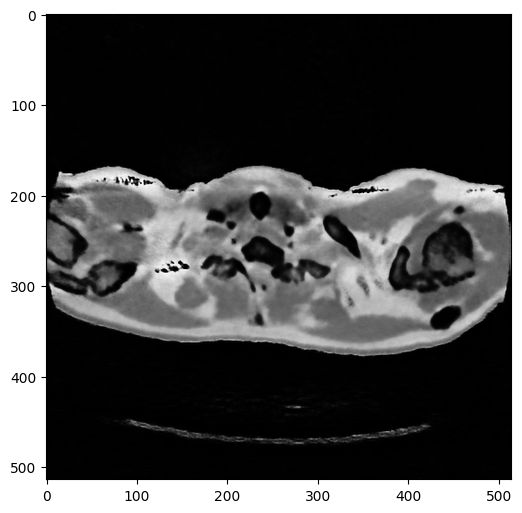

iteration:1700
Iteration 1700 PSNR_MASKED history: [28.23463857891928, 27.96471926327934, 28.24017691111889, 27.862533975842908, 28.10355040574298, 27.992310550920344, 28.199621844377948, 28.016629893809203, 28.136875364775054, 28.156378799657837, 27.643544282293405, 28.187395990912982, 27.856585060581374, 28.194884133980388, 27.935870454985636, 28.04679050665982, 28.08929140074133, 28.082605864857864, 28.154125454817176, 28.06211511569898, 28.247378579863152, 28.130713147363053, 28.23146764864539, 28.093709484756726, 28.179408718573992, 28.1931101026125, 28.112684955828712, 28.220909876740414, 28.225645165444824, 28.274589027027275, 28.046312468928022, 28.293166786959336, 27.974776978420195, 28.291752627766968, 27.984632583397385, 28.29807812713743, 28.03603385210382, 28.316987120478622, 28.21937953758344, 28.206016298297957, 28.305405806802387, 28.289715477028782, 28.335204928400298, 28.292923448248267, 28.206793651139392, 28.10328315643574, 28.21597842704993, 28.217816629140508, 28.

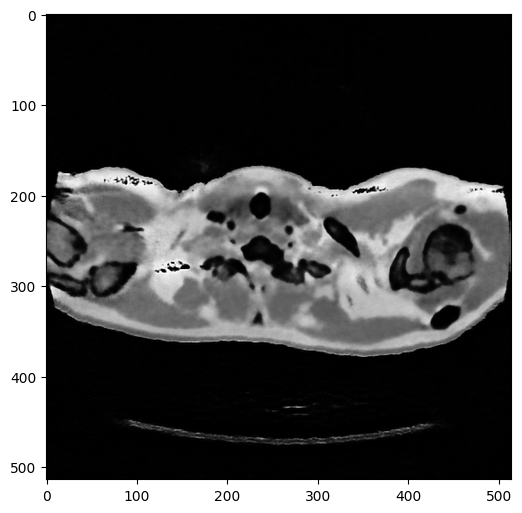

iteration:1800
Iteration 1800 PSNR_MASKED history: [28.293443809248394, 28.466901534719227, 28.343248882294624, 28.46476332914214, 28.500900621867796, 28.430839713143982, 28.510438427346905, 28.44137192213409, 28.43263765487421, 28.286607612695313, 28.401399740816103, 28.45659148864193, 28.577033982563908, 28.58915381302659, 28.598256083455787, 28.47456366420762, 28.523609730878533, 28.455800791430338, 28.63558727824428, 28.353294374260866, 28.507691972381117, 28.512553901947186, 28.361542649210648, 28.460131929848203, 28.38152804608297, 28.419641363487607, 28.61901898625231, 28.34210505127464, 28.386817074830333, 28.592783837467227, 28.456247292038285, 28.447495956142177, 28.341292687282756, 28.525828708068182, 28.286570942458837, 28.362020040610574, 28.49532391574645, 28.458743822128525, 28.431257340775986, 28.41042831683092, 28.288116354634198, 28.511323694749585, 28.2732505552946, 28.45774554397554, 28.4546579360477, 28.553909169570773, 28.418912290173036, 28.58517576073748, 28.361

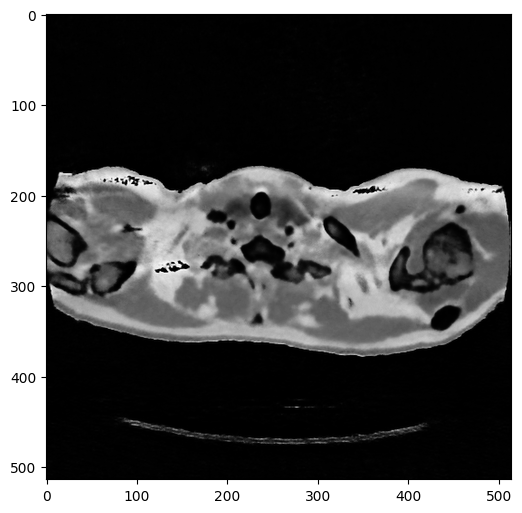

iteration:1900
Iteration 1900 PSNR_MASKED history: [28.605144049227412, 28.43860731388201, 28.674380094191108, 28.66742540411712, 28.58351479780067, 28.54422692948198, 28.60932590271561, 28.548922758387967, 28.621591070609927, 28.508384452338518, 28.77585478447131, 28.484699462042244, 28.47445992220004, 28.465627022785597, 28.327875532071847, 28.506870411225336, 28.751627286307514, 28.615227188660313, 28.50721328879963, 28.725354008365038, 28.671894395569137, 28.601429677230943, 28.55316227535692, 28.66557360110505, 28.50617174504402, 28.677116808551766, 28.31905903719837, 28.565915893759023, 28.12303265277503, 28.465337836416673, 28.49976194605023, 28.464769816565454, 28.57918563958281, 28.34529025068861, 28.561710968587132, 28.191818852696663, 28.639496588516337, 28.165448947781464, 28.54125735233081, 28.34604326087063, 28.582266223400982, 28.319256873221708, 28.55487116553406, 28.392060246935614, 28.424745730136554, 28.634735853795412, 28.447008655531832, 28.487223322143947, 28.4020

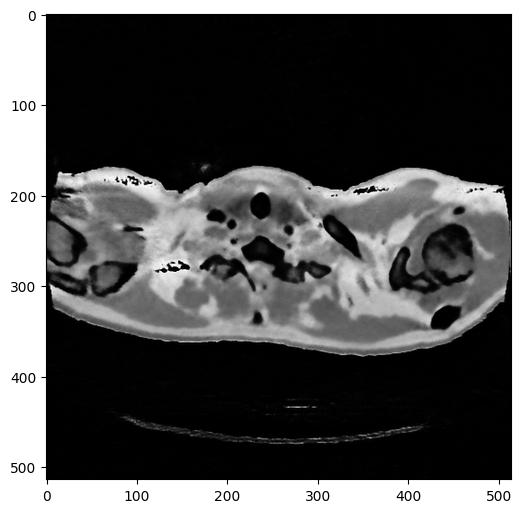

iteration:2000
Iteration 2000 PSNR_MASKED history: [28.91822743852922, 28.81114437991036, 28.878959389432993, 28.816864981803402, 28.803460610199853, 28.964960204264635, 28.889918487685403, 28.753991685553576, 28.669414343276806, 28.851171170602647, 28.84795881952911, 28.810347000567717, 28.821870859923354, 28.674735707980616, 28.882110852453856, 28.749976974271583, 28.859284336119373, 28.88814345781484, 28.623924346738058, 28.80783378356659, 28.99663754485067, 28.852602074517407, 28.92132777083679, 28.816806231207366, 28.87761894530162, 28.78739067999004, 28.919285850081625, 28.78779801125051, 29.02695676591341, 28.989265687844803, 29.0069046065843, 28.90391655032827, 28.776144561382424, 29.007352251911026, 28.884481253394068, 28.964080426882187, 28.994787859438397, 28.972177709784116, 28.897322830450317, 29.063173693142556, 29.03243289061393, 29.23502611635945, 29.014049672139794, 28.904929186121695, 28.715262522472745, 28.962661326906655, 28.69876468261807, 28.75834090805252, 29.159

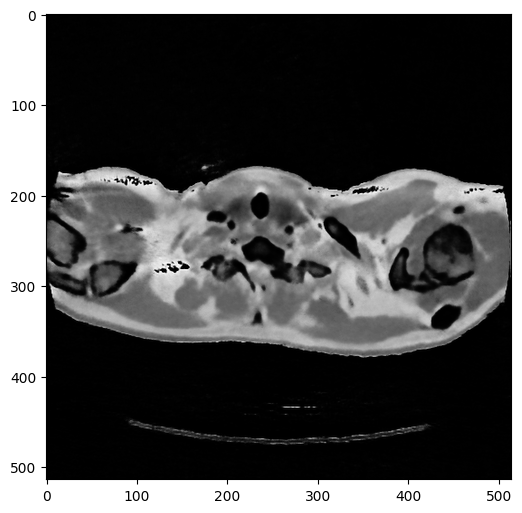

iteration:2100
Iteration 2100 PSNR_MASKED history: [28.98963915269523, 29.156340393340265, 29.07287579839859, 29.095417243074095, 29.135006676154127, 29.157325811767983, 29.025420238721008, 29.137839781514675, 29.075648697894042, 29.234797624466054, 29.22859278107609, 29.271680782187612, 29.187612922163886, 29.370069486104647, 29.139287338020743, 29.291203798009143, 28.9907719079969, 29.13050154844839, 29.11200604988865, 29.1768228707907, 29.171803295685304, 29.157844338645845, 29.2894597974715, 29.16227152244877, 29.15423488313563, 28.98814569214842, 29.108524494873123, 29.040674966000736, 29.082789061979643, 29.142660185692325, 29.223173028302803, 28.755030015652, 28.685163011295668, 29.19875586450667, 28.80193558009362, 29.11798639004338, 28.83688943979263, 28.94020416498809, 28.951829079367922, 28.871718856372933, 29.069692950345114, 28.986070344765025, 29.200037331377406, 29.03783052082929, 29.179512705393087, 29.161557386236424, 29.157840533634133, 29.12389008039127, 29.188840249

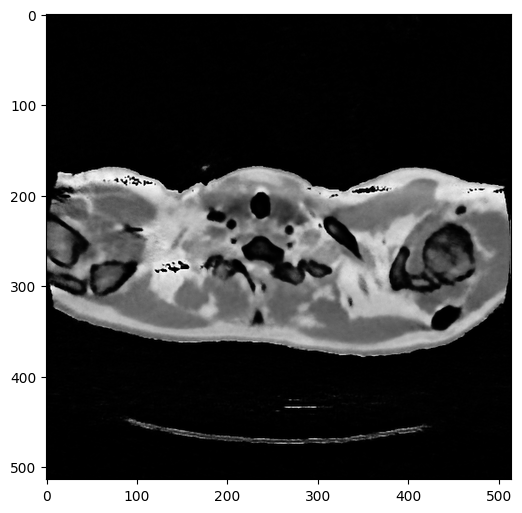

iteration:2200
Iteration 2200 PSNR_MASKED history: [29.013146138031356, 29.179341214425783, 29.095648357454884, 29.16811791701845, 29.263671761378593, 29.18288189934575, 29.298593391060766, 29.179337440251096, 29.359372670731403, 29.175371563569858, 29.18957990987806, 29.130402741302113, 29.326166563166026, 29.36589589073626, 29.496547089396316, 29.390226247845316, 29.37445000586525, 29.16915236485896, 29.283185548218434, 29.21024135191114, 29.292149371799173, 29.29887938660511, 29.34302968094194, 29.34079250459957, 29.072235898931673, 29.190960179701815, 29.445081110841386, 29.535204764195942, 29.512391036287383, 29.56768425107001, 29.479699785898667, 29.397831569332986, 29.409608138614132, 29.598030459308582, 29.308818405834806, 29.647772222761063, 29.388666910436235, 29.460824692536075, 29.305322538021386, 29.64879299238063, 29.391110680425527, 29.44769607928953, 29.593582874888632, 29.300378320554334, 29.432652639489167, 29.441375813978006, 29.058888684212477, 29.609388858639555, 2

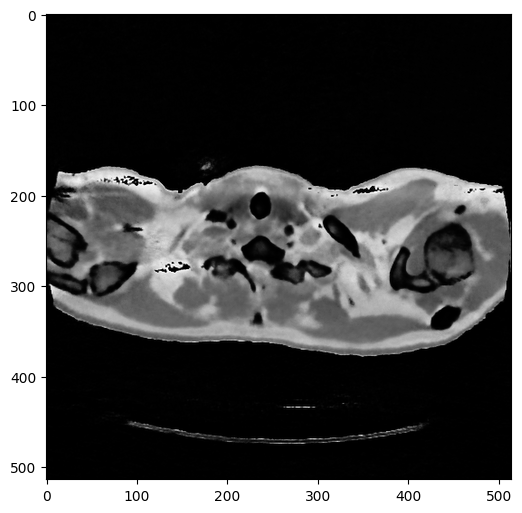

iteration:2300
Iteration 2300 PSNR_MASKED history: [29.213958177069443, 29.377754329865475, 29.386680926399407, 29.36398484053951, 29.624029297934356, 29.47317232897288, 29.555121258175973, 29.365872072396915, 29.57083424714259, 29.506362918344493, 29.511242607276643, 29.499569019091663, 29.59500038603084, 29.619188635508547, 29.581565317173602, 29.886186680585432, 29.43091352619254, 29.46047160125618, 29.63539395396685, 29.27524152481415, 29.666742104653526, 29.326024652921838, 29.53655954634503, 29.527297595811227, 29.582992974162835, 29.51868035669856, 29.615229564283286, 29.437890189448108, 29.490756433897776, 29.534834063588796, 29.464011760100284, 29.493929154362664, 29.655973970169217, 29.643463079820044, 29.610600604071934, 29.588873778952816, 29.71854816702107, 29.538124520013795, 29.688221394550062, 29.65934623337148, 29.483123885387727, 29.681573769651223, 29.546318167384374, 29.778029330650597, 29.464458368723907, 29.386786986141125, 29.45729470108786, 29.506355397222833, 2

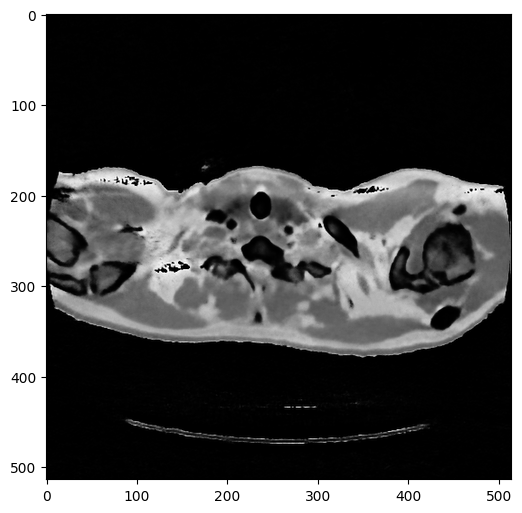

iteration:2400
Iteration 2400 PSNR_MASKED history: [29.818868239614595, 29.86966334098398, 29.76767400901469, 29.770113830917097, 29.670952200341464, 29.79737645906331, 29.676786143613178, 29.88607481965159, 29.600762697057288, 29.66201438049399, 29.48352747741104, 29.710539646687927, 29.94889048158353, 29.88450523526966, 29.866703247958128, 29.861881337688914, 29.66304825321673, 29.88422936459608, 29.809818555440128, 29.489135853317965, 29.579735067510832, 29.507137598687795, 29.475111002215595, 29.579189176521915, 29.54980469008561, 29.56888981175403, 29.682573104660968, 29.458693229758588, 29.646895671600998, 29.640080049578952, 29.689453159229927, 29.78671969130861, 29.702972922296027, 29.864964859909456, 29.658704229511624, 29.8702767635646, 29.770463427381983, 29.739301373603467, 29.912722048986197, 29.810474192675546, 29.99852067527442, 29.763840565150886, 30.024539435323128, 29.816546651913164, 29.870807690688533, 29.8023942878375, 29.781815166971633, 30.19129899261531, 29.9087

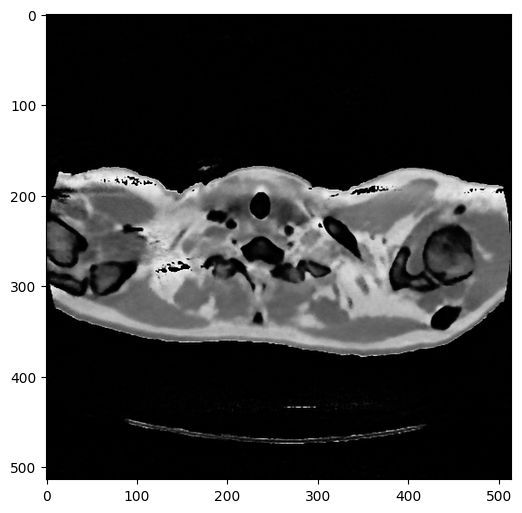

iteration:2500
Iteration 2500 PSNR_MASKED history: [29.89297722661454, 30.101895385579688, 29.943331276776167, 29.907651286574644, 29.99801503575498, 29.83342084468709, 30.114993886211586, 30.053103495004656, 30.36998511602465, 30.025068893439936, 30.160788017059318, 30.156342594238367, 29.784382969432684, 30.038849385692778, 30.333932958748242, 29.95812941449391, 30.253707696326202, 30.035026311270908, 30.344252096878552, 30.250094121296584, 30.382621450540952, 30.32276322864139, 30.22772147010196, 30.24538406690898, 30.1803339696174, 30.096370058609935, 30.038894747423992, 29.987275171856584, 30.253759803026348, 30.102739242449044, 30.003632388215415, 30.11176611233534, 29.99576048705635, 30.056866988565567, 30.06273306234592, 30.13736163057681, 29.968991598249083, 30.122277842648057, 30.100838888290724, 29.939117443583637, 30.30166200175122, 30.14287534468663, 30.212156810991154, 30.182865169948712, 30.40552118376884, 30.061624565337635, 30.06357823909925, 30.15787395346047, 30.2008

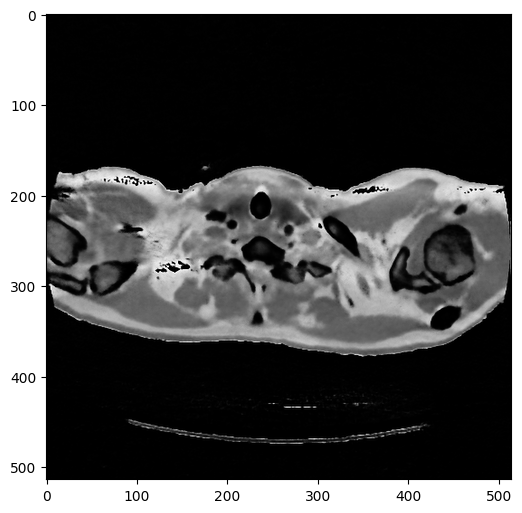

iteration:2600
Iteration 2600 PSNR_MASKED history: [30.147783561430405, 30.465372946980686, 30.395210406718554, 30.299628841267353, 30.415438353327886, 30.053344143531188, 30.278036556932495, 30.27822176692199, 30.322569790466826, 30.313122710555728, 30.213708010859776, 30.21116496104021, 30.095523413263408, 30.524342561623516, 30.226548717637773, 30.161749834500917, 30.10064876029176, 30.308325828668792, 30.381467570724098, 30.165316788733122, 30.364503172167126, 30.32980148216282, 30.139628475150126, 30.35385141496482, 30.403579838402926, 30.312038127826376, 30.372665504405436, 30.44139397247793, 30.50313268624741, 30.4846029469191, 30.38260224587638, 30.35943082747626, 30.150113626717676, 30.490650259162845, 30.4428935837031, 30.21171558215313, 29.757225123553482, 29.70090239831358, 30.25608080097632, 30.472186485066185, 30.185040834276855, 30.297174711383185, 30.462278943854535, 30.34866753166249, 30.538523357576516, 30.13061215373043, 30.512846100661285, 30.34265514028842, 30.5431

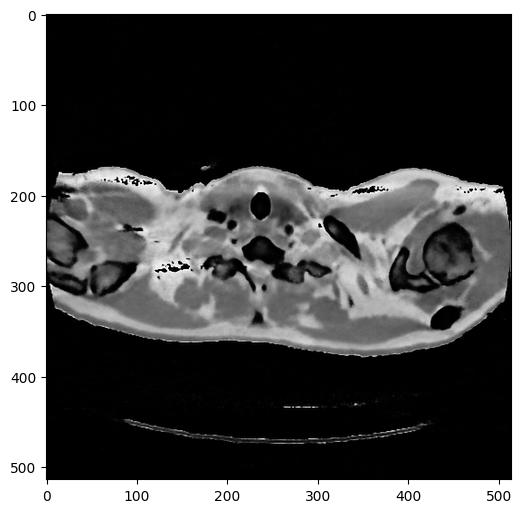

iteration:2700
Iteration 2700 PSNR_MASKED history: [30.498124075068972, 30.11688975080583, 30.56087446442382, 30.526239453631433, 30.686914988818863, 30.406015085893586, 30.126522529060857, 30.491445396374132, 30.47140395380621, 30.311010281385418, 30.47917538856998, 30.208671928056653, 30.14412723755711, 30.128729907926733, 30.197938321678738, 30.382557416738006, 30.624261469362544, 30.398053575463884, 30.066242192885202, 30.21129652320205, 30.129028018452885, 30.401720723942717, 30.284079742746904, 30.183387552790997, 30.464117431052102, 30.47995790010265, 30.483227564554667, 30.445269380419624, 30.50489464628488, 30.407996653188306, 30.294028621580882, 30.61767316238271, 30.726597948160965, 30.61740723559032, 30.57666083500579, 30.517795190953546, 30.68099575427032, 30.64624439447643, 30.651940971494657, 30.507071564532406, 30.64225972346064, 30.6638211042958, 30.581787739243083, 30.71099237939611, 30.74071371079252, 30.812320995806264, 30.649533460166133, 30.524567406858832, 30.585

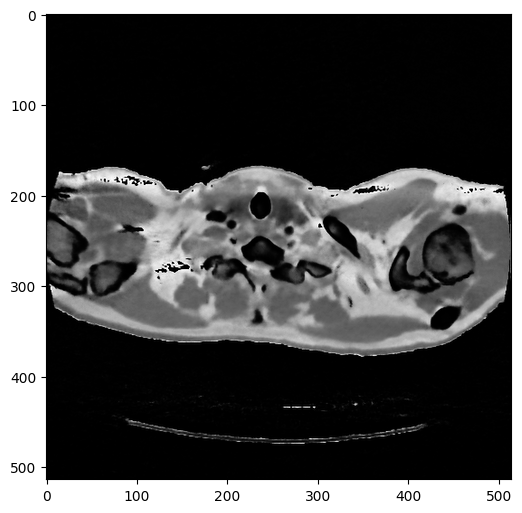

iteration:2800
Iteration 2800 PSNR_MASKED history: [30.71744339105296, 31.01372083938014, 30.52978254028237, 30.831221664628806, 30.781148651740654, 30.899477220028942, 30.65233326837074, 30.935511533106997, 30.607031160977098, 30.917422247258894, 30.67524325348627, 30.984904696036978, 30.835182782008804, 30.59318563962374, 31.054062078414056, 30.700792201111092, 30.928751825368987, 31.095383403314656, 30.794195868738846, 30.88878895371714, 31.00179227747048, 30.965679943610994, 30.933587891092596, 31.000174276861998, 30.902983429046863, 30.706928555142188, 30.711778496485195, 30.937418284742897, 30.957486525347452, 30.96697144799506, 30.880376105865203, 30.753792703841913, 30.78204044767023, 30.493884490232016, 30.729732070479635, 30.52915838147083, 31.01084707574411, 30.70772630052465, 30.639558349310146, 30.54235010793139, 30.33275678162456, 30.54592248778205, 30.716440719382945, 30.628861970114833, 30.879603277662685, 30.3999545197164, 30.554348879143372, 30.91984507596866, 30.6617

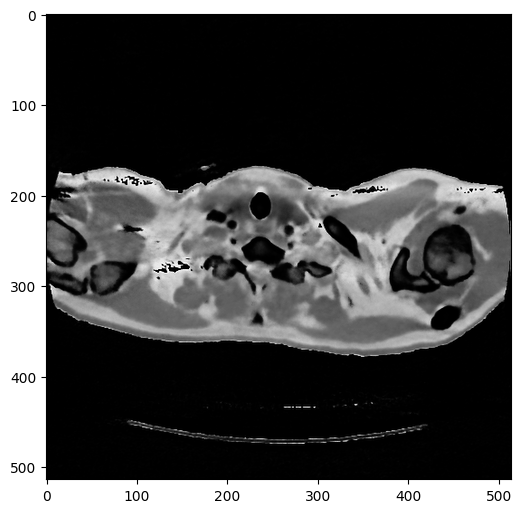

iteration:2900
Iteration 2900 PSNR_MASKED history: [30.93363068675908, 30.83262541342328, 31.093466775156877, 30.790427599916605, 31.00978918057588, 30.900614838812537, 30.919727257863844, 30.650946322437665, 30.823154918542997, 30.962164116598487, 30.900906033201238, 31.128880085421503, 30.57644077256159, 30.685338561962915, 30.60222379135861, 31.001089982396195, 30.69526335450992, 30.71190211190374, 31.033099429326178, 30.63789090517268, 31.07707869910871, 30.780186399729985, 30.722812729808805, 30.960166622171734, 31.02683300608519, 30.988384615301467, 31.030497581578643, 31.00531722342138, 31.02963688512478, 30.95016486728367, 31.04096624159439, 30.88887346852804, 30.886261016872083, 30.960734084204464, 31.181569357430668, 30.988025755373485, 31.027900401616762, 31.16526294234976, 30.856656519287743, 31.13843538974887, 31.014154267677753, 30.890475548453185, 31.138657982415808, 30.911258001606498, 31.18630322846165, 31.124069451022915, 30.90296450385924, 30.866127642031586, 31.0007

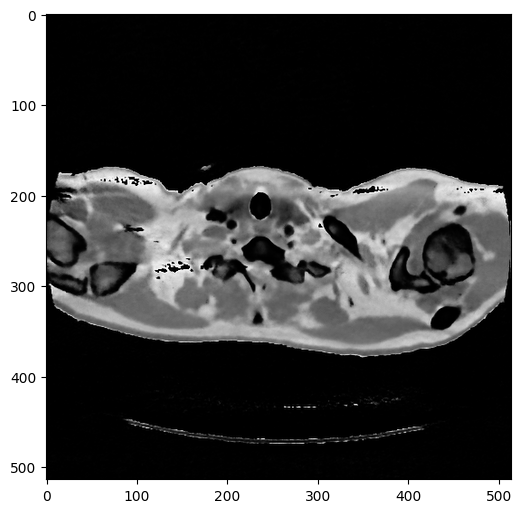

iteration:3000
Iteration 3000 PSNR_MASKED history: [31.162395077664712, 31.316823972148246, 31.07169674062963, 31.275690792663156, 31.19670598477052, 31.044818259734924, 31.071864282338414, 30.966068613015235, 30.821792822412345, 31.111777663913877, 30.671420838007375, 30.95833862387526, 31.153604413659586, 30.842879398396427, 31.037175397086937, 30.964946265532788, 31.033359557064983, 31.20147143734468, 31.17406301779846, 31.16764492693732, 31.122609043492545, 31.13951111306136, 31.231809215275717, 31.30178823738449, 31.243563927273293, 31.430800430288738, 31.206069682885303, 31.36059672690375, 31.19263323233124, 31.307315873882274, 31.294010075775578, 31.358522504496612, 31.140740582347412, 30.963144648443187, 31.198214268006677, 30.85487851095836, 31.128504541508235, 30.962278596354345, 31.0244678185991, 31.07089396815036, 31.129415864976, 31.187705523822643, 31.079310438646694, 31.210216247247537, 31.231985469636655, 31.174149456644006, 31.273330868039167, 31.320134595588407, 31.45

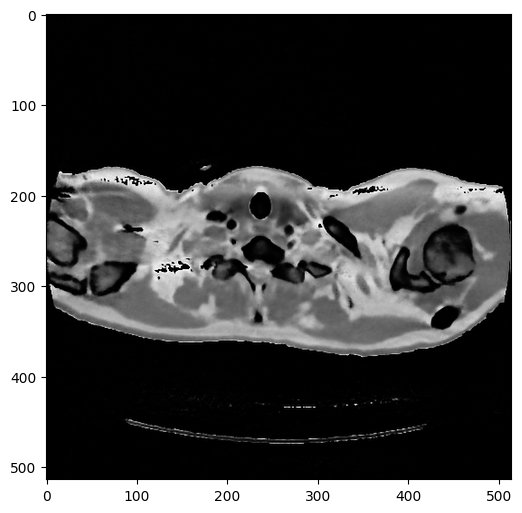

iteration:3100
Iteration 3100 PSNR_MASKED history: [31.177252088394063, 31.37643001223325, 31.30614860157793, 31.39196765108199, 31.02490419404503, 31.213295852022842, 31.349565315390162, 31.100234516689632, 31.54400048827856, 30.977695609690365, 31.283416552522773, 31.476915679917425, 30.992382344018203, 31.46803716521861, 31.33591249942612, 31.37315944978612, 31.58678956172567, 31.443437099038704, 31.429775754097076, 31.28080275670717, 31.611729819627257, 31.391776830776514, 31.36500924602271, 31.55694487897351, 31.298990741971387, 31.385315706379547, 31.320512008997746, 31.56964093515718, 31.583149215625017, 31.648629192164424, 31.18708367653456, 31.506223341010994, 31.438971216473796, 31.549798446697324, 31.500079815602664, 31.45224075873296, 31.75130891170864, 31.556624555432812, 31.679235617407073, 31.271958626489965, 31.41226607662788, 31.44351865273375, 31.198197428706536, 31.47142547536192, 31.337805793145247, 31.316337426733508, 31.445510538080306, 31.27231030393641, 31.58558

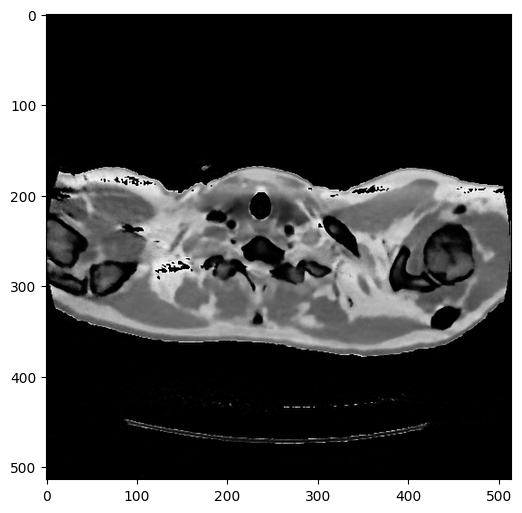

iteration:3200
Iteration 3200 PSNR_MASKED history: [31.73059377574024, 31.770464306740966, 31.76130191623337, 31.8814294071706, 31.675594798377624, 31.872449596140218, 31.93818577405271, 31.782273440054766, 31.99490644062862, 31.652948055317314, 31.80209934292328, 31.714071001106078, 31.813130204695568, 31.975500218257487, 31.810890326999743, 31.610241390247346, 31.66964536322682, 31.688872515902, 31.629139559970312, 31.28114082806478, 31.4336044117773, 31.159990283188414, 31.1492319403061, 31.32249997399189, 31.4846590757244, 31.674785881017534, 31.478566778039742, 31.368119600375728, 31.722477870271227, 31.73992780750241, 31.598828049957476, 31.63886020993266, 31.669611724200088, 31.799961774176136, 31.483797050100037, 31.534305548895457, 31.494057062892274, 31.463509415965984, 31.641528829339837, 31.48801090064889, 31.483628078148044, 31.67024625748144, 31.412057092261563, 31.649131079443187, 31.574741177659583, 31.665648297864045, 31.50752057279927, 31.517071719655178, 31.682690850

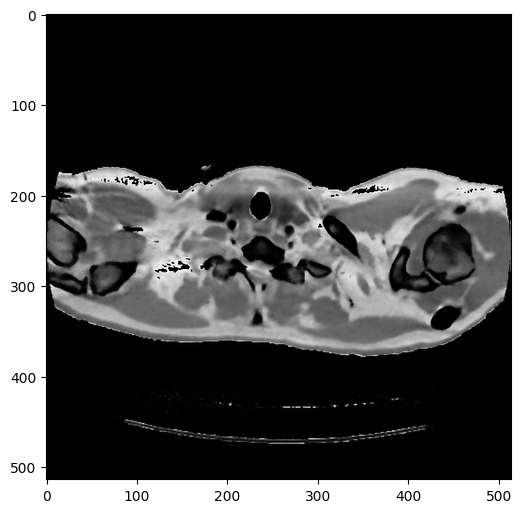

iteration:3300
Iteration 3300 PSNR_MASKED history: [31.86652904019163, 31.89096403633782, 31.879057695830575, 31.950280652972197, 31.7517024515811, 31.96913072539438, 31.88070618715762, 31.875393385194947, 31.900305326167803, 31.955825025542794, 32.06385650843606, 31.672074953182694, 31.885172162015078, 31.584539393157804, 31.580986176267803, 31.714787242064418, 31.9445460211784, 31.997005007215996, 31.77730955086401, 31.72862529602217, 31.68337538655722, 31.648912319094855, 31.56211564217152, 31.579720203654688, 31.49590895998894, 31.791693218471487, 31.24043516597389, 31.9567190893969, 31.739136276952777, 31.804797288894513, 31.867339877228353, 31.6967767997549, 31.92715840384519, 31.85146793139326, 31.614510530997663, 32.03021547353635, 31.878194873836673, 31.817378911938533, 32.147305572441915, 31.96223745938091, 31.950650032104953, 32.01221373072454, 31.999982237382802, 32.070944297504674, 31.833972001100264, 32.04633125585676, 31.952136362913983, 31.919707499602957, 32.0084557236

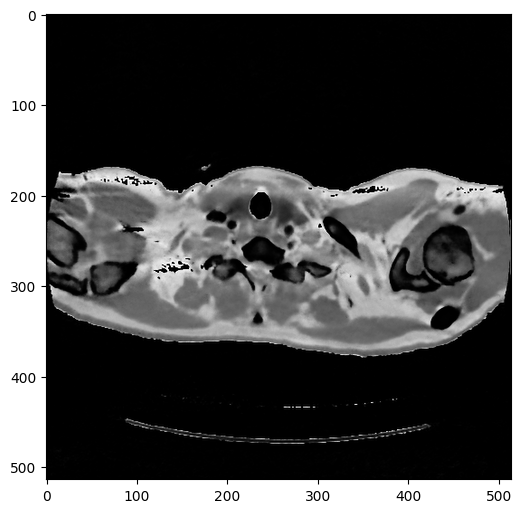

iteration:3400
Iteration 3400 PSNR_MASKED history: [31.911662097065488, 32.12882999891964, 31.678005174233444, 32.162661943820645, 32.148818165052255, 32.10892875114676, 32.24405480184017, 31.8988712675895, 31.93223324546303, 32.10071752846193, 32.06912924851063, 32.08687096208894, 32.164140084343906, 32.056173720217615, 32.08417859370866, 32.23967160215943, 32.04581796253652, 31.83486006896001, 32.33372702277519, 31.816273678472974, 31.947366835833044, 31.91970101947217, 31.759619185361036, 32.19530585184938, 31.914191444200032, 32.36755033741643, 31.908298178769442, 32.14915187697227, 31.9799404482349, 32.22487062854861, 31.707477354353834, 31.87831995608029, 31.96451953924622, 31.900600372419653, 32.04899852070773, 31.48219764628767, 32.198856380200645, 31.77224569568893, 31.801740021629406, 31.818733471903585, 31.680949649958798, 31.734820849567043, 31.88512158181107, 31.507135833562387, 31.877089265153646, 31.879123122129105, 31.78415667012022, 31.690593732651664, 31.7664230477550

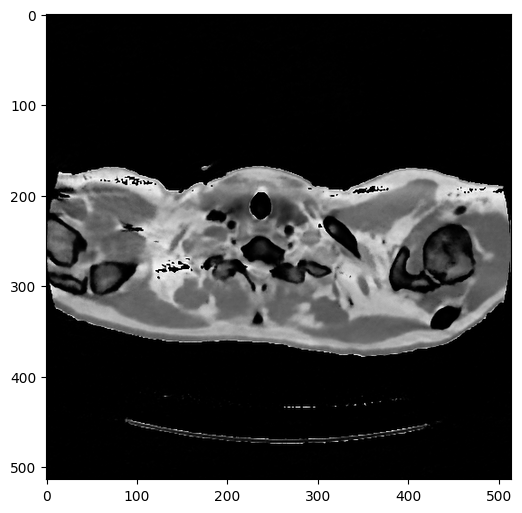

iteration:3500
Iteration 3500 PSNR_MASKED history: [32.45456651690142, 31.941169571719954, 32.14565940264171, 32.36858128452163, 32.3391260972075, 32.03616821503495, 32.39631901652057, 32.09200420431746, 32.41242014937987, 32.345225045048366, 32.543308961390196, 32.3165591090136, 32.397473808324044, 32.34684753217462, 32.5066454204572, 32.30070736075388, 32.34274071963172, 31.88871231696273, 32.54895717118921, 32.42514373265138, 32.298047649957255, 32.443526410462326, 32.509676574885674, 32.41677248598363, 32.45281367221161, 32.329733536190666, 32.497908521279555, 32.25484610888804, 32.31452403224206, 32.27173666733461, 32.3941931215678, 32.54881815556931, 32.49125332862201, 32.43760110829687, 32.45956028606338, 32.32594842201365, 32.46069934264537, 32.21146387519981, 32.19060928643345, 32.5351231535453, 32.459288887681026, 32.50037841054162, 32.30684700001564, 32.1745863775823, 32.43764986537549, 32.39597081661836, 32.671993641367585, 32.27412185472156, 32.51051872244083, 32.231620895

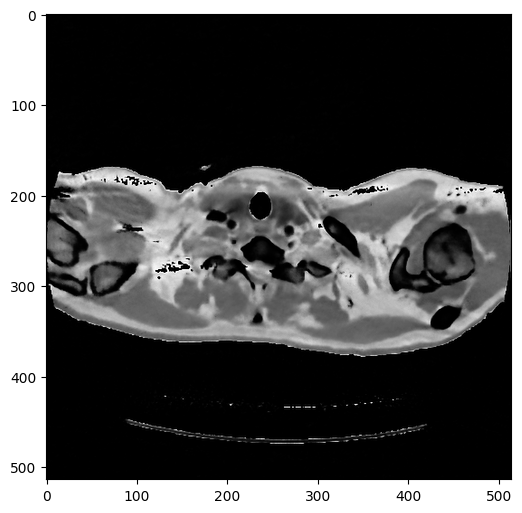

iteration:3600
Iteration 3600 PSNR_MASKED history: [32.59929677523301, 32.39557393790709, 32.649660551947676, 32.3997331022907, 32.51896928519286, 32.590233922173525, 32.60345251182394, 32.669434227290616, 32.72133363851245, 32.68680755542198, 32.63604457522954, 32.483503404509754, 32.49468330116536, 32.367307724643624, 32.49283413517864, 32.585485862614846, 32.583554194632825, 32.663761135858906, 32.84685512955737, 32.73068338787217, 32.66349725441122, 32.643663894642245, 32.68022869215519, 32.79150316489622, 33.07280831281885, 32.725563773439696, 32.842871436132015, 32.8292189185393, 32.74762987535466, 32.833580457003066, 33.06074222492374, 32.697261809211476, 32.77712997014578, 32.92814891138003, 32.73932335473467, 32.78121508529299, 32.75240068528326, 32.62499806710647, 32.532787828722164, 32.701264477161935, 32.64464448118821, 32.790003685919594, 32.78101382309436, 33.02052550572715, 32.6932398676704, 32.79469865386755, 32.706748660501724, 32.59358327321375, 32.62520601755249, 32.

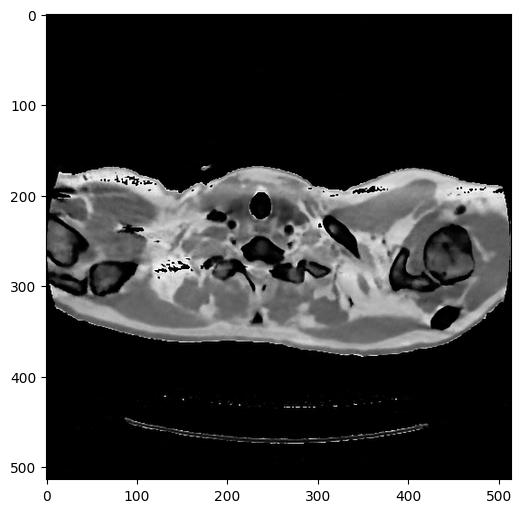

iteration:3700
Iteration 3700 PSNR_MASKED history: [32.4606889539358, 32.2377795430393, 32.438276191946635, 32.61339117202966, 32.646757055526685, 32.7742384897295, 32.77630437572914, 32.94251495458336, 32.52435213329787, 32.870842170908546, 32.81012254463738, 32.89325959237802, 32.714285387731906, 32.65309942087947, 32.79865672975998, 32.63345226490288, 32.53832738501403, 32.84259770087613, 32.53894842505646, 32.68178474672853, 32.73979686126512, 32.342176950645765, 32.671390752851835, 32.68523510726298, 32.822294403339164, 32.36502196305043, 32.49713165158298, 32.52270994020702, 32.56607481720183, 32.62588217798057, 32.53780294004984, 32.82346303561806, 32.58482827280448, 32.765904650939554, 32.48217949618588, 32.77225531699516, 32.55736176748057, 32.72325477758375, 32.972175934796375, 32.5497133452703, 32.76577144396826, 32.974503828100445, 32.57092109829174, 32.92089996993617, 32.88362660184064, 32.91812089910727, 32.77513423768279, 32.714006092053175, 32.74913158671423, 32.7686402

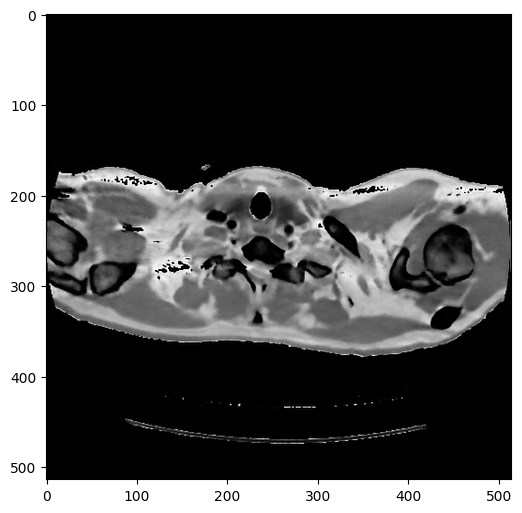

iteration:3800
Iteration 3800 PSNR_MASKED history: [32.68392808593374, 32.75090069907344, 32.81883006167003, 32.84992153351602, 32.78780485191631, 32.61887199280996, 32.98141147616806, 32.565305706638526, 32.873650931716405, 32.78778906225061, 32.871385084506095, 32.60053435405201, 32.824504368931535, 32.89213882941946, 32.95987406295021, 32.59898691124308, 32.95138748671795, 32.712343793045655, 32.747788980494555, 32.78741223560799, 32.70180798569455, 32.98295982252176, 32.90286931335599, 32.7890516750244, 33.13918508061148, 32.75151508254909, 33.01236607510533, 33.08951373975893, 33.000144251900394, 32.90794693354711, 32.84361194550679, 32.76460683563795, 32.738905181924586, 32.99858217116961, 32.75720930911848, 32.70954199680582, 33.062304134619175, 32.84992368872428, 32.78150135790459, 32.83914612461653, 32.92922620844651, 32.976975225648786, 32.71953446852091, 33.01815664447515, 32.77450605506392, 32.85614582680224, 32.934704322988296, 32.87921085638144, 32.72310045331197, 32.6152

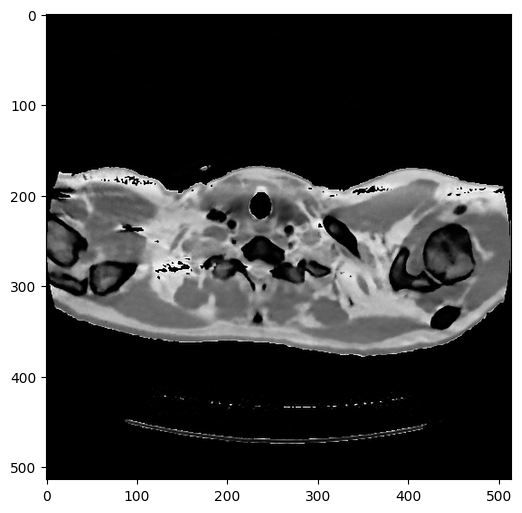

iteration:3900
Iteration 3900 PSNR_MASKED history: [33.03354139039807, 33.19972818905507, 33.17037093977148, 33.0580405899137, 33.10683587929382, 33.21312423966741, 33.06047674277502, 33.23055927809562, 33.22732369723169, 33.024199311239116, 33.03053487241116, 32.89949457215742, 32.9668445678896, 32.94548928092733, 32.852047031448, 33.276505179943, 32.91236674613997, 33.08330484799472, 33.14516451081501, 33.066076399765, 32.90110125571928, 33.05029398619937, 33.13727753438699, 32.90391325177997, 32.95143751672531, 33.057964253403206, 33.16872501262175, 33.037556156482275, 33.266786900553804, 32.963978701763764, 33.28104719344648, 32.80041514336982, 33.158001740300115, 33.168435244748665, 33.33795575866412, 33.07747542614386, 33.063408176824616, 33.219115710523816, 33.15248071580896, 33.16005681802624, 33.18948268153492, 33.460391022317665, 33.18149263464747, 33.30335444064084, 33.22159910241045, 33.26022084246323, 33.409288084812545, 33.39069999073222, 33.501648856607545, 33.3185076241

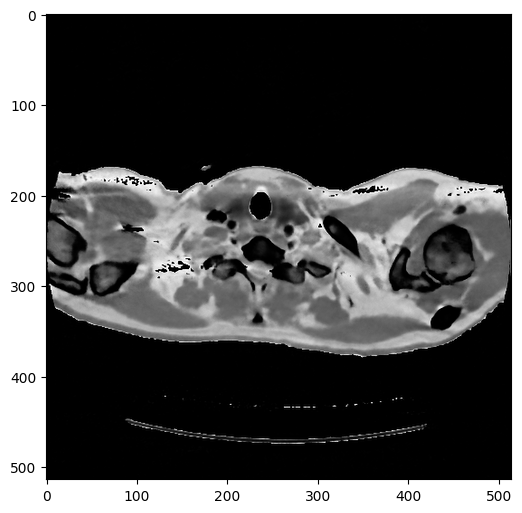

iteration:4000
Iteration 4000 PSNR_MASKED history: [33.37694275076358, 33.5320907490516, 33.543116733524705, 33.54307439123899, 33.407892626833714, 33.57970644463106, 33.29222628211373, 33.34015541024272, 33.52622389890394, 33.53373667708637, 33.24591825281447, 33.38849257784017, 33.488804313522934, 33.45110304784729, 33.41916179959014, 33.25995531841651, 33.46195265377959, 33.24183878180444, 33.234074775985, 33.38318902675142, 33.59241753508567, 33.59665597490424, 33.709889285959214, 33.56062544479556, 33.276130606203644, 33.55626016032887, 33.40138062830376, 33.45009105161276, 33.57905176551754, 33.69999009423497, 33.81878702340019, 33.720109392769906, 33.822394972697325, 33.6624569391403, 33.570006616340756, 33.57410416468904, 33.541329363874375, 33.42292794194708, 33.71449585121321, 33.5414338346003, 33.64642068448533, 33.78796086294904, 33.483418457063834, 33.67586661093232, 33.566295588775084, 33.65542971306186, 33.446339521028854, 33.39010431013221, 33.596105250111805, 33.302371

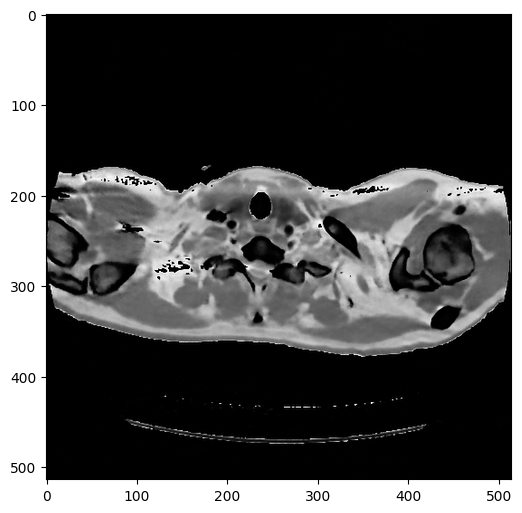

iteration:4100
Iteration 4100 PSNR_MASKED history: [33.47719503419769, 33.70584429083175, 33.47903290466766, 33.41453195689958, 33.47615448037321, 33.4308542604642, 33.540358400988865, 33.62621223649419, 33.51307715655543, 33.571241398663496, 33.73741988413442, 33.86793269101862, 33.70308119360878, 33.68444247378346, 33.85278838846412, 33.667241681004434, 33.75735126579038, 33.677454314320066, 33.577824856017834, 33.56007391320892, 33.31306993783916, 33.91634908820428, 33.53417936827889, 33.76958681216556, 33.57967119861264, 33.604587462190594, 33.61528758614632, 33.43971679492293, 33.47153744671391, 33.515393198612045, 33.235723292182314, 33.33206991327826, 33.81201373768423, 33.7091396145499, 33.683534100813944, 33.241962053374216, 33.84088269536444, 33.73459853657485, 33.44419554661607, 33.66320433173932, 33.67148997012394, 33.54978645903182, 33.702295689894655, 33.84078071077798, 33.59084319097901, 33.514595914943385, 33.34239932852312, 33.157318731929415, 33.066796833305055, 33.09

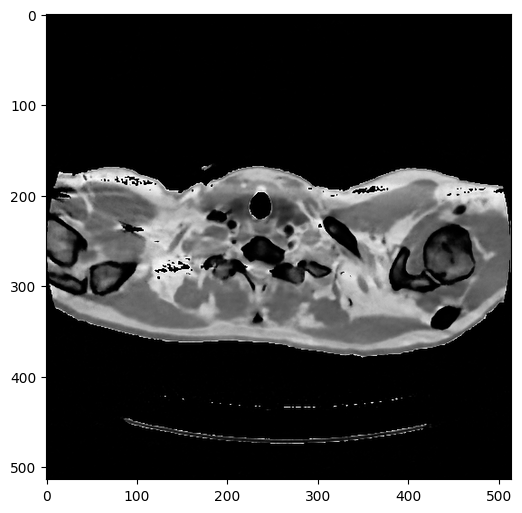

iteration:4200
Iteration 4200 PSNR_MASKED history: [33.95193980582611, 33.688734468558195, 33.60807158897667, 33.752329351884576, 33.6620678735147, 33.80481604501337, 33.85634056194291, 33.82153915019164, 33.868412494287654, 33.893101439498146, 33.636120319619145, 33.827911107831156, 33.969240390493724, 33.97131010713324, 34.07930535892095, 34.0473153944699, 34.033707653114256, 33.903122261601695, 33.869714405226, 33.95154112075076, 33.97836124952343, 34.02815490177523, 33.79925290804445, 33.92442160200894, 33.75239738896386, 34.01555339968858, 33.97670176275303, 33.91591721596615, 34.085950628592855, 33.95614881999838, 34.05482650029279, 33.89625929260595, 33.62419059181957, 33.96064450253545, 33.627141409328246, 34.09288437710802, 33.736684560106355, 33.889399891448214, 33.83408190289856, 33.64513152475751, 33.9100555541261, 33.80822701295483, 33.93632925405835, 33.95333871443255, 33.75527115881117, 33.94681373462448, 33.92977311402683, 33.722363512441056, 33.58419608614418, 33.83041

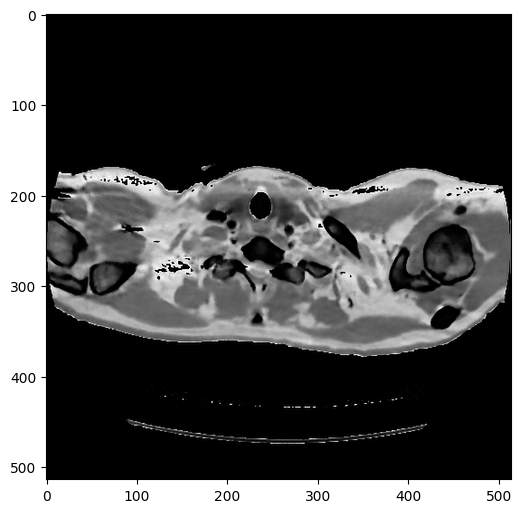

iteration:4300
Iteration 4300 PSNR_MASKED history: [34.24182568867972, 34.151449663454784, 34.192191013726415, 34.17166712669377, 34.04369379283261, 34.02847410844047, 33.994636084143195, 34.085412077171526, 33.8027335962432, 33.871185277570326, 33.95058185515399, 33.85927266703859, 34.16819955246295, 34.06667473749393, 34.20896949890622, 34.264220956644174, 34.361330180905966, 34.06662045348313, 34.18604700981277, 34.114412152714294, 34.087841049202005, 34.288849012216275, 33.893778488692575, 34.13242927042737, 34.13705047191806, 34.23429734575462, 33.829856519413546, 34.00062069092344, 33.71777025646503, 34.06594072685526, 33.572950822604525, 33.80511955136242, 33.39282451856633, 33.7864861589498, 33.39219638870359, 33.4993346845397, 33.49501801734476, 33.518297107751245, 34.07282634656473, 33.327429368794455, 33.389967036570255, 33.65732397244083, 33.543445590908775, 34.11086773104299, 33.05687667253635, 33.74135650892254, 33.07222865861323, 33.28182908943858, 33.698483199959796, 32

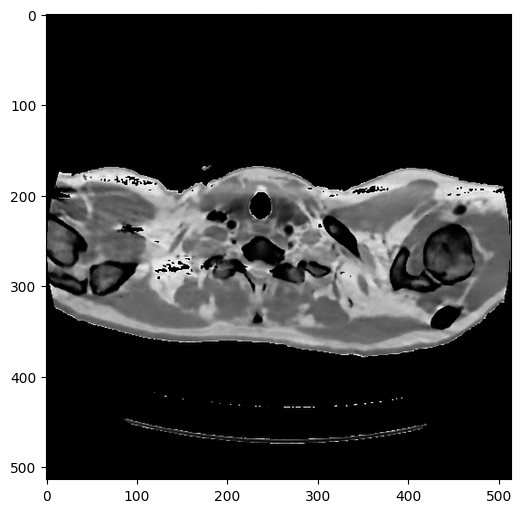

iteration:4400
Iteration 4400 PSNR_MASKED history: [34.39808025775797, 34.36758731653132, 34.148761571456305, 34.2383402098442, 34.37168614416913, 34.220017351235526, 34.292928119244706, 34.42510458781958, 34.27308670953173, 34.447914366057624, 34.206324982847065, 34.4403500120349, 34.324968276936566, 34.22058858525376, 34.352433131837174, 34.21559930425964, 34.13408926426743, 34.207864029785355, 34.08267527894503, 33.86969491294533, 34.32298446935397, 33.84575287628016, 34.14376772452022, 33.77324477693973, 34.34664333265874, 34.1176764288419, 34.20595217302579, 34.15404964456605, 34.00692919744837, 33.93884871107747, 33.93680376488198, 34.22999976309919, 34.19398145789077, 34.33949359226165, 34.08213612335857, 34.15094370286135, 34.045021156154796, 34.22730360004958, 34.414026589962496, 34.15460075478389, 34.26211840184675, 34.31096374232864, 34.2250961091114, 34.068961365481336, 34.25152281602114, 34.30687432667702, 34.291957547784094, 34.307792311837176, 34.442476118017815, 34.3101

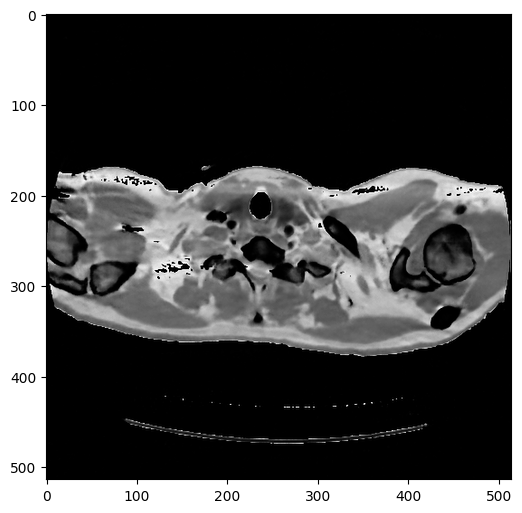

iteration:4500
Iteration 4500 PSNR_MASKED history: [34.47180006917329, 33.994768992866454, 34.46346198276677, 34.31551005694872, 34.36635184758847, 34.28026869375261, 34.4524354840256, 34.267116362982215, 34.42362931394541, 34.22126567812467, 34.17606862826649, 34.27416058939829, 34.0572424682205, 33.94939815611296, 34.06079349446105, 34.45298505181894, 34.13479919188975, 34.520706192136686, 34.464139059485326, 34.43573449582546, 34.16943713634703, 34.07253520549102, 34.365896675410056, 34.07920319997278, 33.78058008430523, 34.187575225357804, 33.630630724532026, 34.08481609539025, 34.07219277296677, 34.333849533344505, 34.06223311799824, 34.07871767199545, 34.32259677122948, 34.150492033265884, 34.59539983029394, 34.329465600395764, 34.66787537338964, 34.28645419623678, 34.563069212063844, 34.17898729816468, 34.246946433196655, 34.337615203567196, 34.361609300683696, 34.53168942926135, 34.38548773406029, 34.45651151723184, 34.52607544540277, 34.321438818933174, 34.566978983249385, 34.

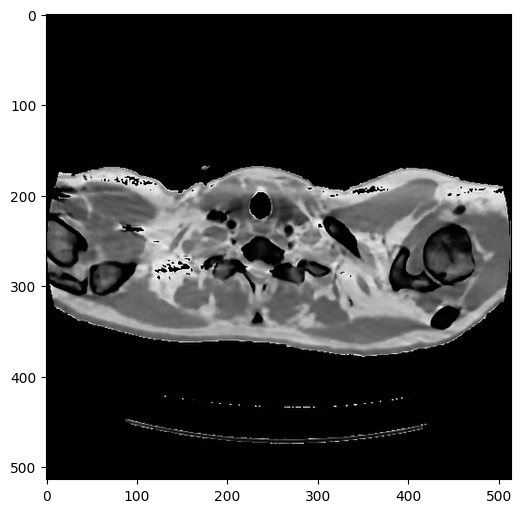

iteration:4600
Iteration 4600 PSNR_MASKED history: [34.28327978889264, 34.549385140546306, 34.64915850343286, 34.200077420506325, 34.071671070379026, 33.73254646904853, 34.38790595703415, 34.092803871761326, 34.35153897880124, 34.41893919979207, 34.469998797432396, 34.33501144663221, 34.73240471533612, 34.4756138389852, 34.69780369478769, 34.30963517729338, 34.64815348770296, 34.34184291506858, 34.32729494535497, 34.49526135043928, 34.63270985225441, 34.50173764768595, 34.125560301777526, 34.52840795712098, 34.03076186966705, 34.69147940935215, 34.129000112706876, 34.34944263898205, 34.230788615107215, 34.434886146843255, 34.323558267569034, 34.426334778305886, 34.40321768878546, 34.38549389540554, 34.216029840046204, 34.123866926093626, 34.044174904960414, 34.134913492404955, 33.98953064851661, 33.96234178910064, 33.58396502593357, 34.38768351046525, 33.634581577400596, 33.78701384203548, 34.46838060596411, 34.20690443404311, 34.25029481848565, 34.207172388404736, 34.16421609430982, 3

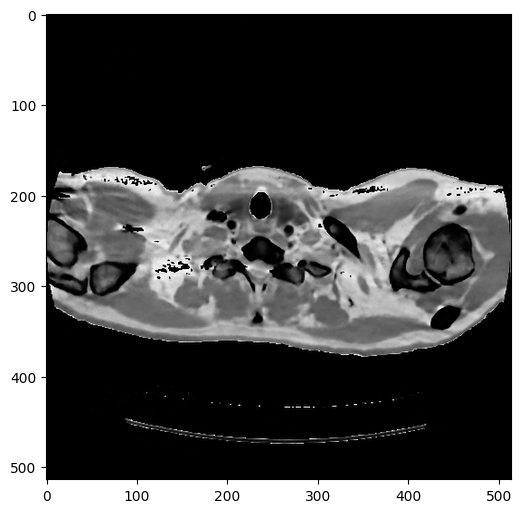

iteration:4700
Iteration 4700 PSNR_MASKED history: [34.454298775753415, 34.80715539918982, 34.398084316752836, 34.516708672761744, 34.611328024006575, 34.630967221291556, 34.60097011146139, 34.71698459844856, 34.67388145321006, 34.6373546295951, 34.650555963921036, 34.65061601747868, 34.65655548628101, 34.81241026618814, 34.566310582754014, 34.862009491444816, 34.68233397828068, 34.74334226675513, 34.405210861764395, 34.647081439123994, 34.63946204833875, 34.64125178151971, 34.51312954283508, 34.65899392272804, 34.51332592097835, 34.77348046826401, 34.37674104372743, 34.781265542397165, 34.62571208592512, 34.562025148221366, 34.71166208676401, 34.5846423722873, 34.30397419909986, 34.262712783634996, 34.40268884996008, 34.46627050173704, 34.44634349494596, 34.44278859661904, 34.457022263245975, 34.67984984957327, 34.58317855567626, 34.701837567009036, 34.38122236736881, 34.67289093101886, 34.65275885514262, 34.54544514782923, 34.670145690308935, 34.53497734762169, 34.689728574183285, 34

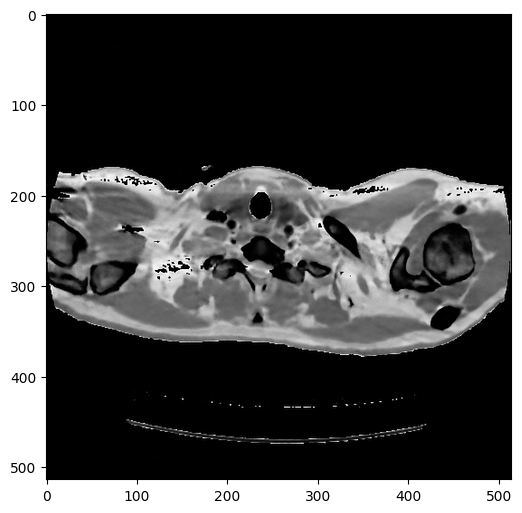

iteration:4800
Iteration 4800 PSNR_MASKED history: [34.77428357929216, 34.82235802867904, 35.154942804579164, 34.959952579619895, 35.05152799458532, 35.09732853023021, 35.084960229052335, 35.065280982661655, 34.97423506108102, 35.253603677859935, 34.97012588182288, 35.15160553119736, 35.14011877759617, 35.12739106145923, 35.022464338881726, 35.050635155663095, 34.766668439983555, 35.21657176065149, 34.787008042322725, 35.093830905481035, 35.00860250644395, 34.888469199712326, 34.82863294995141, 34.984814987149306, 34.927811888540546, 34.80882570061597, 34.84358913767976, 34.80797762336953, 34.903027683160566, 34.35574699304793, 34.59405197171225, 34.57084745822674, 34.41045153307282, 34.34015913688026, 34.5136372694855, 34.483097818654045, 34.86344547248942, 34.43647634137731, 34.90280953360642, 34.6948203787446, 34.710221138651505, 34.56969351101161, 34.61418085509281, 34.76103060847236, 34.68984702791518, 34.615799355460666, 34.823981914403184, 34.696378374022714, 34.689524109425264,

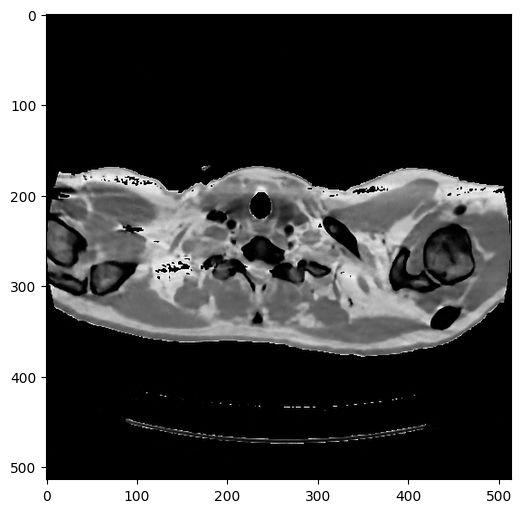

iteration:4900
Iteration 4900 PSNR_MASKED history: [35.17265573951836, 35.17224992695655, 34.94146619714145, 35.13032331424148, 34.658619976059065, 35.0452506339742, 34.707065942019916, 34.60851169304197, 34.85433379862839, 34.745386484194974, 35.011948430573696, 34.909061434953905, 34.97209527914114, 34.9299431220376, 34.92334060684909, 34.68045845962396, 34.975513139538265, 34.72509987762511, 34.890672765261876, 35.01459301565353, 34.885555438199546, 34.68295537965416, 35.02566204507352, 34.790036007702795, 34.92942432387604, 34.87726787306171, 35.081825927520114, 35.13862072094538, 34.79734374145953, 35.16911418893188, 34.79281800118884, 35.27641067574309, 34.74456362603478, 35.06650271771787, 34.67492588384532, 35.07797889780691, 35.137531217006476, 35.172042576276354, 34.879558977270584, 35.086444549220694, 35.262551378996676, 35.040028994736275, 35.201526669343714, 35.15646010825807, 34.69117173108791, 35.19535810079033, 34.76100318542216, 35.12856087980238, 35.04557479779542, 35

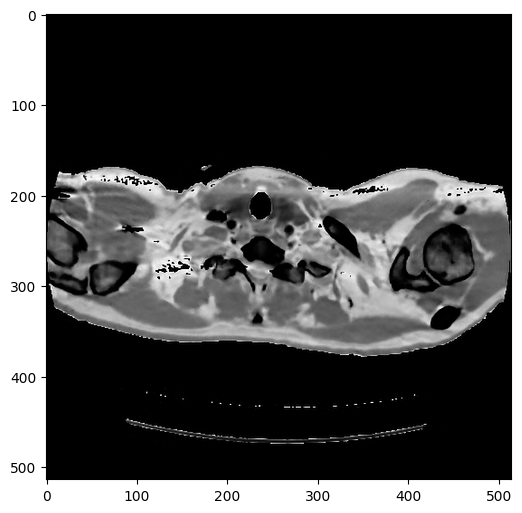

iteration:5000
Iteration 5000 PSNR_MASKED history: [35.24388393456321, 35.23467042556666, 35.34800534403701, 35.1352385980635, 35.24775123374268, 34.95324926004056, 34.863289845124136, 34.74181755644636, 35.13855541248056, 35.295947498701906, 35.329452743351354, 35.248268081742054, 35.438015787774496, 35.268225262219374, 35.25795423115405, 35.11809749527081, 35.42989799143701, 35.47949960286063, 35.41164180279833, 35.38493326020502, 35.326980989003815, 35.32762047655346, 35.36802677463136, 35.39317440026125, 35.56774533451539, 35.43066907345403, 35.38585714003952, 35.4801279457961, 35.47909633385407, 35.4352235070955, 35.54331292550211, 35.47019388153868, 35.189717481662115, 35.44850515943252, 35.53318213154334, 35.427149504341656, 35.60730671198971, 35.52136093549584, 35.44338923425803, 35.33293074399219, 35.23099784417723, 35.31045269838292, 35.31142620420304, 35.478675269136, 35.68371960010857, 35.580683785962776, 35.49490264357277, 35.38042473372845, 35.52643169258124, 35.578888088

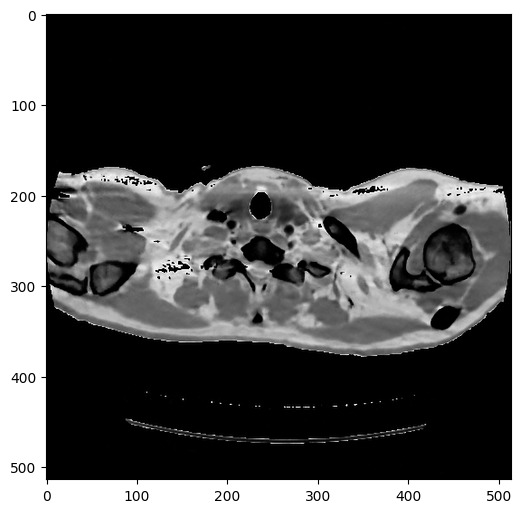

iteration:5100
Iteration 5100 PSNR_MASKED history: [35.13665054016784, 35.137477875281206, 35.072731359768134, 35.49176790959643, 35.20348813725368, 35.450569302475344, 35.25333079449586, 35.321515160080594, 35.4101230621011, 35.17879754315706, 35.50310197388636, 35.29632774694531, 35.39419044751575, 35.49870809382693, 35.39982496630512, 35.37711064735464, 35.35754827059783, 35.52423208377626, 35.42584135609424, 35.41045985165825, 35.35195209737184, 35.489359079020694, 35.29548838526753, 35.40711588867813, 35.34261911895416, 35.340624573525, 35.58185923589991, 35.35797557716122, 35.413939067477344, 35.53951610657493, 35.43769450335597, 35.67784034731942, 35.52725151383282, 35.62458794479981, 35.43692531385333, 35.51520698308795, 35.63775433117649, 35.41133632461475, 35.62511580883515, 35.458068745596634, 35.651690657584574, 35.50181094651238, 35.58383205667672, 35.60880117103011, 35.52532440257147, 35.40056970514811, 35.53998117767241, 35.565264994043346, 35.44407090029946, 35.46267107

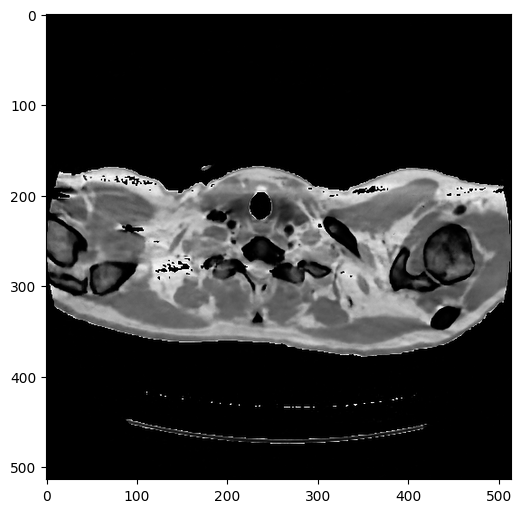

iteration:5200
Iteration 5200 PSNR_MASKED history: [35.74464530049926, 35.85995157144082, 35.89098202559375, 35.53130980480227, 35.75685853768438, 35.736644876838916, 35.83310642477832, 35.74477290118226, 35.8047433545883, 35.87088137616948, 35.85443035726416, 35.92713913513387, 35.72776774005055, 35.88552060435117, 35.70112713778085, 35.60528065558572, 35.02101604293206, 35.68581740494555, 35.708012839756556, 35.633865184626885, 35.511640032473025, 35.47191659364469, 35.60271004711982, 35.749651328721164, 35.50249442657628, 35.66300843178139, 35.46851100585583, 35.52830085737634, 35.63078391182541, 35.63151832708484, 35.607913517749054, 35.51482985942463, 35.82868496135344, 35.4580003065896, 35.31681683835171, 35.382758461196815, 35.11123044845489, 35.17098787647302, 35.326925920393734, 35.2978938925691, 35.26363345970543, 35.47148317994229, 35.087780658309924, 34.17192540188066, 35.336496725400835, 34.81698444339881, 34.55017900280994, 35.52186435911778, 34.89054975096541, 35.0625167

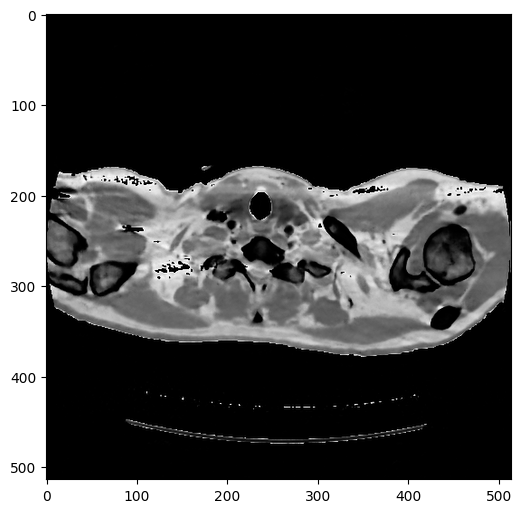

iteration:5300
Iteration 5300 PSNR_MASKED history: [35.677066053919695, 35.91279369783565, 35.72161243011581, 35.53068877665201, 35.81975133704933, 35.75661863254341, 36.08805612907792, 35.78522558052893, 35.91616545163622, 35.7696331791454, 35.77039950883975, 35.979653563988045, 35.80428432453755, 35.883119737097424, 35.8968399311468, 35.70384372146431, 35.68397891474201, 35.96994231990108, 35.82916131692418, 35.822284009843905, 35.840827384397905, 35.853351030102864, 35.6672717011774, 36.08485569268967, 35.588560321025426, 35.84378215411214, 35.88352399099887, 35.86705679076231, 35.934484431598406, 35.84348770771706, 35.700766497775064, 35.42121179078823, 35.753812884464054, 35.90198272330298, 35.82568264683136, 35.694446882772255, 35.705059008378576, 35.72347863035607, 35.71521272874496, 35.83457424641846, 35.927783439289115, 35.96446105466501, 35.8509722225302, 36.10289648022497, 35.88019620637303, 35.697570586327764, 35.62203423869737, 35.703169901038486, 35.903919020043936, 35.98

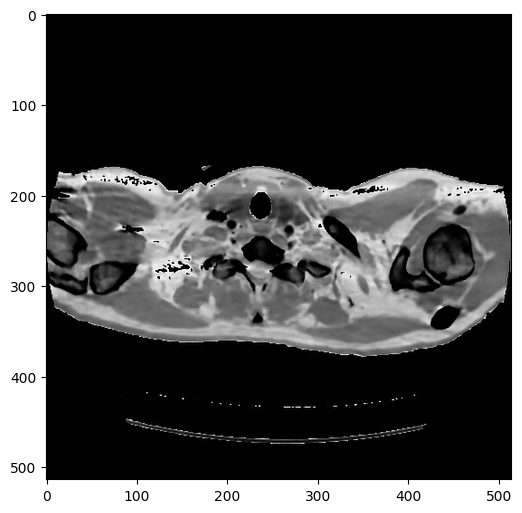

iteration:5400
Iteration 5400 PSNR_MASKED history: [35.78036660503323, 35.78249972748197, 35.977410311428685, 35.85993980827935, 35.88543770959858, 35.78162539418825, 35.97618722852169, 36.02171778352481, 36.111720365189456, 35.63975639796743, 36.074086934527976, 35.807953234094, 35.946814452071195, 35.9453897652986, 36.118345215224906, 36.001512994456405, 36.140926806009084, 35.84436285781528, 35.98789996010689, 35.88960402160643, 36.06523671524309, 36.08405048768972, 36.08357937270967, 36.16904524197913, 36.149023918079685, 36.05396366034063, 36.111861730379246, 35.96671367183736, 35.85397456561966, 36.227495574487676, 36.204401280804305, 36.11992118343294, 36.09869345568634, 36.12356716794882, 35.8358024955469, 36.1951239396331, 36.14462488573746, 35.79570017970834, 36.01222823348613, 36.06484277114083, 36.047382175981475, 36.071864032071936, 36.00119302999724, 36.020582364130306, 36.12996943145427, 36.00838792056894, 36.179694254780706, 35.919046779214426, 36.162847576287255, 36.03

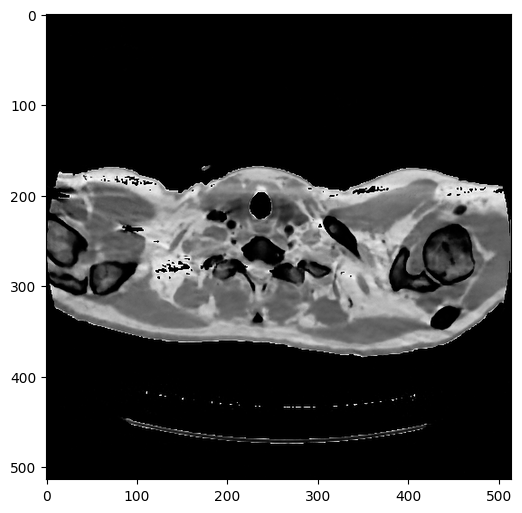

iteration:5500
Iteration 5500 PSNR_MASKED history: [36.00206712230933, 36.10241315879106, 35.882879397109775, 36.258796074471505, 36.07302108169381, 35.96875239836143, 36.2801238167191, 36.054364588351596, 36.21462080010386, 36.37477365304847, 36.3593817312029, 36.17949618692761, 36.22129580939238, 36.33211376941062, 36.433264422622635, 36.244543705161426, 36.45371732011305, 36.1429905345593, 36.22413350205283, 36.408415445501284, 36.26244208155774, 36.371858938316684, 36.14675447269134, 36.153818948547084, 36.178343708212225, 36.012411807801534, 36.14010585531676, 36.23429569191486, 36.14799343824409, 36.232428948044834, 36.255305258752145, 36.20033591660259, 36.33525205163818, 35.96514259426453, 35.85923138731254, 36.249608977274946, 35.86285216498705, 35.48552783344349, 36.13294369069333, 35.551044684079606, 35.48011345203847, 36.124136000683116, 35.74533409302653, 35.74933373258863, 36.179250274936365, 35.86402829713917, 35.98223608690982, 35.870363034993616, 35.947349064837326, 35

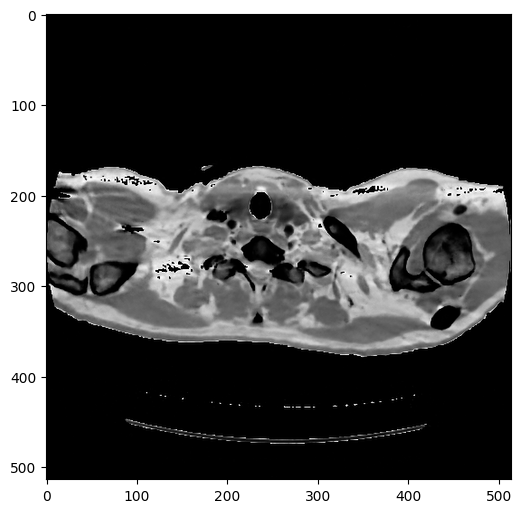

iteration:5600
Iteration 5600 PSNR_MASKED history: [35.976241462084886, 35.83608684126797, 36.26780693442258, 36.313842773866526, 36.345552663332874, 35.75618366879655, 35.730645709703495, 35.898301814705256, 35.784734067731506, 36.08382584837098, 35.94453743838243, 35.787878166544836, 35.67220051912877, 35.54612551925238, 35.12005317807944, 35.495750495306865, 35.87124506151746, 35.859662961895424, 35.61793073295823, 35.61817744240969, 35.89915415276001, 35.78999169680811, 36.080644835100316, 36.01160541518486, 35.67038999062682, 36.12038233819469, 36.11181055490426, 36.220930679219705, 36.09589854724479, 36.22496226745467, 36.33970292053481, 36.275212470294335, 35.81024075893633, 36.24222802407127, 36.03613598102108, 36.19288131324004, 36.11576361922489, 36.25780419499379, 36.05822130278301, 36.22306213075378, 36.0612912702816, 36.21646741011686, 36.095263445033964, 36.22613583942567, 35.90505775205691, 36.210662286369555, 36.257007995088316, 35.95026607859352, 36.31770432180949, 36.

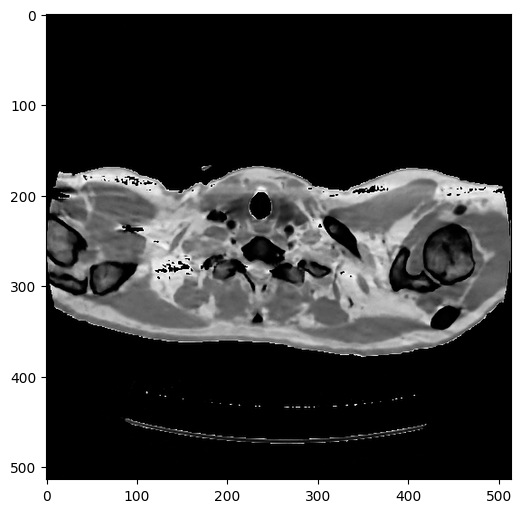

iteration:5700
Iteration 5700 PSNR_MASKED history: [36.12180290193633, 36.21889361827516, 36.113243848769855, 36.224070738458494, 36.41109217917785, 36.118484486951886, 36.29075030837816, 36.248422128168045, 36.30601740703551, 36.40222452204423, 36.313563739008345, 36.343255582026195, 36.365241440250465, 36.43968718111847, 36.28701618291745, 36.28619366557559, 36.26479739843966, 36.30501799445943, 36.28624908793882, 36.376220177803816, 36.36266089981333, 36.43764982238644, 36.561793388071465, 36.10062513119988, 36.33209148890729, 36.24500651709824, 36.245103173858254, 36.335320324629485, 36.491420379983154, 36.26543705127649, 36.393307069689904, 36.37163350672439, 36.44128656148244, 36.351269586630444, 36.13040922505869, 36.58293567027859, 36.19207538363191, 36.52923607205808, 36.38915780750359, 36.397851494553294, 36.52459807568312, 36.64115928987527, 36.529362078462064, 36.592025306963755, 36.5531123464124, 36.5880727397682, 36.57176038027921, 36.568921487860315, 36.48802063902727, 3

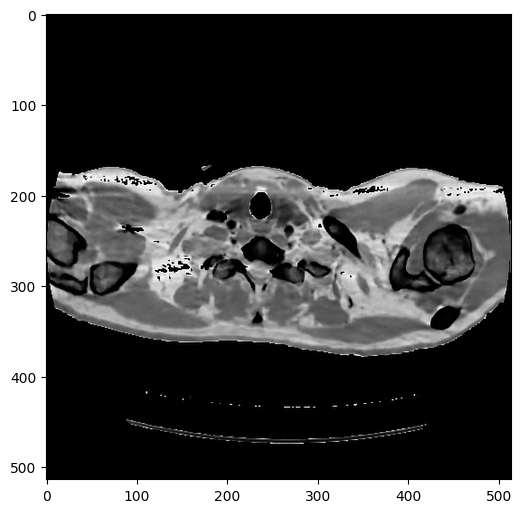

iteration:5800
Iteration 5800 PSNR_MASKED history: [36.29898867720015, 36.47642692065941, 36.44789860742431, 36.407352661292705, 36.529038576294816, 36.389558023875985, 36.3619291306883, 36.4568284827981, 36.46343311060776, 36.45660424283772, 36.565535498600326, 36.55298580146124, 36.49359821722349, 36.499317538713655, 36.528002046866405, 36.358528778286214, 36.36000655219921, 36.43681738662254, 36.58435583321054, 36.652923585299895, 36.382815496767805, 36.50857751670279, 36.656523679474084, 36.70749496217623, 36.69082133500663, 36.522774975651885, 36.85577186918373, 36.795676433513535, 36.77136342106631, 36.71957464510246, 36.74357860532963, 36.59057448920763, 36.584729527229875, 36.59255685164106, 36.643853599861295, 36.66701093635647, 36.44957922827855, 36.45378941937506, 36.388216349644125, 36.646277198503896, 36.522108529543985, 36.5666197461291, 36.501989114550824, 36.54859392234846, 36.25917414222437, 36.262991023383925, 36.080552088408886, 36.10006453987539, 36.293618058533866,

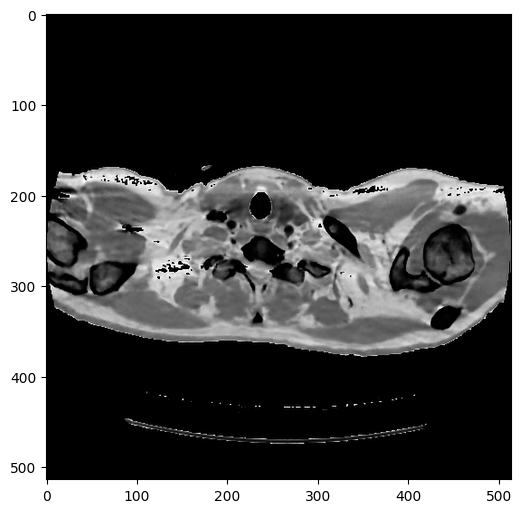

iteration:5900
Iteration 5900 PSNR_MASKED history: [36.297439833467024, 36.42422721831348, 36.14939555556938, 36.554954890457324, 36.50501482264089, 36.671825709770985, 36.46628080944245, 36.17639612731417, 36.25084143318383, 36.52795847124467, 36.16617757484087, 36.46485572599262, 35.91089581110868, 35.72921620285088, 36.02061339161236, 35.6829079387552, 35.94725078004664, 35.7030519222416, 35.52977105101565, 35.23333870347135, 34.97646819946277, 34.99753543141335, 34.8208231204871, 35.32363538974655, 35.203083395522484, 35.34639957254066, 35.65437647372571, 35.09856549694071, 35.70350167648211, 35.44459245556744, 35.93838493945702, 35.996660142682934, 35.42818817869987, 35.90600706744645, 35.9588215306507, 36.15091087265745, 36.043389360338196, 35.85406866745753, 35.99218807354691, 36.222507332634024, 36.276006576519, 36.23717970556078, 36.152706010635086, 36.44088036765339, 36.33747095565535, 36.309746218323724, 36.28515275090491, 36.54100535322887, 36.52302438219884, 36.61954423601

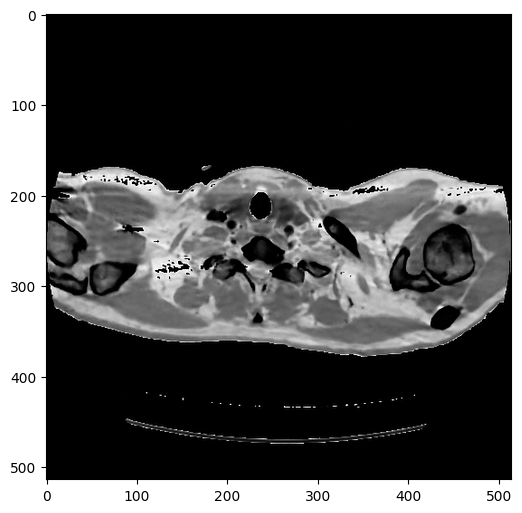

iteration:6000
Iteration 6000 PSNR_MASKED history: [36.57567094175044, 36.240092795727634, 36.27535747501043, 36.4560156496868, 36.45048053298244, 36.21199013102703, 36.207655455463275, 36.34294345173893, 36.21563165045284, 36.41062906105957, 36.40108954047631, 36.59994505164253, 36.613277566397734, 36.692007977245915, 36.78354591798266, 36.804858632875664, 36.719610503727644, 36.882540536280544, 36.747526142817804, 36.787546202536035, 36.749267553249986, 36.951428193883295, 36.86268462053389, 36.792309480867544, 36.90355597321637, 36.8065399061831, 37.016469004072945, 36.840709261997645, 37.07765400641194, 36.974449111472865, 36.778450069226494, 37.04458319245464, 37.00808475353711, 36.98349071111423, 36.965848226107866, 37.03045619856578, 36.8171409425505, 36.99243791488095, 36.87543154641088, 36.96604990080579, 36.68068363964493, 36.868893733750795, 36.62691994477671, 36.869099420209544, 36.73977746163907, 36.94021877182471, 36.90065893987469, 37.055002991483214, 37.12252179448618, 

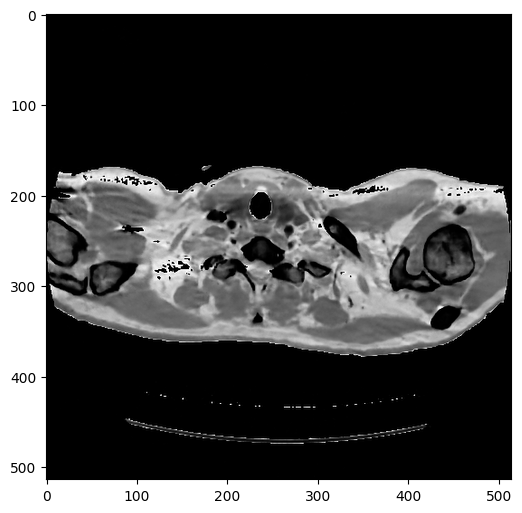

iteration:6100
Iteration 6100 PSNR_MASKED history: [37.247331009131116, 37.16525547786667, 37.06769033735158, 37.01290439456129, 37.292745851675065, 37.27599902663649, 37.10730676618533, 37.20168749200522, 37.07873941728435, 37.19448841666933, 37.11904922866415, 37.2623239580672, 37.15979669637334, 37.22831049212794, 37.30879066073763, 37.21505546767436, 37.21212079666029, 37.16895014449158, 37.15119564393334, 37.329197616729786, 37.27606211678494, 37.302205431349776, 37.25093735652804, 37.12626729249897, 37.180131055460045, 37.193478533612115, 37.117548838724495, 37.105131563124615, 37.275843698885815, 37.3066612045132, 37.212376491394885, 37.28057586891148, 37.25623378472293, 37.284901610545695, 37.25764758874897, 37.24923853477103, 37.40596293503942, 37.29232103906516, 37.35290891225489, 37.333335011223305, 37.38034124886106, 37.26366892207834, 37.26905394894651, 37.25183063725346, 37.18687420148497, 37.162701499994746, 37.05738939146442, 36.99056877704178, 36.866827260306806, 36.79

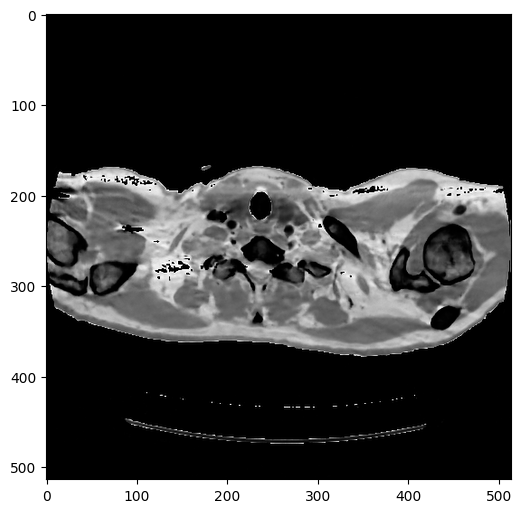

iteration:6200
Iteration 6200 PSNR_MASKED history: [37.11740566116633, 37.170177857818786, 37.08623438753819, 36.91468405897642, 36.57247299563863, 36.747951840731524, 36.63799134825515, 36.60220460205276, 36.721851424977324, 36.98690224525642, 36.777541386929045, 36.945984934264885, 36.794671169783925, 36.942208368366025, 37.12280096288462, 37.07846141105393, 37.132932213613, 37.253642265650484, 37.09593007022692, 37.152329134186616, 37.24539735678807, 37.11533686687297, 36.84923079914598, 36.938964077285505, 37.050549176127056, 37.059689090653755, 36.87165855637508, 37.12065223274471, 37.072646288703986, 36.93851315124811, 36.95342966020108, 37.11171592173234, 37.02306151349898, 36.80833678208543, 36.567362168261106, 36.790757311711346, 36.802577751644904, 36.639024383267625, 36.73483502082258, 36.97137554640573, 36.79348149455379, 36.759687968984515, 36.860063249413585, 36.671593345101776, 36.89415158682282, 37.02890455569786, 37.11989826766899, 37.02592644674045, 37.16008026198935,

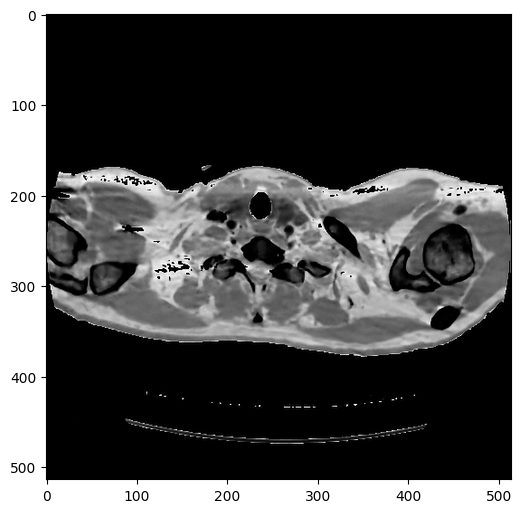

iteration:6300
Iteration 6300 PSNR_MASKED history: [37.21383814503528, 36.8870632483563, 37.180844480825485, 37.19976679892598, 37.125332854132616, 37.2327524052701, 37.05801792274684, 37.26056913504201, 37.091776076513064, 37.108850288542925, 37.045417979081314, 36.98792803242099, 37.032220231649895, 37.12657852272102, 37.040205041812285, 37.167938338788126, 37.077778595732276, 37.12860911198946, 37.17703926045469, 37.13743010298667, 37.20152566586967, 37.18584240678585, 37.1848171360302, 37.051954894915525, 37.15116083260064, 37.365674504302575, 36.75302438419044, 37.17430363931379, 37.224901415922865, 37.32276005302193, 37.330280390517395, 37.25839023559658, 37.130475333997566, 37.30428985674618, 37.23997284973789, 37.17266240031697, 36.88593193018304, 37.16044046727952, 37.213626846005376, 37.214954578957816, 37.35246007358205, 37.20811280550172, 37.57091040399609, 37.52565292692098, 37.33708955187216, 37.34939548195341, 37.327733214749365, 37.400526784638295, 37.4940499957285, 37.

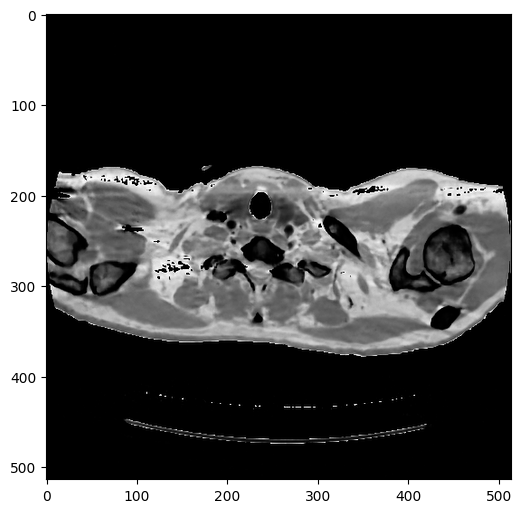

iteration:6400
Iteration 6400 PSNR_MASKED history: [37.583825067329684, 37.592365744916656, 37.57414293743822, 37.56336762834246, 37.63474373892973, 37.750636642342755, 37.5546862655881, 37.46681356462911, 37.495572749221566, 37.5150552942048, 37.58387554493463, 37.54635580573955, 37.5189994450156, 37.45898093903216, 37.67627038429984, 37.62874335037413, 37.61396289230155, 37.26145259152916, 37.28929811564447, 36.84914872694062, 36.609689604520256, 36.312555874915084, 36.405237123725264, 36.75056288840529, 37.256330368208886, 37.143525056316584, 37.20506506730319, 37.02797926299758, 37.111124661041316, 37.09249436454984, 37.10753347473433, 37.09527047254687, 37.30747479982281, 37.41457679424274, 37.10572531662395, 37.236128740619144, 37.259074048668566, 37.34508459602708, 37.17904557165719, 36.99455744401751, 37.31005504295084, 37.23936523109543, 37.28050715955889, 37.27784472762091, 37.46781530206991, 37.135920834252275, 37.4901634865481, 37.371774769787514, 37.399272850410476, 37.318

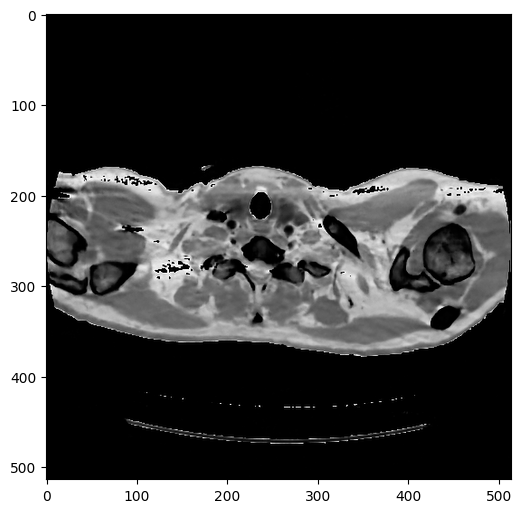

iteration:6500
Iteration 6500 PSNR_MASKED history: [37.430857209107614, 37.27228142534785, 37.280843570849086, 37.19641933410593, 37.31580077181138, 37.374934332898, 37.12657271568776, 36.95597831530195, 37.037486771411054, 37.136009134023176, 37.424870052841015, 37.38201623962468, 37.519327409682255, 37.23374124515492, 37.32076852391647, 37.36573738205982, 37.57313208126375, 37.42156842341973, 37.44154578885559, 37.357441064709086, 37.48576629074219, 37.643979949799856, 37.33420104312796, 37.405959669963565, 37.33127739589734, 37.27039436634354, 37.323108429475106, 37.26716362335961, 37.584294105818536, 37.323646716163154, 37.07787975467771, 37.4063228586446, 37.64956977583396, 37.56861971535413, 37.397439707871804, 37.484627652690186, 37.44745202967331, 37.50584610537188, 37.61166528496248, 37.42612667984007, 37.45649769750231, 37.53006662991059, 37.71525171585652, 37.588918009062155, 37.52323355108599, 37.46039742844333, 37.26156243239042, 37.17432131211594, 37.37321937001164, 37.40

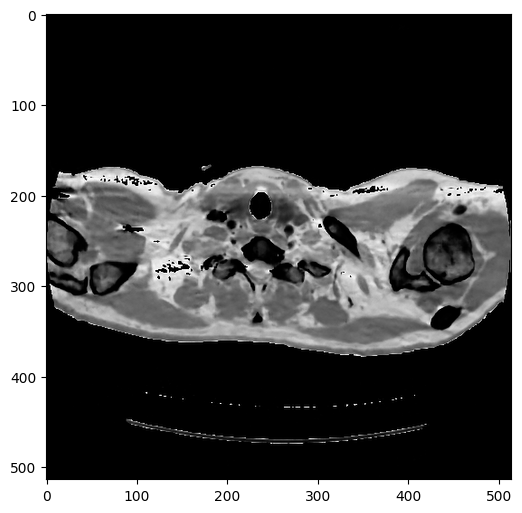

iteration:6600
Iteration 6600 PSNR_MASKED history: [36.41794213899802, 36.58313653137927, 36.47428459699167, 36.33683030398028, 36.659391208111444, 36.5754845322016, 36.64575876248752, 36.53787511662305, 36.77836629252913, 36.74708988272733, 36.77652579278442, 36.98939711960654, 36.86714212899611, 36.63139390428774, 36.64112340152223, 36.72003456729058, 37.0436267293044, 36.96446488308504, 36.782292037685764, 36.991115682706806, 36.82519582129953, 36.9863973071838, 36.870399719910644, 36.74529535949926, 36.995358752506505, 36.92059130639738, 36.83320456069502, 37.24362665219527, 36.90037520288821, 36.667342058001246, 36.85165592270978, 37.28659750164431, 36.97216630556514, 36.99088860446692, 36.548550558036055, 37.07275577336353, 36.960080756514145, 36.97672487041682, 37.00155166229667, 36.78935671850111, 37.187842418936455, 37.08774990289369, 36.89224153693851, 36.95429679191318, 36.62385120671469, 37.040976987505104, 36.9558002385119, 37.12694433070568, 37.17938722803939, 37.22394298

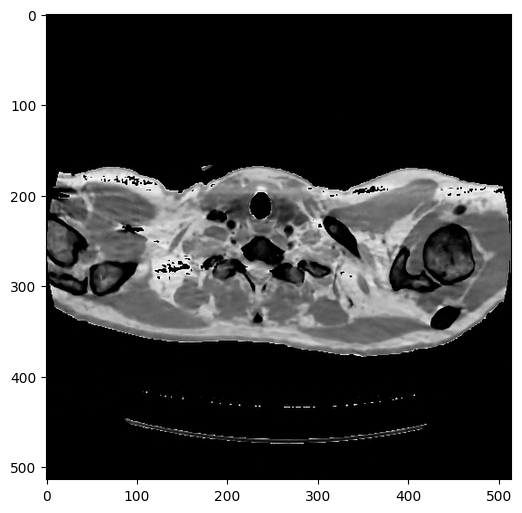

iteration:6700
Iteration 6700 PSNR_MASKED history: [37.679432399620254, 37.90535010060439, 37.946845210388425, 37.99774430592365, 38.08603652570468, 37.704969578006114, 37.87162014424767, 37.900772031695645, 37.92196037565902, 37.95335492531394, 38.12441960900631, 37.852048613678015, 38.06202955123231, 37.793957530376865, 37.983934238588134, 37.916291714392976, 37.73408590149594, 38.02721941795516, 37.99045586858538, 37.98766920254586, 37.994878243359466, 38.06607615062924, 38.03878963693332, 37.971096942421575, 37.960989285126765, 37.83639898975439, 37.93408465316837, 37.744359965779346, 37.74691337691728, 37.53026270180148, 37.24493164749517, 36.93022568678082, 36.72395318435298, 36.65954009925818, 37.131471777799405, 37.773338787083574, 38.1872950888643, 37.60314897118037, 37.57249417267281, 37.714493892133454, 38.030182095052965, 37.850823653510425, 37.712061424438645, 37.676436846334816, 37.97396879256026, 38.014836114053445, 37.912165725380206, 37.737631397339115, 38.048799096821

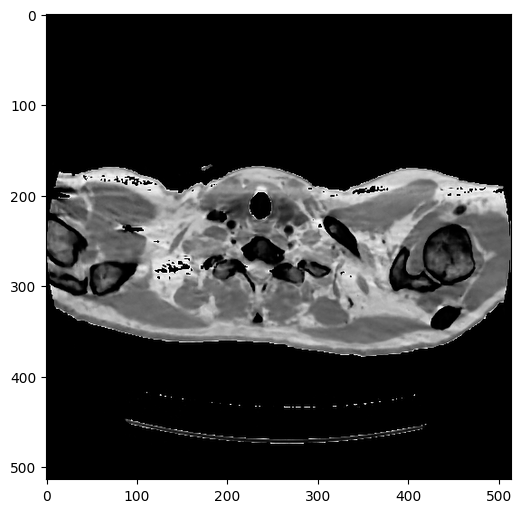

iteration:6800
Iteration 6800 PSNR_MASKED history: [37.73787977754353, 37.81675931385985, 37.71987459554288, 37.39917106776318, 37.43434556420531, 37.54819491742833, 37.94523273755224, 37.80617840087909, 37.76172458679524, 37.82885490656301, 37.960064099417544, 38.108175002662534, 38.19711030555196, 38.08539605295583, 37.90521794088739, 37.93986284502634, 37.982008569068626, 37.976773956982306, 38.10321170384617, 37.980269404000595, 37.77674419231929, 37.934913381295274, 37.7463103458502, 37.800188536217576, 37.73370696598063, 37.848175565599476, 38.017600798631015, 38.01615269506588, 37.903489913439465, 37.99612146137194, 37.9666986913971, 37.85473598828382, 37.69617253598203, 37.710730675125376, 37.90340676049931, 37.88907731146398, 37.81239638877478, 37.748165956333686, 37.93450121884159, 37.86202651446017, 37.88463623440377, 37.97620686593468, 37.830480609671206, 37.86008365185369, 37.75347846079726, 37.83608853602199, 37.92879962005214, 37.92860442896138, 38.02894571367835, 38.215

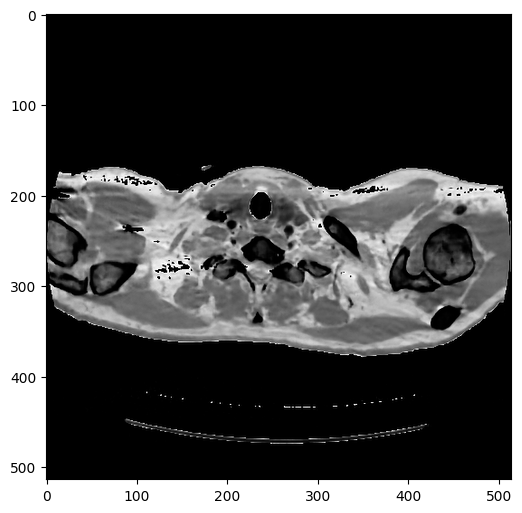

iteration:6900
Iteration 6900 PSNR_MASKED history: [38.02304592644025, 38.21996204839615, 37.96991933841611, 38.12712204990417, 38.09006940760461, 38.17325123087009, 38.24472067976948, 38.30452532550612, 38.25712743156267, 38.22533321872045, 38.360715327617115, 38.34632835983737, 38.46850742800222, 38.475408126576454, 38.37938327453797, 38.43763746348827, 38.39252394504835, 38.431747323919076, 38.379077289722346, 38.56439760901515, 38.55243679594555, 38.510424991587, 38.46620372866952, 38.363205680990966, 38.50213973120404, 38.35864338864147, 38.48712034906063, 38.41671820405502, 38.41913455090731, 38.30748021527283, 38.196245616616366, 38.24054382675278, 38.28671539871045, 38.37527554884587, 38.4276443077571, 38.57330177610386, 38.43748030530361, 38.45896303189572, 38.442280602360285, 38.429190384574575, 38.45542117687213, 38.47495198898089, 38.30109935960239, 38.311790433702285, 38.02384057734213, 37.74386151120516, 37.42424897570543, 37.45698932845093, 37.40065958960343, 37.70561795

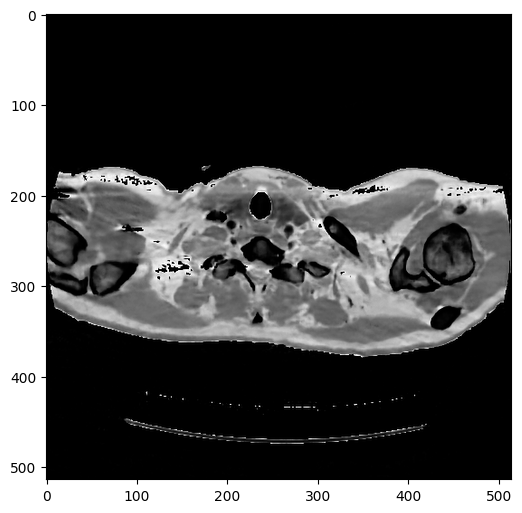

iteration:7000
Iteration 7000 PSNR_MASKED history: [38.375508827051085, 38.42789594539699, 38.329600194870046, 38.463919238874716, 38.27177233653386, 38.20678252196017, 38.116531962293244, 38.34238399446549, 38.370972453025125, 38.45596271088183, 38.356937627478516, 38.308412783358115, 38.45607856029464, 38.46841240001354, 38.44121672176325, 38.455430489758285, 38.312223226489465, 38.427757156065155, 38.60492464945566, 38.381955082364115, 38.38287002724691, 38.17949330886184, 38.501246215802, 38.50443502835511, 38.66081946802537, 38.470747924686314, 38.284433380771745, 38.437176572243, 38.5623969196654, 38.58590688437224, 38.43431971354011, 38.23592813001756, 38.49558948892523, 38.43263060942317, 38.4582632685583, 38.21231570842033, 38.557498198182614, 38.29025332654473, 38.444250360460956, 38.45131016045102, 38.414572019624195, 38.468675406449655, 38.57334800898069, 38.32258080970162, 38.45776794218477, 38.277500623481515, 38.16261193607033, 38.46648382283482, 38.26424017608612, 38.35

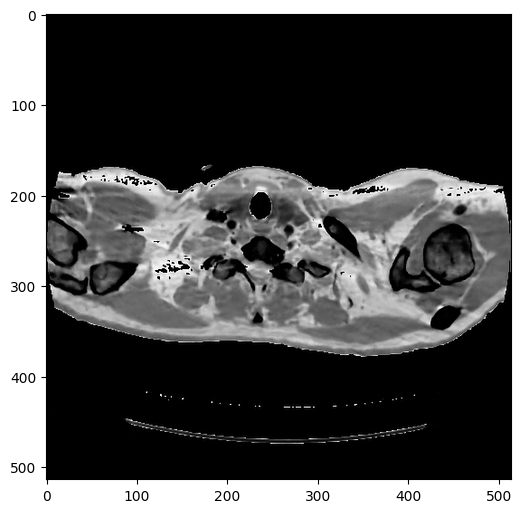

iteration:7100
Iteration 7100 PSNR_MASKED history: [35.14472631667827, 35.05693806586089, 35.4121009002646, 35.402047051524065, 35.376699269127336, 35.920942755246315, 35.58646730204895, 35.80757760653823, 35.63362648306453, 36.03542309479727, 35.71750496616528, 36.09359852866004, 36.12841564723285, 36.52567980261986, 36.388174628032445, 36.29802443500743, 36.24220260948461, 36.514555400161356, 36.361177304149805, 36.61154681059597, 36.87310916859245, 36.636673142220076, 36.72187268365753, 36.29527061162625, 36.8850134420458, 36.86184173336653, 36.639083223280416, 37.06097143071943, 36.64617096656332, 36.94820121319086, 36.91460331750878, 36.768156258395635, 37.02987010301942, 36.810999657077915, 36.95190722681361, 36.98857347164627, 36.952209717407285, 37.08387850988336, 37.06115559266851, 36.912369085657176, 37.338573172748106, 36.98121058897324, 36.8044708096366, 36.91388742116174, 36.6574384980149, 36.989530977062316, 36.74544292473688, 36.98955076672239, 36.64328014147672, 36.8907

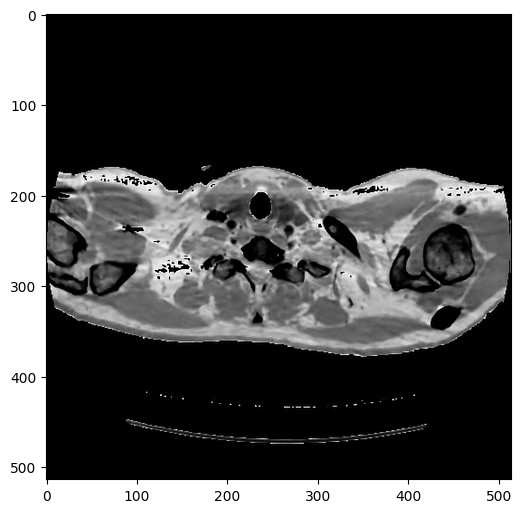

iteration:7200
Iteration 7200 PSNR_MASKED history: [37.976337278205264, 37.90852545434752, 38.161344826576176, 38.02300547137697, 38.08184648910521, 38.15091083106273, 38.068126443363724, 38.23772771256466, 38.20231971042063, 38.16779191212937, 38.17399696408562, 38.1327009777822, 38.08148463334602, 38.191204902325765, 38.124323327619464, 38.12922879441998, 38.284535741425074, 38.18724345730822, 38.083143536050116, 38.15993311220434, 38.26279236028348, 38.19787584576368, 37.91909731792886, 38.233694677902726, 38.09593092033847, 38.10576898289334, 38.2976328034424, 38.09368532581494, 38.363673748984525, 38.216470813046776, 38.087060351805434, 38.0063207144426, 38.02838147575175, 38.076301618333304, 38.268588678155744, 38.45694275534268, 38.42452245010581, 38.357740492170514, 38.3887159859358, 38.3243803950186, 38.29701733413641, 38.510600236845924, 38.57732268587502, 38.25678634537514, 38.51811755559725, 38.581299057966866, 38.555316224053286, 38.499551949208254, 38.52051359001555, 38.4

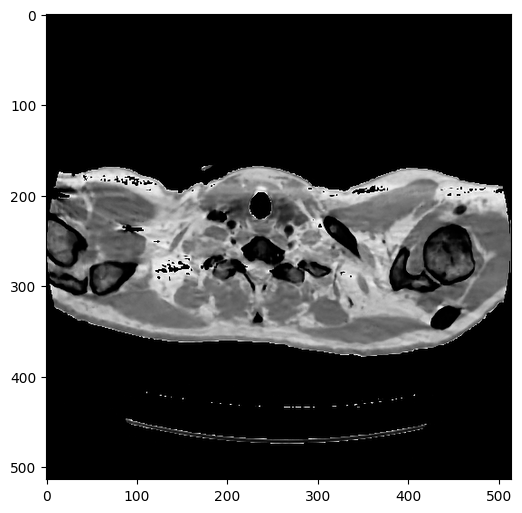

iteration:7300
Iteration 7300 PSNR_MASKED history: [38.17670943011432, 38.30882938531005, 38.33224638614255, 38.35377373926833, 38.689210407625936, 38.513821040169226, 38.545155448587536, 38.298977078190816, 38.494101885118965, 38.54335682579409, 38.511543559911686, 38.44025325474576, 38.26209996619422, 38.33033582001481, 38.62603430244205, 38.54274553816082, 38.38285135843738, 38.454161558928504, 38.54955459911386, 38.70535252729764, 38.47014823355326, 38.41846874060991, 38.44519684390152, 38.50050996527915, 38.54099988277263, 38.58744658574309, 38.59780228859863, 38.661965974464295, 38.67569704691113, 38.71801416966156, 38.82061376749573, 38.62385393724494, 38.83958591995379, 38.51210310925805, 38.69622164709793, 38.59119714341597, 38.63391283612597, 38.73169005644665, 38.62854497360749, 38.52719731600906, 38.55373039603025, 38.385025612899625, 38.546161050508005, 38.41021517331911, 38.42236906591235, 38.38576017576294, 38.278162774513106, 38.25552688358273, 38.20990272173421, 38.370

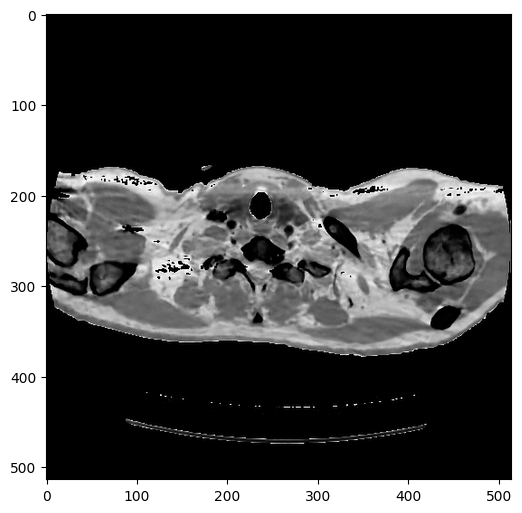

iteration:7400
Iteration 7400 PSNR_MASKED history: [37.4236280795164, 37.68809409548495, 38.529230110223615, 38.6619990762484, 38.341908576278634, 38.47464615025183, 38.65554255705873, 38.71114501286813, 38.83037206543455, 38.657760879065854, 38.707008740301006, 38.7627113669585, 38.79181126523465, 38.97734095988975, 38.759422044557176, 38.835950641086406, 38.99877530686421, 39.06325459061117, 38.98079992303506, 38.9191109885384, 38.84647172628749, 39.051071099071, 39.056263705245854, 39.179537004666045, 39.06568557085966, 39.05929828747636, 39.146428738921834, 39.03553387936136, 39.07255902202671, 38.98032226126062, 39.08150267725454, 39.10279002820787, 39.048259865450696, 38.93395404440935, 38.9357298128126, 39.04313851329844, 39.04787748701498, 38.94485077410293, 39.06052328810474, 39.14771529461706, 39.08701127540427, 39.06452290377259, 39.03033131452383, 38.73818816168324, 39.039141471488186, 38.91340244095246, 39.04128405402161, 38.97932209467556, 38.86790053525231, 38.8331010985

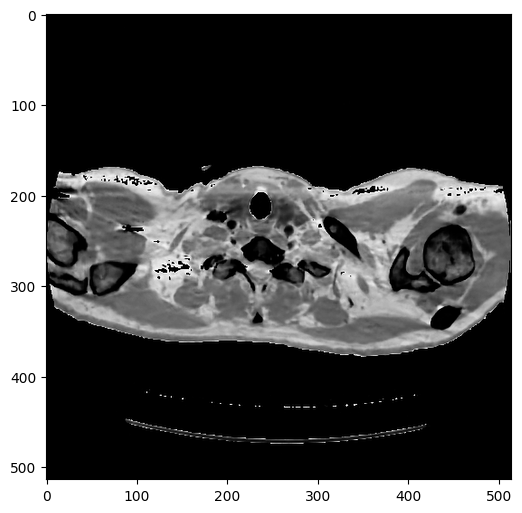

iteration:7500
Iteration 7500 PSNR_MASKED history: [38.88366147147333, 38.97577921504224, 38.737749305259086, 38.99071462485415, 38.93843437101437, 39.18845059949412, 38.96849095100039, 38.804507523477625, 38.91804733048964, 38.89989857851639, 39.048882607124085, 39.026315518460784, 39.07697019441468, 39.01430814879176, 39.10259550499488, 39.098615755534475, 39.026759567963474, 39.06820045964929, 39.23109066210297, 39.236475134519154, 39.20080266800292, 39.29678349898569, 39.06481461375469, 39.19645125849732, 39.058138937059674, 39.31517637405976, 39.18784460339571, 39.31926720680235, 39.28351929902594, 39.21890322488211, 39.11077485999087, 39.122257656061905, 38.90038480342326, 38.65773921251881, 38.63156761966745, 38.592491593462874, 38.611291864543546, 38.93898304161421, 39.090637031025395, 39.19773523564271, 39.19099481025114, 39.13235127945837, 38.937632123331795, 39.00247951703174, 39.101576780225706, 39.181171391868034, 39.18713012410757, 39.3073103528233, 39.27677356819852, 39.

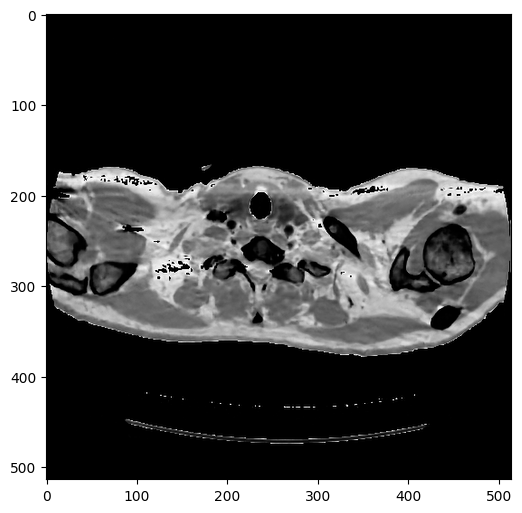

iteration:7600
Iteration 7600 PSNR_MASKED history: [37.43276347489429, 37.66476175514115, 37.76857404316936, 37.15780860394095, 37.0937651006767, 37.892574848453, 37.38741947865277, 37.57662846002935, 37.10944797074772, 37.15518483165049, 37.22092125767646, 37.30942299276124, 37.349695575041615, 36.82856558395779, 37.18424506989009, 37.47263323817305, 37.25031572460493, 37.694036473471286, 37.416340718823974, 37.54946061917413, 37.95159556125127, 37.8935809916988, 37.98579448802622, 37.97387763200659, 37.965710059817525, 38.24089938157909, 38.03222299527345, 38.1585263373787, 38.058646677979155, 38.02298514636088, 38.098453343041186, 38.017952658725356, 38.336727591218235, 38.12416978058539, 38.314068304348204, 38.2164569669422, 38.16844344783866, 38.2710145087196, 38.18808154237124, 38.21825846932207, 38.33279157605217, 38.18903827339219, 38.38637802183022, 37.96154543706095, 38.08600497465866, 37.466362825484424, 37.99104242857774, 37.792155663311675, 37.89359174877659, 37.6649054547

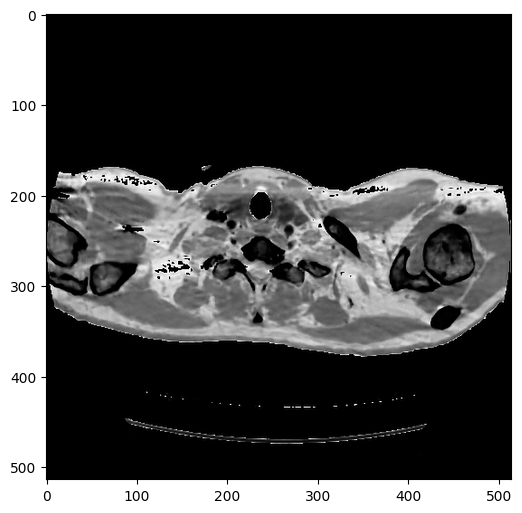

iteration:7700
Iteration 7700 PSNR_MASKED history: [38.54086575317474, 38.82764092428782, 38.616664314887934, 38.75920878562562, 38.92714487611264, 38.75735684459257, 38.70913627411767, 38.814721166448074, 38.87093262868045, 39.03978422592316, 38.99713465583177, 38.93471801039773, 38.94529800149521, 38.914819686213875, 38.94945964101426, 38.968831691515845, 38.92878961049618, 39.01785544893628, 39.08473744785529, 38.89145779414701, 39.026364265685686, 39.131834934904745, 39.07019035988226, 39.173436189843095, 39.254799769300284, 38.94555090366255, 38.90820107843161, 39.04958609156233, 38.94125155757236, 38.94071613069101, 38.87350133881598, 38.45491817478946, 38.30370640403356, 38.30753412906245, 38.520650647255074, 38.611849426446256, 38.82547278463854, 38.706299147571436, 38.84310205920159, 39.200186873599485, 39.43918906323957, 39.1106667628484, 39.04327030368112, 39.121576365339756, 39.21778354859333, 39.2635834954302, 39.370872886704234, 39.29188915661669, 39.40536103665352, 39.45

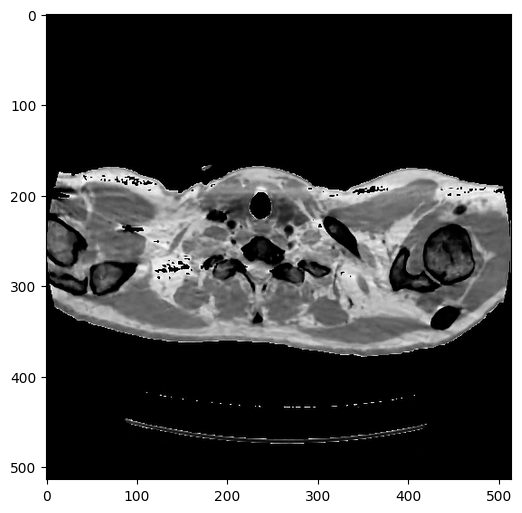

iteration:7800
Iteration 7800 PSNR_MASKED history: [39.247630242299245, 39.131735615959, 39.048697731731096, 39.00180520942686, 39.051346812624544, 39.1885677093234, 39.127582816187115, 39.25615365613499, 39.25343594752084, 39.4311673283225, 39.28902973080873, 39.36244263763508, 39.51200090799607, 39.429957630483095, 39.19384703371573, 39.16809230720197, 39.112936959373705, 39.31118669678365, 39.481076309444866, 39.24872400758793, 39.200390330442055, 39.044050510507745, 39.18414154438152, 38.94240039723212, 38.928567485049, 38.80729285074777, 38.857177408359796, 38.79552690454319, 39.06489003635262, 38.90366566509421, 39.06530951864462, 39.08285310397033, 39.12606144769514, 38.904451677724964, 39.07947217508868, 39.1827961840543, 39.01890548948899, 38.99480091445165, 39.25410366196036, 38.951053753525514, 39.14664218397585, 39.24401356455576, 39.11312422166476, 39.12345423012617, 39.12792517200833, 39.1260080595609, 39.16949383742402, 39.10445423186119, 39.338224997732524, 39.279459729

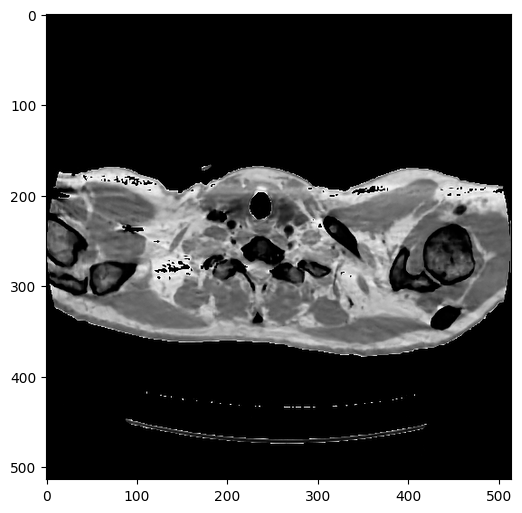

iteration:7900
Iteration 7900 PSNR_MASKED history: [39.839530635143795, 39.60896779070536, 39.83581579075459, 39.93492090089066, 39.92135296432117, 39.89684813179522, 39.83726765565636, 39.787820917918914, 39.73131610535789, 39.6293421674227, 39.336260518624876, 39.06223719580527, 38.72185979912036, 38.6714848237522, 38.65433133056142, 38.870666642851795, 39.10176109987922, 39.336331040463016, 39.64829303383577, 39.17862411290636, 39.046481961560424, 39.226795783051095, 39.38872760539341, 39.40519554049992, 39.45703179058345, 39.53869671036721, 39.74126776824472, 39.66761896979158, 39.6511846897034, 39.51970494495214, 39.47004683223882, 39.42138774786028, 39.49874120749121, 39.83531651245232, 39.76336415494057, 39.858762299572334, 39.64850624969125, 39.45217755396995, 39.56921804935934, 39.6730566686157, 39.66203742059327, 39.44290457644876, 39.57386037232456, 39.519366289474945, 39.788819210807745, 39.73145577879025, 39.71229521854553, 39.61583265609928, 39.3716066574822, 39.262403630

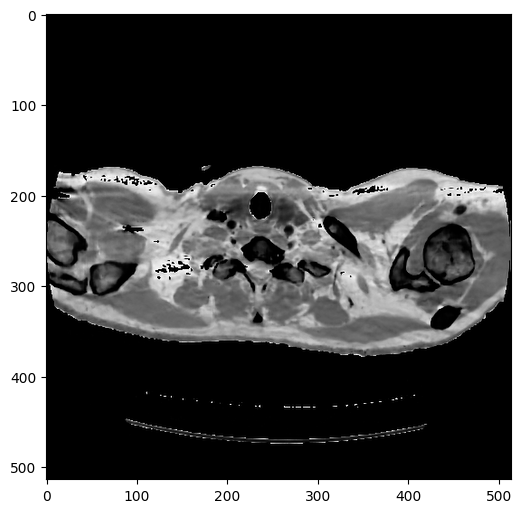

iteration:8000
Iteration 8000 PSNR_MASKED history: [39.90553333743199, 39.78164182857176, 39.67651117136227, 39.694905645312176, 39.813970517797244, 39.5515738728973, 39.55241437903322, 39.259176943396255, 39.25772739333434, 39.30227508675764, 39.72976691597947, 39.98120967333935, 39.97561185797315, 39.865246370468995, 39.83138317368266, 39.81102380214794, 39.877187640190044, 39.81923495056162, 39.90929050766449, 39.77867570675029, 39.67481185205293, 39.812951654916134, 39.68368925883662, 39.86441078743435, 39.72665620950568, 39.59653262265758, 39.79399330881204, 39.618940066508365, 39.46370047913482, 39.456943709438576, 39.56698079157948, 39.58833402878963, 39.65181552912085, 39.63388295137956, 39.69070508791801, 39.7777570636182, 39.68569588509268, 39.81047168154843, 39.68786762781404, 39.22868026376227, 39.12947709968282, 38.91548489205157, 38.277004187472514, 38.348707887558724, 38.283020442042165, 38.79663645583038, 39.12213222241923, 39.1715342231228, 39.13186356167978, 39.285951

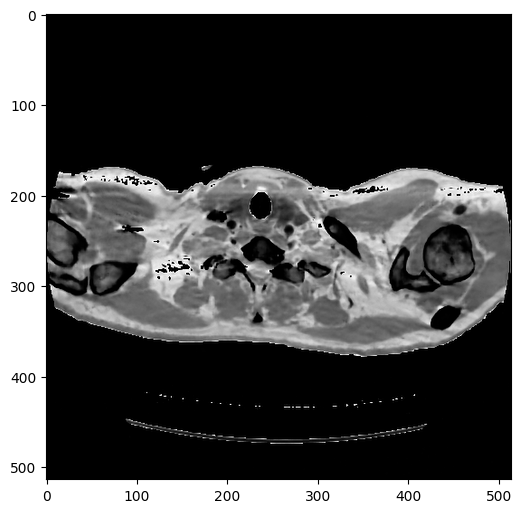

iteration:8100
Iteration 8100 PSNR_MASKED history: [35.790917597697344, 36.62452655013354, 34.15960323101578, 33.85858620407792, 33.47987167418032, 33.28949926737897, 33.35010072065692, 33.24933744055065, 33.29248242791558, 33.38673888487846, 33.41448600784517, 33.72808081370374, 33.779268795088, 33.85051141993509, 33.93062121534636, 33.846113417397696, 34.21064174504193, 34.182074323979336, 34.37848227630806, 34.4575244285493, 34.50378604843749, 34.6242276210583, 34.582921913905935, 34.529079154121064, 34.50108724666544, 34.91424758385287, 34.50607768351881, 35.02486557033131, 35.070891879033326, 35.096683790662304, 35.21217383505628, 35.16742412453747, 35.5032827647055, 35.487533307317115, 35.41235027754807, 35.62847655238157, 35.55083457055766, 35.599041643455166, 35.72355543625952, 35.88192962307205, 35.99753102546959, 36.15053769603769, 35.99870023221772, 36.22493995584858, 36.20937817680279, 36.18559774806877, 36.40031572494665, 36.480808457360794, 36.37267160155908, 36.583946200

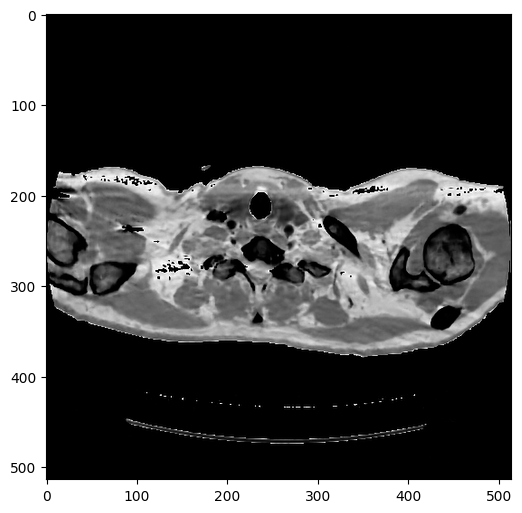

iteration:8200
Iteration 8200 PSNR_MASKED history: [38.38512489012443, 38.36679961462099, 38.37712170606852, 38.51988802989, 38.585881558684264, 38.516558684938346, 38.4261509097763, 38.51146922549633, 38.565717760678794, 38.58425827568459, 38.63292071308014, 38.455436813589, 38.50950571071042, 38.6421759383678, 38.55900489786401, 38.620390157814484, 38.67997371424463, 38.65447068601328, 38.46928413995868, 38.54371133497931, 38.6100924187572, 38.69592936943354, 38.56988902247351, 38.68269735275477, 38.526330679016986, 38.765194736359895, 38.668226755331624, 38.65225111616646, 38.81141214060692, 38.76568733783898, 38.654495245347526, 38.72532443335828, 38.7302061216561, 38.853930936023005, 38.841161971676584, 38.75046694548529, 38.83637184947751, 38.9453608533491, 38.871239991692306, 38.867234698720885, 38.88081734834776, 38.83262001821775, 38.84974350386816, 38.99274280756853, 38.90571702403519, 38.90833556264626, 39.056849272104095, 38.99672212793352, 39.00385102624985, 39.00627700099

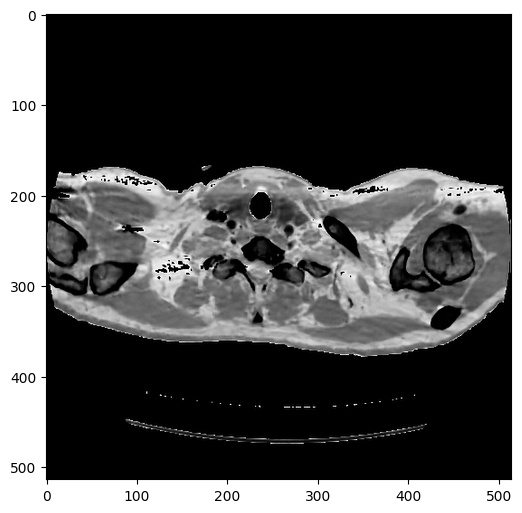

iteration:8300
Iteration 8300 PSNR_MASKED history: [39.441296842715225, 39.44505317711672, 39.53105054081189, 39.43327707524397, 39.48693047927895, 39.50463350847616, 39.50337407605383, 39.37118756235025, 39.60733637410458, 39.42557324440767, 39.501258592930064, 39.50233216677641, 39.604084935867526, 39.511541943821015, 39.46661794233393, 39.4517726228652, 39.6155131829459, 39.51880488596835, 39.56191899307507, 39.561870102321414, 39.67006995565375, 39.63333069093169, 39.66589054387862, 39.56128605033631, 39.64098017272338, 39.56791296970994, 39.64947028477987, 39.63581889364291, 39.63909530490536, 39.66022332110556, 39.61412607340128, 39.57432592976918, 39.73482489572247, 39.65972261075811, 39.731288659397805, 39.6561726704416, 39.616873278676216, 39.71912492563068, 39.719175028775034, 39.75154638803135, 39.69929167147325, 39.63138226736832, 39.732281284269575, 39.673806240486634, 39.74265720480805, 39.78648482183493, 39.72408835057854, 39.66715528454417, 39.72045092195172, 39.7891533

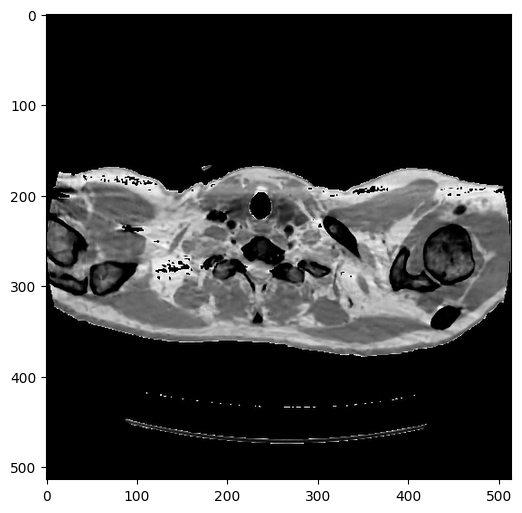

iteration:8400
Iteration 8400 PSNR_MASKED history: [39.86363550111315, 39.964361446483785, 39.954975145477455, 39.97204864749151, 39.961493382197645, 39.946924183356415, 39.994514592164755, 40.06074725803079, 39.8829600107953, 39.91509958972743, 39.98090314678431, 39.94890686708298, 40.108006508880614, 40.04462276307115, 40.001035977861015, 40.012621915079606, 40.08004571328871, 40.074974649250606, 40.08361816951456, 40.11717207891358, 40.10204600407023, 40.01666675054655, 40.09571844375052, 39.96736634765918, 40.107635980652304, 40.08510085039302, 40.0018108002645, 40.01912004782976, 40.0900182114589, 40.06754324727745, 40.164357721076, 39.92141581083957, 40.06039238430994, 40.089943320148855, 40.087629796379275, 39.98602218074907, 39.9837189939801, 40.06813872385652, 40.03980863450029, 40.023512630608394, 40.06208783914371, 40.022061593446246, 40.169314924421755, 40.06616402415289, 40.09057068420986, 40.13319050348501, 40.04066075873585, 40.1397971871169, 40.20288647139651, 40.102948

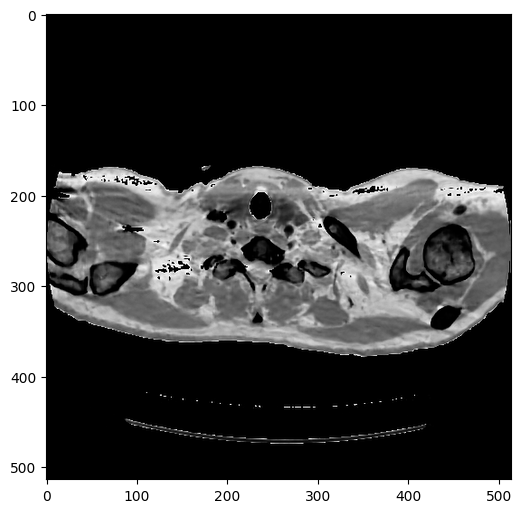

iteration:8500
Iteration 8500 PSNR_MASKED history: [40.21508700409741, 40.22824770220978, 40.26480045258292, 40.28669377316714, 40.14792940435832, 40.27732462494751, 40.215629601298765, 40.176787746952634, 40.29446646467051, 40.33613315929994, 40.27079018872485, 40.19948791085906, 40.38752916908863, 40.29162089194796, 40.35878089477494, 40.38576573505473, 40.23875171260108, 40.24190269407454, 40.34299978312724, 40.351734545349196, 40.24007926104627, 40.26452811710711, 40.370008193250904, 40.33796704053218, 40.38033557636295, 40.30872095980067, 40.31521998235327, 40.28944430539432, 40.341751444476245, 40.40670636225806, 40.30165572150607, 40.372307440462805, 40.41514231993613, 40.24475010048494, 40.336249414217576, 40.380218857021205, 40.344333926785545, 40.38844536478793, 40.42850409440228, 40.434256731982565, 40.42731912135237, 40.429879443554036, 40.43977613519475, 40.439273671023926, 40.46913730285624, 40.44257061073224, 40.4172678093944, 40.49239962860071, 40.52796854834714, 40.438

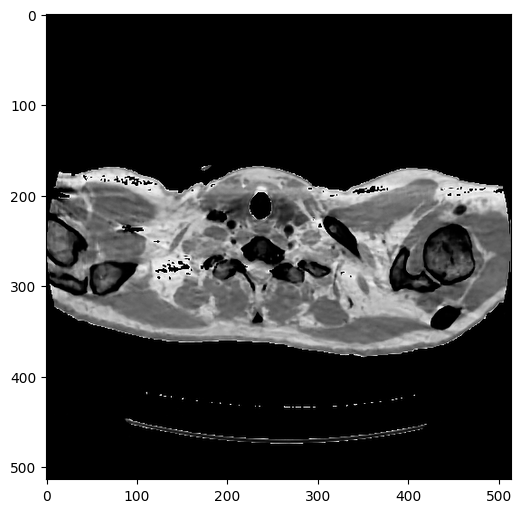

iteration:8600
Iteration 8600 PSNR_MASKED history: [40.502348822589624, 40.51687237189028, 40.47028278153177, 40.49416003405075, 40.658396478404974, 40.472729949812674, 40.5460050866236, 40.55472455711321, 40.59842029124175, 40.63857538555219, 40.59939301658447, 40.51584984554647, 40.506953793894155, 40.59987804044554, 40.5321922610387, 40.48836604216628, 40.57342387855175, 40.65483645692173, 40.5168009632782, 40.45177894464396, 40.35046413563403, 40.640622680690015, 40.46978618270512, 40.36456320712215, 40.43320590758829, 40.65976710618261, 40.531553496855175, 40.43035816997154, 40.58031738888616, 40.60684473241393, 40.46102653655752, 40.66315101168041, 40.56431932919723, 40.58173489558348, 40.60564742688988, 40.58776764465627, 40.576589978558005, 40.63907285678007, 40.58547919302534, 40.62139835629676, 40.55677336458429, 40.62281691037863, 40.69578942837034, 40.69132714915075, 40.643704790865684, 40.64705316789917, 40.65464871893578, 40.56966378913026, 40.652506081958826, 40.64482128

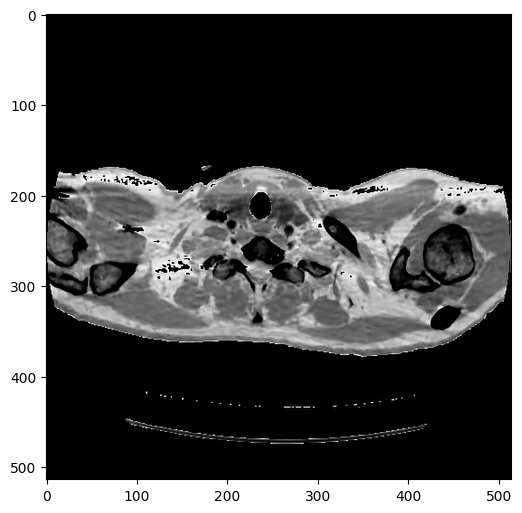

iteration:8700
Iteration 8700 PSNR_MASKED history: [40.77564685385029, 40.78033829849367, 40.736377819150945, 40.82146141186412, 40.67593377213286, 40.688038473430346, 40.91054194199611, 40.699150761938995, 40.769573008558226, 40.757790455232985, 40.70209235998892, 40.67360831233867, 40.81041642605848, 40.68956376759069, 40.83971194479009, 40.82922672808208, 40.75295082062708, 40.77855822386176, 40.87581128109597, 40.797016145656, 40.834570454594456, 40.79518740823535, 40.896832284516414, 40.84718445286191, 40.84715106490521, 40.87664538671539, 40.852163076534154, 40.94346559833546, 40.9113685596821, 40.88894018503193, 40.908063398998124, 40.81632276879864, 40.854517477491854, 40.838681258718665, 40.867772993349675, 40.944847303704115, 40.70485804550937, 40.89547574554982, 40.86696934882642, 40.79754437420371, 40.86559982686266, 40.82708140963285, 40.874408476383024, 40.85484066238975, 40.83720397500766, 40.83295632508994, 40.905551497072096, 40.77546579447626, 40.74607939719107, 40.78

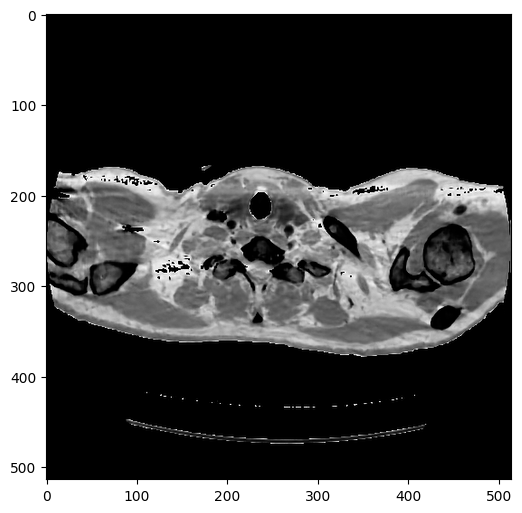

iteration:8800
Iteration 8800 PSNR_MASKED history: [40.695900672752394, 40.77881086738237, 40.94335389303026, 40.79128616100752, 40.58214024626717, 40.672359278559334, 40.5825064669414, 40.769805098431426, 40.850049932223406, 40.82998586985888, 40.70057104101383, 40.7354306042361, 40.748025741272485, 40.69166733179579, 40.90717137948931, 40.90770253482497, 40.75499481981406, 40.70270025846851, 40.800575412512174, 40.85759987068181, 40.85631774504593, 40.901608748190256, 40.79905862404224, 40.75719671614051, 40.965880878982446, 40.85868170122423, 40.9790058802487, 41.00119028449744, 40.869044361241514, 40.94685318397048, 40.739742409513525, 40.92954805737649, 40.94514772264702, 40.86014839455246, 40.85650920285099, 40.916010918141694, 40.671243977363474, 40.941272148555434, 40.8975498983714, 40.832922597539046, 40.8420477741615, 40.851856733191845, 40.865827495155585, 40.87359875635847, 40.90476333075408, 40.95289293042393, 40.956846428036314, 40.91410466986545, 40.85785908451462, 40.86

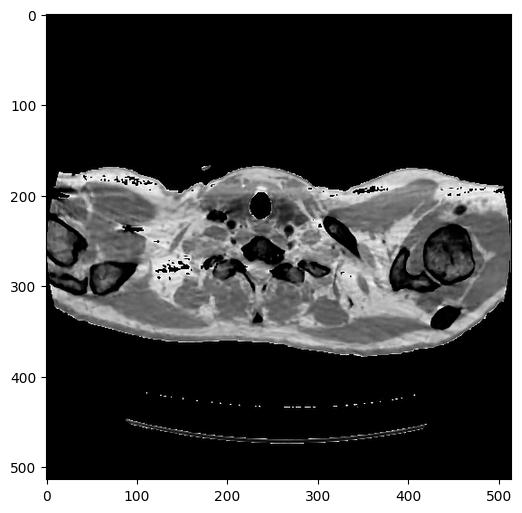

iteration:8900
Iteration 8900 PSNR_MASKED history: [41.04880940862038, 40.89261535188105, 40.85999485806087, 40.97517135083946, 40.91837090230159, 40.99488621711595, 41.02189235575543, 41.08069380359489, 40.969912537376636, 40.90392877008182, 40.85751293561873, 40.965274919459425, 40.989475814518784, 41.08590551162024, 40.93429996719227, 41.02203868109919, 41.00864541984503, 41.070062883484155, 40.873971915580455, 41.00138084509207, 40.97228582114408, 40.976571419559335, 41.00120447765633, 40.95907427100251, 41.08072049172681, 40.95026548527461, 41.038371947664885, 41.04411758879307, 41.045984078530886, 41.058552822679204, 41.089390287481265, 40.974512975881446, 40.990177252827884, 40.95033503387748, 40.982815856252124, 40.96707690645281, 40.95588694437495, 41.056155859645244, 41.06440946132216, 41.04218152170664, 41.06587519266956, 41.04971956896012, 41.018399399320636, 41.05074836484066, 40.9917527613093, 41.01841282994596, 41.11592588339231, 41.02890065610623, 40.890606344695044, 40

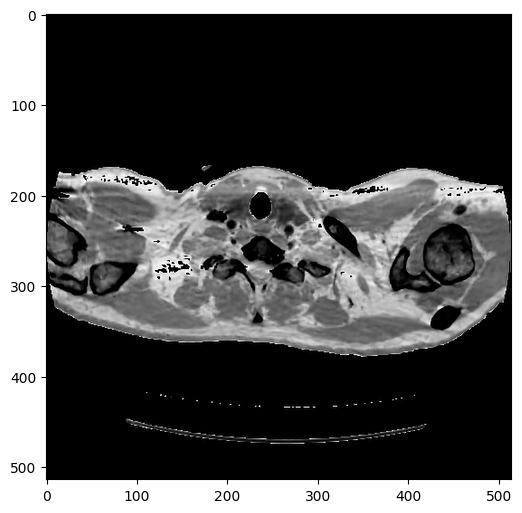

iteration:9000
Iteration 9000 PSNR_MASKED history: [41.164694412304065, 41.289077954466464, 41.142063022161366, 41.03749709670295, 40.96224369716847, 41.051834356447685, 41.18163009248971, 41.14098154081789, 41.06666953205095, 40.982023988918726, 40.982648599275095, 41.02500011097603, 41.0234633504458, 41.07951996107053, 41.03668621095935, 41.19642219929575, 41.07040291074575, 41.02867538217849, 41.19217842977981, 41.137063321661415, 41.196211086939925, 41.18020985583654, 41.26965826335181, 41.13107525829318, 41.209260041024535, 41.19145530326284, 41.227425147678446, 41.166522227434484, 41.13084324748989, 41.20590593940128, 41.289011080912275, 41.33230113550627, 41.128913673905146, 41.21905505458255, 41.203698359456276, 41.13963900816668, 41.30544303134169, 41.214403243180946, 41.22809886417702, 41.25207400325478, 41.180913505076056, 41.255663850326236, 41.285785953745375, 41.157012948621, 41.088311225030516, 41.31261072534556, 41.245648563175806, 41.20426100674148, 41.21977848627009, 

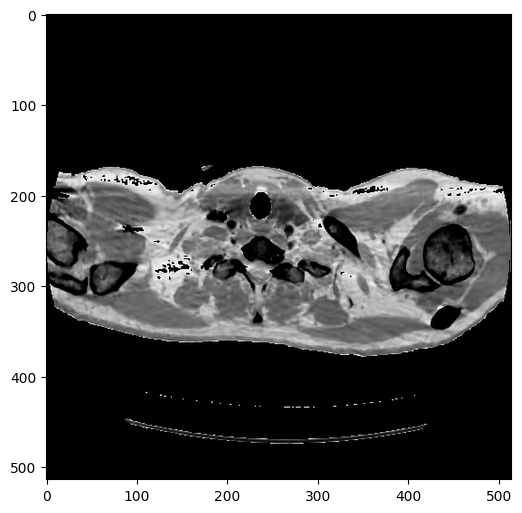

iteration:9100
Iteration 9100 PSNR_MASKED history: [41.273960494505324, 41.281002201739085, 41.26141803065755, 41.279782643361855, 41.1271554455113, 41.03275020821169, 40.90958402821851, 41.014436536996406, 40.90846144459163, 41.08258527331152, 41.262073405903585, 41.19455494734722, 41.279263827939744, 41.18978290062823, 41.253828922227896, 41.260256789310276, 41.20941083060747, 41.190869717742615, 41.241930724779145, 41.40361564068619, 41.347870883025315, 41.34942653316865, 41.39615118248072, 41.43238033892867, 41.33789490766396, 41.48991155312192, 41.38835480461189, 41.421120234497096, 41.4040482351204, 41.4068702980535, 41.380789736730996, 41.49230342588055, 41.382833168247615, 41.35241450046989, 41.39513404740398, 41.417657655402806, 41.20763151225874, 41.3282060301526, 41.27781145838785, 41.046836044983515, 41.034612802672896, 40.799069922430355, 40.67112323762576, 40.355111702216576, 39.89756021112511, 39.52061585610552, 39.38122109079049, 39.77876390924938, 40.67824645090501, 41

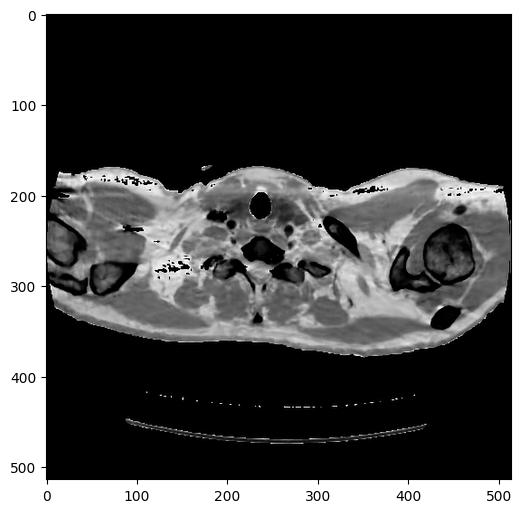

iteration:9200
Iteration 9200 PSNR_MASKED history: [41.260877482141744, 41.258809338960674, 41.21990471543917, 41.30039434712856, 41.28742650576672, 41.24162970801872, 41.409590222878386, 41.26289337922175, 41.40570244674833, 41.23754232021224, 41.15250195071403, 41.31388845164311, 41.209764479858435, 41.11939245353994, 40.97229923439514, 41.09169140480099, 41.109836575720884, 40.990011719959696, 41.04537394974112, 41.00242251927278, 41.099089919001756, 41.135483901797095, 41.31128619277645, 41.42885043413202, 41.34500429543384, 41.34073613539037, 41.2070922768832, 41.121638352941325, 40.91788431826024, 40.91428188435778, 40.8796105171233, 40.832826731992505, 41.09035239659697, 40.92976423085453, 40.90341607024087, 40.597633245877624, 40.55035122764945, 40.08627404895727, 40.02847865919055, 39.82883961842229, 40.126023873303225, 40.75808543625459, 40.976669565024125, 40.98135228676368, 40.714565610064014, 40.39713620332552, 40.619558225639196, 40.893398380112, 41.11208464483191, 41.043

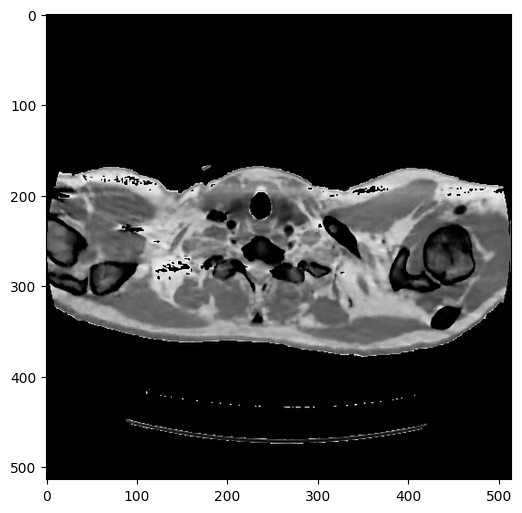

iteration:9300
Iteration 9300 PSNR_MASKED history: [36.491407037847495, 33.85541593250992, 31.206946840903022, 30.721435449307663, 30.070171785703337, 30.162083507151255, 30.325605643248696, 30.134098196046843, 30.424095684733793, 30.368403523735687, 30.76571889500681, 30.979936421816493, 30.893901631994126, 31.070816478768567, 31.060879403707315, 31.458934191188092, 31.420156195967785, 31.420919401313117, 31.40229466351373, 31.71468706974057, 31.46253297094531, 31.885006126775792, 31.841003798470155, 31.967563942476488, 31.860779304965913, 32.01196553038203, 32.065427839564904, 32.16143696458858, 32.53758451844384, 32.32491835120077, 32.730568653710456, 32.64179125989885, 32.70898751598705, 32.88392374446919, 32.930726388578336, 33.026572820466285, 33.29945292971309, 33.31409050067663, 33.48939848841906, 33.64696453791584, 33.44703059210461, 33.549701544114086, 33.80480964359758, 33.71936026368552, 33.86205883185177, 33.8860819073627, 33.8724252517389, 33.946789034048315, 34.041382764

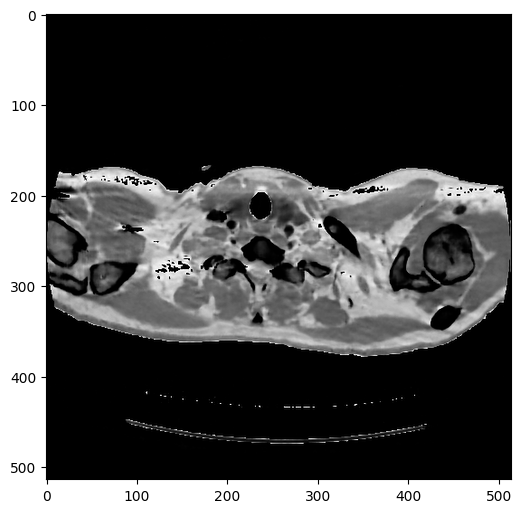

iteration:9400
Iteration 9400 PSNR_MASKED history: [35.986692943470615, 35.90991983839241, 36.00880790783733, 36.11988689848567, 35.90678920170039, 36.07676010274713, 36.13665953528089, 36.03702892994812, 36.16742836081541, 35.94505248550619, 36.27331932443484, 36.192292768469926, 36.147990804925584, 36.10713346187709, 36.29484192717942, 36.12940847052043, 36.26867309021431, 36.32525084412567, 36.23569421287188, 36.272363616099945, 36.41744904891012, 36.378375910675864, 36.26160226266515, 36.31161644723011, 36.482436026782125, 36.471599299438196, 36.32226419978312, 36.30756850162803, 36.56176224686994, 36.51804716226092, 36.26948072018279, 36.594072977798426, 36.450437071035736, 36.55880014966917, 36.60725264868923, 36.622062966787, 36.62618858947014, 36.679721316028434, 36.64681648658139, 36.594226607571656, 36.56109630591058, 36.79674848142638, 36.5553746093168, 36.710106475942425, 36.78165959295079, 36.77130167950811, 36.779613375805106, 36.83812583999498, 36.76859079439769, 36.8855

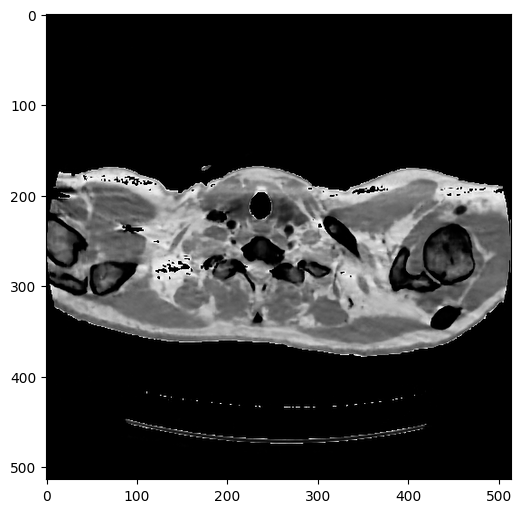

iteration:9500
Iteration 9500 PSNR_MASKED history: [37.50453733662479, 37.597002092067, 37.489768694024896, 37.55651632430675, 37.5483087944349, 37.59265786265902, 37.61342736677855, 37.526292327124075, 37.686829678982114, 37.634738846239664, 37.6284013901306, 37.63012037644357, 37.64169143161414, 37.67466702743876, 37.58180251525476, 37.68542686029218, 37.59957808199449, 37.717159443086786, 37.65115175251396, 37.68967630236476, 37.72659125557893, 37.791498060515984, 37.62237827630163, 37.77817887424408, 37.79886486789477, 37.85512062726353, 37.815571503377875, 37.72535703480973, 37.88328080857183, 37.77532837013014, 37.8754217186797, 37.81867378782092, 37.78061362187516, 37.895271880289194, 37.85107724044677, 37.813195147166645, 37.94462710122296, 37.87243868694275, 37.886206262576835, 37.87967500026444, 37.978574339241355, 37.99459531109633, 37.8953415610239, 37.97376739689795, 37.96238613540374, 38.09338604603528, 37.979840957403674, 38.037906887681785, 38.004952915071534, 37.940145

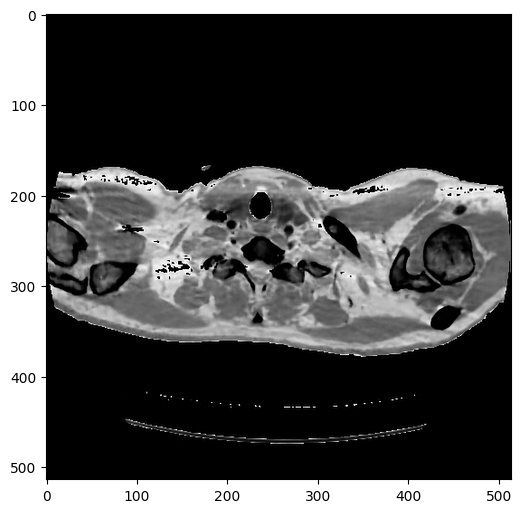

iteration:9600
Iteration 9600 PSNR_MASKED history: [38.1941142813598, 38.273238605013454, 38.348560887894976, 38.282977336802695, 38.30932591059084, 38.494097925213005, 38.24199972304273, 38.36908976623731, 38.30668496547884, 38.29924564939981, 38.33867168676718, 38.29631404436864, 38.4574623820277, 38.29670999748884, 38.26224860372947, 38.45358101872072, 38.35251052408255, 38.494913190261386, 38.38843752557707, 38.44289655863491, 38.39064015012356, 38.49206084479237, 38.49324860705969, 38.499493812674984, 38.471014646373135, 38.48285382117104, 38.463757570314804, 38.52817416902524, 38.55546492620471, 38.59993806888757, 38.47412222518933, 38.56632472505215, 38.61236927209424, 38.50182324749202, 38.53188456135318, 38.544075646700605, 38.648104728291905, 38.58093657866954, 38.582534864304264, 38.718032503097646, 38.68995340001841, 38.58316710906283, 38.67800485759561, 38.67096910820492, 38.56891250918495, 38.56419265332737, 38.553518908016784, 38.60690094697928, 38.55311214164533, 38.637

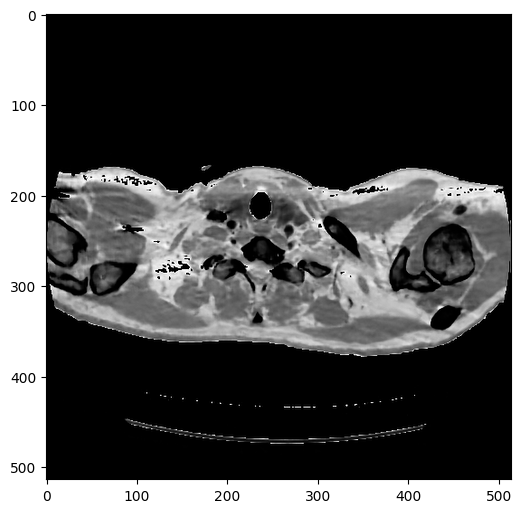

iteration:9700
Iteration 9700 PSNR_MASKED history: [38.99417133523241, 38.797549737228906, 38.873340616301874, 38.879782759895534, 38.9681725647489, 38.90464561806765, 38.97175256768049, 38.826568060965904, 38.989858722440395, 38.95692679928473, 38.783589011552685, 38.91148427967147, 38.87937340997622, 38.97192513083191, 38.93641688572801, 38.92874004273796, 39.0264694228393, 39.016699064799425, 39.09928105562412, 38.96234688824115, 39.075429318879095, 38.98700111669286, 39.04560564260228, 38.941245034620934, 38.828744197482465, 39.02263853532861, 38.86478674806789, 39.07151290114074, 39.08392650239136, 38.98084881953941, 38.986243702969944, 39.11391378028948, 39.07199129071867, 39.06573838551994, 39.03734687659413, 39.063506746184714, 39.084774010500226, 39.01987790174543, 39.179514772103936, 39.00594855216773, 39.14258707366557, 39.116163728668745, 39.068586648266816, 39.186125594534474, 39.14756385821829, 39.0936122566744, 39.128360200184645, 39.16599692400637, 39.156924760302196, 3

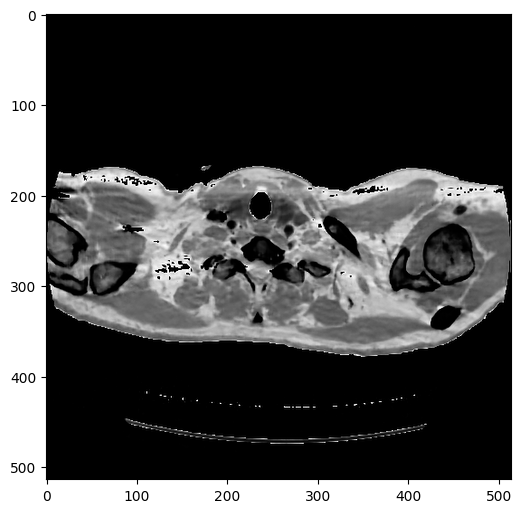

iteration:9800
Iteration 9800 PSNR_MASKED history: [39.2923135607426, 39.29569776982222, 39.13983418804758, 39.346196628122584, 39.35207763030175, 39.220280930335186, 39.351795402322665, 39.298408475302715, 39.25284311263147, 39.32253413470429, 39.24105595118367, 39.4274291755402, 39.342961093707494, 39.401383420837334, 39.42921332314471, 39.338746547585316, 39.345514257312374, 39.410695810135294, 39.4179414686039, 39.44006306791847, 39.46144093427148, 39.54869540291845, 39.44618057181256, 39.38400131674192, 39.503149752145795, 39.41420564406134, 39.45027299495361, 39.42266269633575, 39.52815735029468, 39.44089396522696, 39.48503374249909, 39.479514051755615, 39.513909992739286, 39.451456341309154, 39.51236686137671, 39.37818321062758, 39.37350008387313, 39.58907598320428, 39.408029013878384, 39.486699978569874, 39.47769969648562, 39.334248579310824, 39.31624433025825, 39.53352789101137, 39.39452105445972, 39.47292145792653, 39.501645195543375, 39.511578758105045, 39.41102083604833, 39

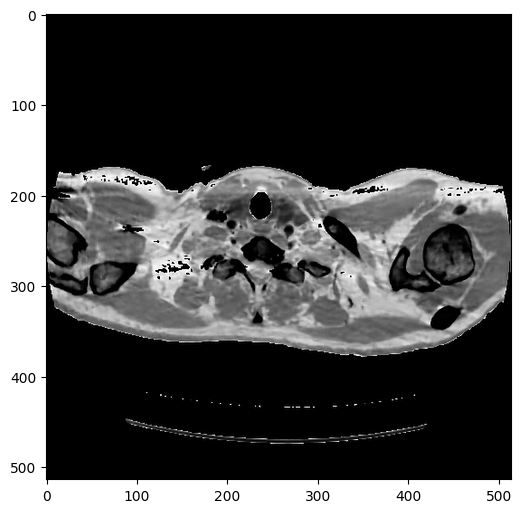

iteration:9900
Iteration 9900 PSNR_MASKED history: [39.68863637004511, 39.67306333697319, 39.67695397006083, 39.61822402706351, 39.63784856148186, 39.75536082522497, 39.69475836979893, 39.760813340012504, 39.647504524179126, 39.79797832071823, 39.7183318959217, 39.71877823190385, 39.75684483794399, 39.736749756494184, 39.786141774801976, 39.833049687092135, 39.819427363983074, 39.78860678902093, 39.82350604129613, 39.67694232382103, 39.82418955771965, 39.73802389963737, 39.83196588693145, 39.82013503939583, 39.7333637304332, 39.825040639073684, 39.91779128506996, 39.83644525502464, 39.79253958532932, 39.827931854540765, 39.810608892833706, 39.85187656507274, 39.83660308343447, 39.85268467972473, 39.89023256112746, 39.87012449637263, 39.78306382798855, 39.83894648351618, 39.880343008309104, 39.93058796878562, 39.83854212770536, 39.909906494891686, 39.91284700668216, 39.89760279962817, 39.785675599832, 39.91264274900282, 39.92711749280006, 39.8555891610718, 39.88190995183941, 39.95445531

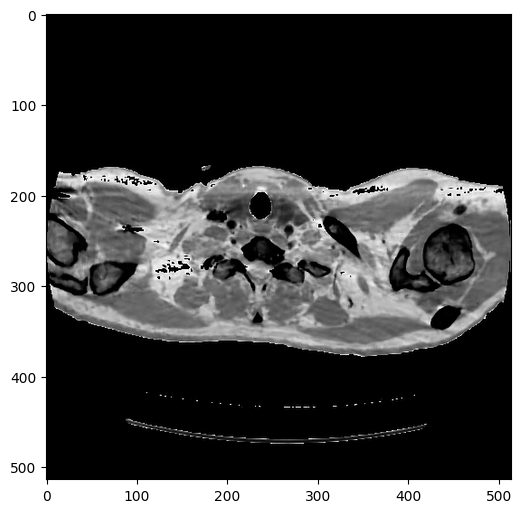

iteration:10000
Iteration 10000 PSNR_MASKED history: [39.95505382055552, 40.11646028582349, 39.98018025736754, 39.946160281988824, 39.931354822519296, 39.97863331577718, 40.02148078290258, 40.01071077695219, 40.02256062773632, 39.990698424814525, 40.005241690635856, 40.027951195576165, 39.99569968652045, 39.989071389859035, 39.91904309535429, 40.06941520980376, 40.029718511407744, 40.05747915515617, 40.04277348677377, 40.12430967685844, 40.08029959282631, 40.11944015849383, 40.103240340757296, 40.14681759488572, 40.11885913942664, 40.10251129504411, 40.18138705341039, 40.18261285276874, 40.03239494692218, 39.999771367085614, 40.091343422658795, 40.220897553406665, 40.185510805814246, 40.25631022063267, 40.15764321439995, 40.148780252406056, 40.19543550576969, 40.11185015866261, 40.21959362864905, 40.14300008812314, 40.20929509204829, 40.268971080203706, 40.16690765309505, 40.10398809029126, 40.191150632954766, 40.135941404456844, 40.14505106565866, 40.01932702164713, 40.08966551910334,

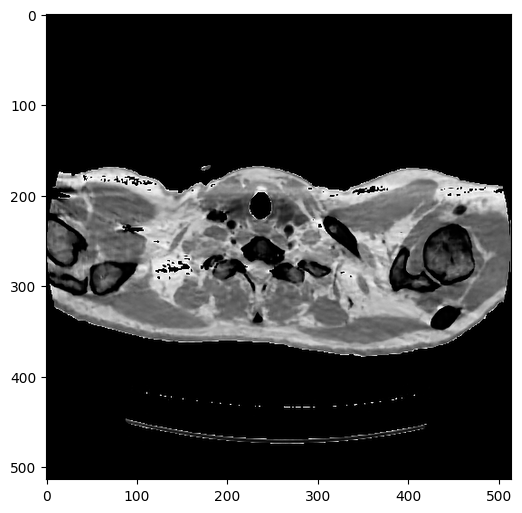

iteration:10100
Iteration 10100 PSNR_MASKED history: [40.382495904696476, 40.33056459502164, 40.303343228287076, 40.30697740524281, 40.411228717848964, 40.18021315587278, 40.31202660591677, 40.30599378636536, 40.323626477645135, 40.326971788951354, 40.33658949914159, 40.38040491313475, 40.33147233259654, 40.39658557928693, 40.463333318485304, 40.364032078279635, 40.37633628962517, 40.41471185003289, 40.48448059327106, 40.40770803886136, 40.34548707366176, 40.34274594221394, 40.45544732136935, 40.47281256543628, 40.35621460325014, 40.305793609634605, 40.39824877424799, 40.418045095589434, 40.42965636628352, 40.37891496511673, 40.46829219114744, 40.50510648855528, 40.47268525516121, 40.49286563433739, 40.412008667040276, 40.22174840016788, 40.4923493542849, 40.3582941311023, 40.44300700251908, 40.39712293813231, 40.346489435521356, 40.368826890184565, 40.38293231158597, 40.39666695138897, 40.53725879434139, 40.4006870040616, 40.531143581817076, 40.54277351607556, 40.499737055858176, 40.4

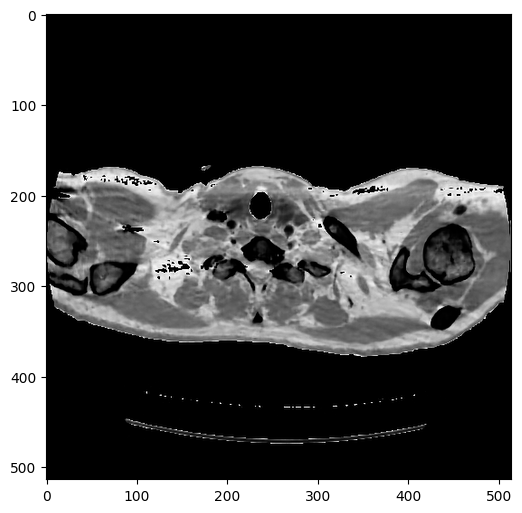

iteration:10200
Iteration 10200 PSNR_MASKED history: [40.49758876332173, 40.491005653038314, 40.603057281869894, 40.56767929742304, 40.56815924660068, 40.60620162062551, 40.614569595341905, 40.55581048376341, 40.48997217103192, 40.66494971603025, 40.6273681999129, 40.62065679775781, 40.579866214759704, 40.645448582893515, 40.530501903099406, 40.575812929263165, 40.54956503968026, 40.57685412211251, 40.69280933897634, 40.61126331840689, 40.65122846861584, 40.58544837828289, 40.45681920875353, 40.61553612740089, 40.44612762924871, 40.467968662835375, 40.55832407864021, 40.61216451857565, 40.65159177388981, 40.52809217884715, 40.51799448058651, 40.43580341002527, 40.36939397022418, 40.50214089199809, 40.58380393714998, 40.4882490888219, 40.571650529769094, 40.63740940099608, 40.547255209094224, 40.56287335913085, 40.62250139590974, 40.59512913979168, 40.52101761588071, 40.50531214857929, 40.72407791148138, 40.60376453244772, 40.61524104970516, 40.62441962465624, 40.58496384073396, 40.7069

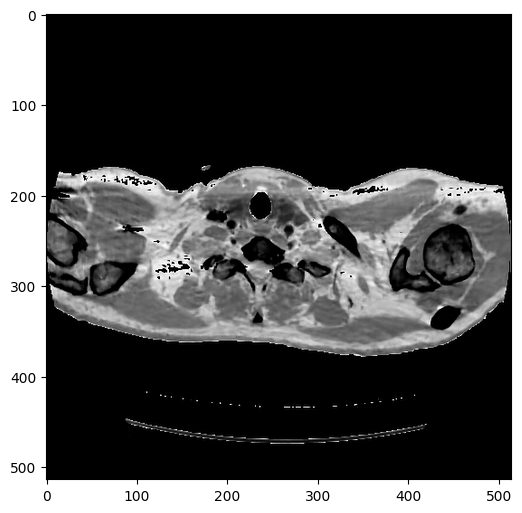

iteration:10300
Iteration 10300 PSNR_MASKED history: [40.60549144398009, 40.624502524979135, 40.623794004129444, 40.545866561790696, 40.57081332430812, 40.54729210240317, 40.47649568652702, 40.537161627763616, 40.391359515497605, 40.514549824144495, 40.341700302089365, 40.37849548687348, 40.397254396109076, 40.54083173659487, 40.636465753328174, 40.666802618117764, 40.78408778637098, 40.7015179312641, 40.56917651196918, 40.50713522200035, 40.591128767655114, 40.621995173224974, 40.436894230233264, 40.598270764372614, 40.56213531738766, 40.58032717955495, 40.68188477161037, 40.61751894245202, 40.542783213455536, 40.68298266135341, 40.72337991200765, 40.641773586032514, 40.66184780554681, 40.69106493949273, 40.68954042219183, 40.71664641282279, 40.711244097397326, 40.76985870721543, 40.85939927444996, 40.7741831708242, 40.61872546525745, 40.55231571116772, 40.507361997464756, 40.38346230514043, 40.294648424812884, 40.281895969765024, 40.38874315845532, 40.6552309024817, 40.85981011985095

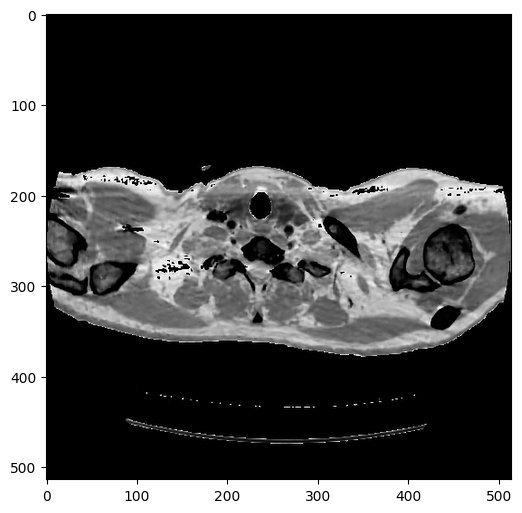

iteration:10400
Iteration 10400 PSNR_MASKED history: [41.0551742043626, 41.098045185569354, 41.01717758278517, 40.99172323382686, 41.11187163103499, 41.115949018783276, 41.04580471927352, 41.027769576827936, 40.9437005445476, 41.099837222582785, 41.075758536966795, 41.21288955841392, 40.92117595454955, 40.959616738912466, 40.81635920946379, 40.70236686476291, 40.77029985988354, 40.669171894301215, 40.74908948774376, 40.84955242104062, 40.95493520310852, 40.99372349075003, 41.06573651099495, 41.08756347014833, 40.95999439737642, 40.88471172723683, 40.81940826392539, 40.73742838363139, 40.7204981052024, 40.750471302534095, 40.87474019571491, 40.844971294838444, 40.970323843454885, 41.11027838088532, 41.04895204868113, 41.096167572464296, 41.11939702988617, 41.03104200719551, 41.02589609841664, 41.20165451552592, 41.096254224307984, 41.109970623414085, 40.93104475923522, 41.005605171742296, 40.823574736154, 40.79220219856061, 40.745903925213796, 40.75812484555585, 40.70827201533788, 40.91

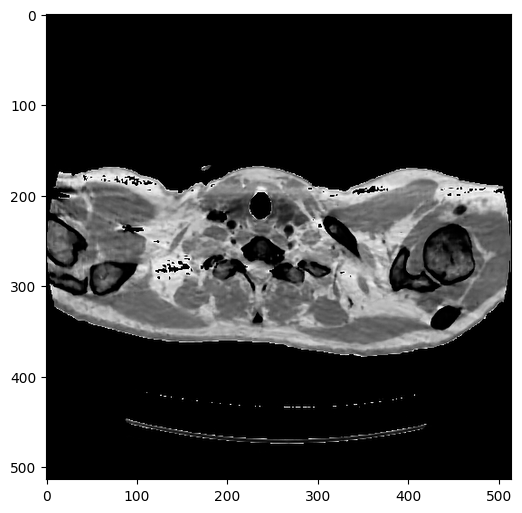

iteration:10500
Iteration 10500 PSNR_MASKED history: [41.24387967668496, 41.08761632030324, 41.005987180159565, 41.259367580835175, 41.03776663759281, 41.081137792384865, 41.04765994502163, 41.091807664011846, 41.26904500985421, 41.08565093114888, 41.134760118376484, 40.86692466437481, 40.83080348106656, 40.630397435963474, 40.49564943823759, 40.295984844917385, 40.317710555286794, 40.511136949371405, 40.766399054120406, 40.857108808814075, 41.032753971258735, 40.95668625070364, 40.88396700503942, 40.84793825010599, 40.64229123297467, 40.651517462964826, 40.70900946879825, 40.95256014256435, 41.13260804752148, 40.914872127062594, 40.778236123255745, 41.05326475494049, 41.04133205957881, 40.897305705858045, 40.8122358726302, 41.04011225573909, 41.147544677776864, 41.02214456625531, 40.9078115098358, 41.06721356145562, 41.15300563325106, 41.016655039235516, 41.017429751209136, 41.17616206946263, 41.10135516281345, 41.149236962547995, 41.19098598443129, 41.2143414628071, 41.2067121467455,

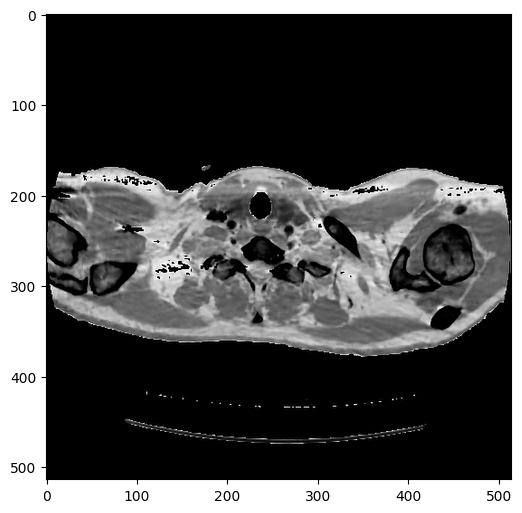

iteration:10600
Iteration 10600 PSNR_MASKED history: [41.304030370512336, 41.194205827384025, 41.22390681352765, 41.34731820385817, 41.41864436105786, 41.38727046984778, 41.31036793406534, 41.26329731727165, 41.331961751913624, 41.33860990426215, 41.40566918792507, 41.449115539925884, 41.412589095879795, 41.26534011259106, 41.26807146012466, 41.29972077121324, 41.31260294478848, 41.451768253414976, 41.22794392445256, 41.24530314491721, 41.185411953146634, 41.086900997068454, 41.08147326081509, 40.9835855239653, 41.06407708409676, 41.13075363828998, 41.34952663247507, 41.45476204231713, 41.49632486920588, 41.487913633390505, 41.50275142593174, 41.49735179292841, 41.48689942885164, 41.47029505659564, 41.465780985634844, 41.46277008587899, 41.46378627882192, 41.45482668868242, 41.459472847007405, 41.331770951668325, 41.376710401968246, 41.249791060271875, 41.27929576310949, 40.903307796850385, 41.0548100267916, 41.0316878536355, 41.12786090553825, 40.83747330216439, 40.74088469918227, 39.

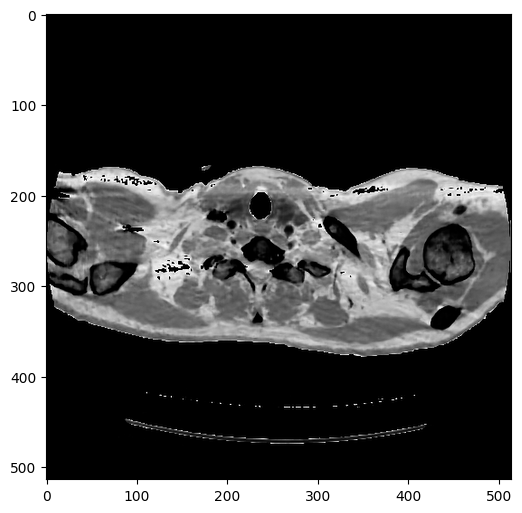

iteration:10700
Iteration 10700 PSNR_MASKED history: [39.19303694858189, 39.47579037033472, 39.285735773506694, 39.612606893241, 39.182825425718576, 39.57941763814487, 39.24302761682216, 39.55907695678141, 39.61867916523428, 39.34660074933222, 39.501233663381385, 39.59677364671522, 39.4604555904711, 39.71112345141374, 39.61138191736013, 39.640108590245035, 39.49603060844163, 39.685609845020444, 39.69036703042931, 39.64728815095177, 39.386094251329986, 39.53916207867584, 39.49214655918354, 39.54306839914257, 39.5060449752929, 39.61261680879429, 39.623167927347296, 39.80294538499039, 39.86923958068238, 39.331608397263565, 39.87434046768156, 39.749260947040526, 39.79329681983351, 39.856296804153494, 39.853971007860444, 39.99736490894017, 39.91034146611449, 39.89136731836445, 39.98283262526919, 39.84538281829344, 40.15115966054947, 40.15371486960099, 40.07463422257579, 39.93938745712289, 40.11263357325072, 40.13453743442451, 40.31634420965596, 40.344661967480924, 40.225740678103676, 40.184

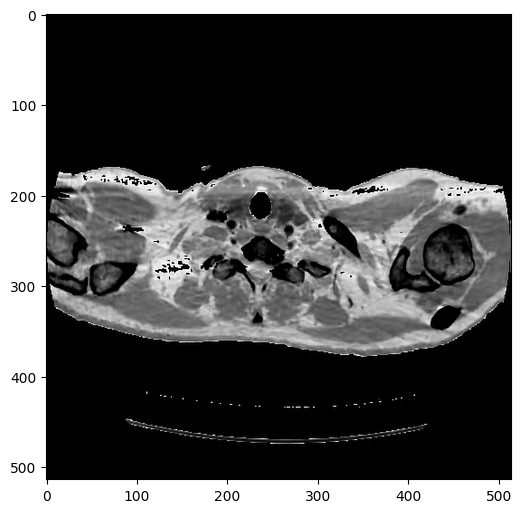

iteration:10800
Iteration 10800 PSNR_MASKED history: [41.17603927437929, 41.231486236795774, 41.16710152054411, 41.050054119628015, 41.15475021756162, 41.17525123673967, 41.176443131459344, 41.26752737508934, 41.25690809644291, 41.21135360834604, 41.06825020830212, 41.202979606111214, 41.198564111455774, 41.15923166635366, 41.33843825221681, 41.07528007443125, 41.11043953601535, 41.13314898802137, 41.14292505858305, 41.126424702363416, 41.175396918068685, 41.319751657292166, 41.207963078015695, 41.04917322689097, 40.90621189225922, 41.03564860428346, 41.13298788785882, 41.25472528819011, 41.2379025511557, 41.24738527947966, 41.26198821351682, 41.33831324878671, 41.19570457105393, 41.39403324300507, 41.341943889509224, 41.368271519895934, 41.319596624618725, 41.369373380126355, 41.389604820695894, 41.37243249258915, 41.25000564459803, 41.49091199544476, 41.44727732914882, 41.33775550985818, 41.3449019781929, 41.39996634960819, 41.4144303438233, 41.44289276324421, 41.38795702531823, 41.3

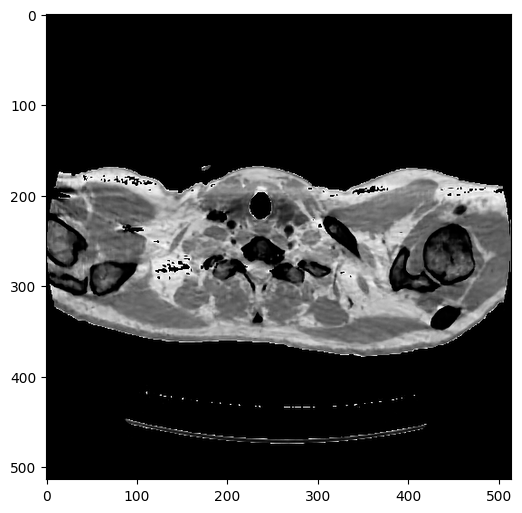

iteration:10900
Iteration 10900 PSNR_MASKED history: [41.53269895115755, 41.389243958076406, 41.22610874114233, 41.127735002328045, 41.13747105140291, 41.03946902138194, 41.24787972456264, 41.50381711017353, 41.645002771609015, 41.62020907202152, 41.598410550844555, 41.39559612275001, 41.35117832923391, 41.443787111448685, 41.48543718036418, 41.50825687654817, 41.64655710178282, 41.66676624551247, 41.675385957939824, 41.51680279956054, 41.602156214097775, 41.711149733762554, 41.69802679972979, 41.74760292316856, 41.68037700004209, 41.81639027094385, 41.745770024602976, 41.75981178241191, 41.689051532207024, 41.62810529728097, 41.49756233014784, 41.603594590723404, 41.57255677326734, 41.696991773641905, 41.675178704185996, 41.676742538423156, 41.678598141130735, 41.60029672028742, 41.273737092215946, 41.17673973738395, 40.80535803606945, 40.52829768892833, 40.23988422635071, 40.27383123208811, 40.37723454923956, 40.83401968713301, 41.47644941503593, 41.59487662895784, 41.19346544721742,

In [ ]:
psrn_masked_list = []
psrn_list = []

def closure():

    global i, psrn_masked_last, last_net, net_input

    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = net(net_input)

    total_loss = mse(out * mask_var, img_var * mask_var)
    total_loss.backward()

    psrn_masked = peak_signal_noise_ratio(img_masked, out.detach().cpu().numpy()[0] * img_mask_np)
    psrn = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0])

    print ('Iteration %05d    Loss %f PSNR_masked %f PSNR %f' % (i, total_loss.item(), psrn_masked, psrn),'\r', end='')


    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)

        # Backtracking
        if psrn_masked - psrn_masked_last < -5:
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.cpu() for x in net.parameters()]
            psrn_masked_last = psrn_masked

        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1)


        total_psrn_masked_sum = sum(psrn_masked_list)
        total_psrn_sum = sum(psrn_list)

        avg_psrn_masked = total_psrn_masked_sum / len(psrn_masked_list) if psrn_masked_list else 0
        avg_psrn = total_psrn_sum / len(psrn_list) if psrn_list else 0

        print(f"iteration:{i}")
        print(f"Iteration {i} PSNR_MASKED history: {psrn_masked_list[-show_every:]}")
        print(f"Iteration {i} PSNR history: {psrn_list[-show_every:]}")

        print(f"Average psrn_masked over iterations: {avg_psrn_masked:.2f}")
        print(f"Average psrn over iterations: {avg_psrn:.2f}")
    psrn_masked_list.append(psrn_masked)
    psrn_list.append(psrn)



    i += 1

    return total_loss

# Init globals
last_net = None
psrn_masked_last = 0
i = 0

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

# Run
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR=LR, num_iter=num_iter)

In [ ]:
psrn_array = np.column_stack((np.arange(len(psrn_list)), psrn_list))
psrn_masked_array = np.column_stack((np.arange(len(psrn_masked_list)), psrn_masked_list))

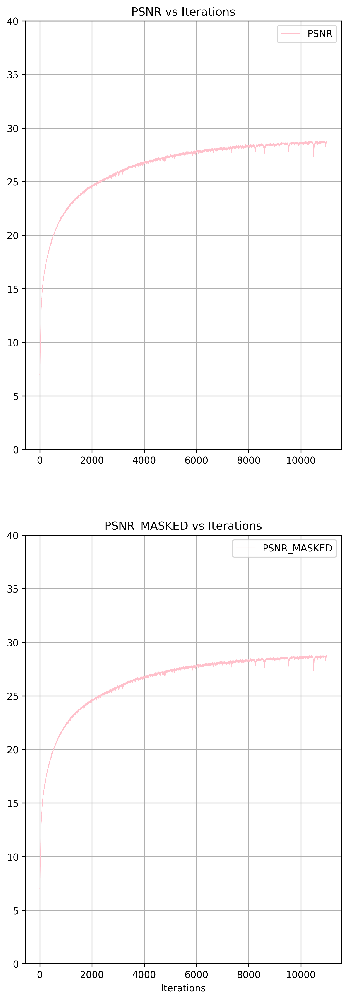

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(nrows=2, figsize=(6, 18), dpi=300)


if not isinstance(axs, np.ndarray):
    axs = np.array([axs])

axs[0].plot(psrn_array[:, 0], psrn_array[:, 1], label='PSNR', linewidth=0.5, color='pink' )
axs[0].set_title('PSNR vs Iterations')
axs[0].set_ylim(0.000, 40)
axs[0].grid(True)
axs[0].legend()

axs[1].plot(psrn_array[:, 0], psrn_array[:, 1], label='PSNR_MASKED', linewidth=0.5, color='pink' )
axs[1].set_title('PSNR_MASKED vs Iterations')
axs[1].set_ylim(0.000, 40)
axs[1].grid(True)
axs[1].legend()

plt.xlabel('Iterations')
plt.show()

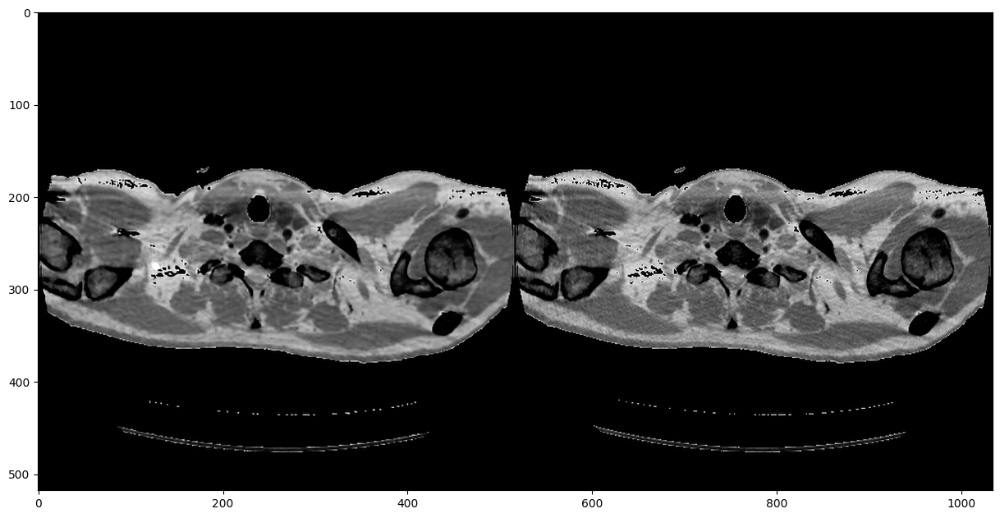

In [ ]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);